# DataForSEO Topic Graph - DAG Analysis

This notebook analyzes the DataForSEO topic graph as a Directed Acyclic Graph (DAG) using NetworkX.

In [3]:
#conda install -c conda-forge numpy scikit-learn
#!pip install -U umap-learn scikit-learn
#!pip install faiss-cpu


In [4]:
import json
import networkx as nx
import matplotlib as mpl
import matplotlib.pyplot as plt
from collections import defaultdict
import pprint
import umap
import faiss # for fast KNN

## Load the Topic Graph

In [5]:
# Load the JSON file
#JSON = '../deepfabric-dataforseo-blog/dataforseo-topic-graph.jsonl'
JSON = 'seo-graph-10tools-single-5depth.json'

with open(JSON, 'r') as file:
    data = json.load(file)

print(f"Total nodes: {len(data['nodes'])}")
print(f"Root ID: {data.get('root_id', 'N/A')}")

Total nodes: 3906
Root ID: 0


## Build NetworkX DiGraph from Topic Data

In [103]:
import networkx as nx
from collections import deque

# Create a directed graph
G = nx.DiGraph()

# Add nodes 
for node_id, node_data in data['nodes'].items():
    G.add_node(
        str(node_id),
        topic=node_data.get('topic', ''),
        metadata=node_data.get('metadata', {})
    )

    # Add edges from parent to children
    for child_id in node_data.get('children', []):
        G.add_edge(str(node_id), str(child_id))

# Compute depth
roots = [n for n in G.nodes if G.in_degree(n) == 0]
for root in roots:
    G.nodes[root]['depth'] = 0
    queue = deque([(root, 0)])

    while queue:
        node, depth = queue.popleft()
        for child in G.successors(node):
            # Avoid overwriting if already set 
            if 'depth' not in G.nodes[child]:
                G.nodes[child]['depth'] = depth + 1
                queue.append((child, depth + 1))

print(f"Graph has {G.number_of_nodes()} nodes and {G.number_of_edges()} edges")


Graph has 3906 nodes and 3939 edges


## Verify it's a Valid DAG

In [104]:
# Check if it's a DAG
is_dag = nx.is_directed_acyclic_graph(G)
print(f"Is this a valid DAG? {is_dag}")

if not is_dag:
    # Find cycles if any
    try:
        cycles = list(nx.simple_cycles(G))
        print(f"Found {len(cycles)} cycles")
        if cycles:
            print("First cycle:", cycles[0])
    except:
        print("Could not detect cycles")

Is this a valid DAG? True


## Display All Topics

In [105]:
# Display all topics with their properties
print("=" * 100)
for node_id in G.nodes():
    topic = G.nodes[node_id]['topic']
    depth = G.nodes[node_id]['depth']
    children_count = G.out_degree(node_id)  # Number of outgoing edges
    parents_count = G.in_degree(node_id)    # Number of incoming edges
    
    print(f"ID: {node_id:4s} | Depth: {depth} | Parents: {parents_count} | Children: {children_count:2d}")
    print(f"  Topic: {topic}")
    print()

ID: 0    | Depth: 0 | Parents: 0 | Children: 16
  Topic: Generate diverse SEO tasks using 10 core tools calling a single tool


ID: 1    | Depth: 1 | Parents: 1 | Children: 11
  Topic: Identifying and Categorizing the 10 Core SEO Tools

ID: 2    | Depth: 1 | Parents: 1 | Children: 11
  Topic: Strategies for Diverse SEO Task Generation

ID: 3    | Depth: 1 | Parents: 1 | Children: 10
  Topic: Architecting a Single Tool for Multi-Tool SEO Integration

ID: 4    | Depth: 1 | Parents: 1 | Children: 10
  Topic: Automated Workflow Design for SEO Task Generation

ID: 5    | Depth: 1 | Parents: 1 | Children:  6
  Topic: Metrics for Evaluating Diversity and Effectiveness of Generated SEO Tasks

ID: 11   | Depth: 1 | Parents: 3 | Children:  5
  Topic: Workflow Stages and Task Sequencing

ID: 12   | Depth: 1 | Parents: 4 | Children:  5
  Topic: API Integration and Data Exchange Protocols

ID: 13   | Depth: 1 | Parents: 3 | Children:  5
  Topic: Automated Decision-Making and Logic Branching

ID: 14

## DAG Analysis - Basic Statistics

In [106]:
# Find root nodes (no incoming edges)
root_nodes = [n for n in G.nodes() if G.in_degree(n) == 0]
print(f"Root nodes: {len(root_nodes)}")
for root in root_nodes:
    print(f"  - {root}: {G.nodes[root]['topic']}")

print()

# Find leaf nodes (no outgoing edges)
leaf_nodes = [n for n in G.nodes() if G.out_degree(n) == 0]
print(f"Leaf nodes: {len(leaf_nodes)}")
print(f"First 10 leaf topics:")
for leaf in leaf_nodes[:10]:
    print(f"  - {leaf}: {G.nodes[leaf]['topic']}")

Root nodes: 1
  - 0: Generate diverse SEO tasks using 10 core tools calling a single tool


Leaf nodes: 3125
First 10 leaf topics:
  - 786: Purpose and Benefits of Circuit Breaker
  - 787: States of a Circuit Breaker (Closed, Open, Half-Open)
  - 788: Implementation Details and Configuration Parameters
  - 789: Integration with Other Resilience Patterns (e.g., Retry, Timeout)
  - 790: Real-world Use Cases and Examples
  - 801: Isolation Principle
  - 802: Resource Pools and Partitioning
  - 803: Failure Containment
  - 804: Implementation in Microservices
  - 805: Bulkhead vs. Circuit Breaker


## Topological Sort

In [107]:
# Get topological ordering (valid processing order)
if is_dag:
    topo_order = list(nx.topological_sort(G))
    print(f"Topological order (first 20 nodes):")
    for i, node_id in enumerate(topo_order[:20]):
        print(f"{i+1}. {node_id}: {G.nodes[node_id]['topic'][:80]}...")
else:
    print("Cannot perform topological sort on a graph with cycles")

Topological order (first 20 nodes):
1. 0: Generate diverse SEO tasks using 10 core tools calling a single tool
...
2. 1: Identifying and Categorizing the 10 Core SEO Tools...
3. 2: Strategies for Diverse SEO Task Generation...
4. 3: Architecting a Single Tool for Multi-Tool SEO Integration...
5. 4: Automated Workflow Design for SEO Task Generation...
6. 5: Metrics for Evaluating Diversity and Effectiveness of Generated SEO Tasks...
7. 21: Breakdown by SEO Functionality (e.g., Keyword Research, On-Page, Off-Page)...
8. 23: Criteria for Selecting Core SEO Tools...
9. 25: Evolution of SEO Tools and Future Trends...
10. 27: Content-Type Specific Task Generation...
11. 28: Keyword Research-Driven Task Diversification...
12. 29: Competitor Analysis for Task Gap Identification...
13. 30: Audience Segmentation for Tailored SEO Tasks...
14. 6: API Integration Strategies for Core SEO Tools...
15. 7: Unified Data Model Design for Consolidated SEO Insights...
16. 8: User Interface (UI) / User Expe

## Depth Level Analysis

In [108]:
# Group nodes by depth
depth_groups = defaultdict(list)
for node_id in G.nodes():
    depth = G.nodes[node_id]['depth']
    depth_groups[depth].append(node_id)

print("Nodes per depth level:")
for depth in sorted(depth_groups.keys()):
    print(f"  Depth {depth}: {len(depth_groups[depth])} nodes")

print(f"\nMaximum depth: {max(depth_groups.keys())}")

Nodes per depth level:
  Depth 0: 1 nodes
  Depth 1: 16 nodes
  Depth 2: 69 nodes
  Depth 3: 345 nodes
  Depth 4: 1725 nodes
  Depth 5: 1750 nodes

Maximum depth: 5


## Find Ancestors and Descendants

In [109]:
# Example: Find all ancestors and descendants of a specific node
# Change this to any node ID you're interested in
example_node = '1'  # First child of root

if example_node in G.nodes():
    print(f"Analyzing node {example_node}: {G.nodes[example_node]['topic']}")
    print()
    
    # Ancestors (all nodes that can reach this node)
    ancestors = nx.ancestors(G, example_node)
    print(f"Ancestors ({len(ancestors)}):")
    for anc in list(ancestors)[:5]:
        print(f"  - {anc}: {G.nodes[anc]['topic'][:60]}...")
    
    print()
    
    # Descendants (all nodes reachable from this node)
    descendants = nx.descendants(G, example_node)
    print(f"Descendants ({len(descendants)}):")
    for desc in list(descendants)[:5]:
        print(f"  - {desc}: {G.nodes[desc]['topic'][:60]}...")

Analyzing node 1: Identifying and Categorizing the 10 Core SEO Tools

Ancestors (1):
  - 0: Generate diverse SEO tasks using 10 core tools calling a sin...

Descendants (1716):
  - 2839: Data Standardization and Normalization...
  - 220: Integrating Ahrefs API with Dashboards and Other Tools...
  - 315: Security in SOAP (WS-Security)...
  - 585: Choosing the Right Backlink Analysis Tool...
  - 1165: Lifecycle Management of Content Entities...


## Find Paths Between Nodes

In [110]:
# Find all paths from root to a leaf node
if root_nodes and leaf_nodes:
    root = root_nodes[0]
    leaf = leaf_nodes[0]
    
    if nx.has_path(G, root, leaf):
        # Get all simple paths
        all_paths = list(nx.all_simple_paths(G, root, leaf))
        print(f"Found {len(all_paths)} path(s) from root '{root}' to leaf '{leaf}'")
        print(f"\nFirst path:")
        for node in all_paths[0]:
            print(f"  → {node}: {G.nodes[node]['topic'][:70]}...")
        
        # Shortest path
        shortest = nx.shortest_path(G, root, leaf)
        print(f"\nShortest path length: {len(shortest)-1} edges")

Found 1 path(s) from root '0' to leaf '786'

First path:
  → 0: Generate diverse SEO tasks using 10 core tools calling a single tool
...
  → 3: Architecting a Single Tool for Multi-Tool SEO Integration...
  → 9: Error Handling and Robustness in Multi-Tool Integration...
  → 34: Resilience Patterns for Robust Integration...
  → 156: Circuit Breaker Pattern...
  → 786: Purpose and Benefits of Circuit Breaker...

Shortest path length: 5 edges


## Visualize a Subgraph (Limited Depth)

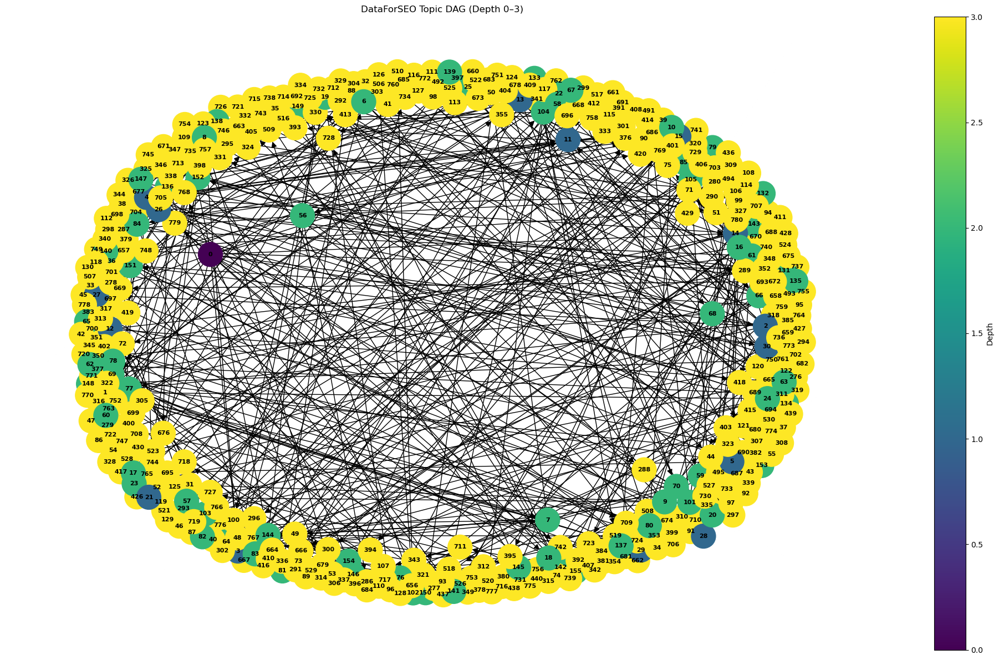

Visualized 431 nodes out of 3906 total


In [111]:
# Visualize only nodes up to depth 2 for readability
MAX_DEPTH = 3
subgraph_nodes = [n for n in G.nodes() if G.nodes[n]['depth'] <= MAX_DEPTH]
subG = G.subgraph(subgraph_nodes)

fig, ax = plt.subplots(figsize=(20, 12))

pos = nx.spring_layout(subG, k=2, iterations=50)

# Color nodes by depth
node_colors = [G.nodes[n]['depth'] for n in subG.nodes()]

nx.draw(
    subG,
    pos,
    ax=ax,
    node_color=node_colors,
    cmap=plt.cm.viridis,
    with_labels=True,
    labels={n: n for n in subG.nodes()},
    node_size=1000,
    font_size=8,
    font_weight='bold',
    arrows=True,
    arrowsize=15
)

ax.set_title(f"DataForSEO Topic DAG (Depth 0–{MAX_DEPTH})")

# Compute colorbar
norm = mpl.colors.Normalize(
    vmin=min(node_colors),
    vmax=max(node_colors)
)
sm = mpl.cm.ScalarMappable(cmap=plt.cm.viridis, norm=norm)
sm.set_array([])

fig.colorbar(sm, ax=ax, label='Depth')

plt.tight_layout()
plt.show()

print(f"Visualized {len(subgraph_nodes)} nodes out of {G.number_of_nodes()} total")


## Interactive Visualization with PyVis

In [112]:
from pyvis.network import Network

# Create interactive visualization for limited depth
MAX_DEPTH_INTERACTIVE = 6
subgraph_nodes = [n for n in G.nodes() if G.nodes[n]['depth'] <= MAX_DEPTH_INTERACTIVE]
subG = G.subgraph(subgraph_nodes)

net = Network(height="800px", width="100%", notebook=True, directed=True)
net.barnes_hut()  # Use Barnes-Hut physics for better layout

# Add nodes with hover tooltips
for node in subG.nodes():
    topic = G.nodes[node]['topic']
    depth = G.nodes[node]['depth']
    net.add_node(node, 
                 label=f"{node}",
                 title=f"Depth {depth}: {topic}",
                 level=depth)  # Use depth for hierarchical layout

# Add edges
for u, v in subG.edges():
    net.add_edge(u, v)

# Set hierarchical layout
net.set_options("""
{
  "layout": {
    "hierarchical": {
      "enabled": true,
      "direction": "UD",
      "sortMethod": "directed"
    }
  },
  "physics": {
    "hierarchicalRepulsion": {
      "centralGravity": 0.0
    }
  }
}
""")

net.show("dataforseo_dag_interactive.html")
print(f"Interactive visualization saved to dataforseo_dag_interactive.html")

dataforseo_dag_interactive.html
Interactive visualization saved to dataforseo_dag_interactive.html


# Analyse Quality

In [113]:

import json
import math
import random
from collections import defaultdict
from tqdm import tqdm

import numpy as np
import networkx as nx
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import KMeans
from sentence_transformers import SentenceTransformer
from pprint import pprint

In [114]:
EMBED_MODEL = "all-MiniLM-L6-v2"
K_NEIGHBORS = 50
SAMPLED_PAIRWISE = 5000
CLUSTER_K = None
SEED_ROOT_IDS = None  # or e.g. ['0']

# Thresholds (tune)
TAU_LNC = 0.50
TAU_NA = 0.40
TAU_GTD = 0.40
TAU_DUP = 0.92
TAU_NOVELTY = 0.20

# Severity weights (for ranking flagged nodes)
SEV_WEIGHTS = {"lnc": 0.35, "gtd": 0.35, "dup": 0.2, "novelty": 0.1}

In [115]:
# Utilities (normalization, cosine)
def normalize_to_01(arr, eps=1e-12):
    a = np.array(arr, dtype=float)
    lo = np.nanmin(a)
    hi = np.nanmax(a)
    if math.isclose(hi, lo):
        return np.clip((a - lo), 0.0, 1.0)
    return (a - lo) / (hi - lo + eps)

def cosine_sim_matrix_rowwise(A, B=None):
    if B is None:
        B = A
    A_n = A / (np.linalg.norm(A, axis=1, keepdims=True) + 1e-12)
    B_n = B / (np.linalg.norm(B, axis=1, keepdims=True) + 1e-12)
    return A_n.dot(B_n.T)


In [116]:
# Load graph JSON & build networkx DiGraph (returns G, raw_json)
def load_graph_from_json(path):
    with open(path, 'r', encoding='utf-8') as fh:
        data = json.load(fh)
    nodes = data['nodes']
    G = nx.DiGraph()
    for node_id, nd in nodes.items():
        key = str(node_id)
        G.add_node(key,
                   topic=nd.get('topic', '').strip(),
                   metadata=nd.get('metadata', {}),
                   parents=[str(p) for p in nd.get('parents', [])],
                   children=[str(c) for c in nd.get('children', [])])
    # edges
    for n in list(G.nodes):
        for c in G.nodes[n]['children']:
            if c in G.nodes:
                G.add_edge(n, c)
    # compute depth
    roots = [n for n in G.nodes if G.in_degree(n) == 0]
    if not roots:
        roots = ["0"] if "0" in G.nodes else [list(G.nodes)[0]]
    for root in roots:
        G.nodes[root]['depth'] = 0
        queue = [root]
        while queue:
            cur = queue.pop(0)
            cur_depth = G.nodes[cur].get('depth', 0)
            for child in G.successors(cur):
                if 'depth' not in G.nodes[child]:
                    G.nodes[child]['depth'] = cur_depth + 1
                    queue.append(child)
    return G, data

G, raw = load_graph_from_json(JSON)
print(G)

DiGraph with 3906 nodes and 3939 edges


In [117]:
# Compute embeddings (stores in node attribute 'embedding') and returns model
def compute_embeddings(G, model_name=EMBED_MODEL):
    node_list = list(G.nodes)
    texts = [G.nodes[n]['topic'] if G.nodes[n]['topic'] else G.nodes[n]['metadata'].get('title','') for n in node_list]
    for i, t in enumerate(texts):
        if t is None or t.strip() == '':
            texts[i] = G.nodes[node_list[i]]['metadata'].get('uuid', node_list[i])
    model = SentenceTransformer(model_name)
    embeddings = model.encode(texts, show_progress_bar=True, convert_to_numpy=True, normalize_embeddings=True)
    for i, n in enumerate(node_list):
        G.nodes[n]['embedding'] = embeddings[i]
    return G, model


G, model = compute_embeddings(G)

Batches:   0%|          | 0/123 [00:00<?, ?it/s]

In [118]:
# Build kNN neighbors (returns dict: node -> list of (neighbor_id, sim))
def build_knn_index(G, k=K_NEIGHBORS):
    node_list = list(G.nodes)
    X = np.vstack([G.nodes[n]['embedding'] for n in node_list])
    k_eff = min(k + 1, len(node_list))
    nn = NearestNeighbors(n_neighbors=k_eff, metric='cosine').fit(X)
    dists, idxs = nn.kneighbors(X)
    sims = 1.0 - dists
    neighbors = {}
    for i, n in enumerate(node_list):
        rows = idxs[i].tolist()
        sims_row = sims[i].tolist()
        pairs = [(node_list[r], sims_row[j]) for j, r in enumerate(rows) if r != i]
        neighbors[n] = pairs[:k]
    return neighbors

neighbors = build_knn_index(G)
neighbors['0'][:5]  # preview

[('3', 0.7524616718292236),
 ('435', 0.7194862365722656),
 ('2', 0.7176867723464966),
 ('1', 0.7113125324249268),
 ('5', 0.6929402351379395)]

In [130]:
len(G.nodes['9']['embedding'])
norms = [np.linalg.norm(G.nodes[n]['embedding']) for n in G.nodes]
print(min(norms), max(norms), np.mean(norms))

0.9999999 1.0000001 1.0


In [119]:
# Compute per-node metrics (returns dicts)
def compute_node_metrics(G, neighbors, seed_centroid=None):
    node_list = list(G.nodes)
    emb_map = {n: G.nodes[n]['embedding'] for n in node_list}
    lnc, na, gtd, max_sim, novelty = {}, {}, {}, {}, {}
    for n in node_list:
        neigh_pairs = neighbors.get(n, [])
        neigh_ids = [p[0] for p in neigh_pairs]
        neigh_sims = [p[1] for p in neigh_pairs]
        lnc[n] = float(np.mean(neigh_sims)) if neigh_sims else float('nan')
        if len(neigh_ids) < 2:
            na[n] = float('nan')
        else:
            M = np.vstack([emb_map[u] for u in neigh_ids])
            sims = cosine_sim_matrix_rowwise(M)
            k = sims.shape[0]
            triu = np.triu_indices(k, k=1)
            na[n] = float(np.mean(sims[triu])) if triu[0].size > 0 else float('nan')
        gtd[n] = float(np.dot(emb_map[n], seed_centroid)) if seed_centroid is not None else float('nan')
        max_sim[n] = max([s for (_, s) in neigh_pairs]) if neigh_pairs else 0.0

        parents = G.nodes[n].get('parents', [])
        siblings = []
        for p in parents:
            for c in G.nodes[p]['children']:
                if c != n:
                    siblings.append(c)
        comps = []
        if parents:
            comps += [np.dot(emb_map[n], emb_map[p]) for p in parents if p in emb_map]
        if siblings:
            comps += [np.dot(emb_map[n], emb_map[s]) for s in siblings if s in emb_map]
        novelty[n] = 1.0 - float(np.mean(comps)) if comps else 1.0

    return {"lnc": lnc, "na": na, "gtd": gtd, "max_sim": max_sim, "novelty": novelty}

node_metrics = compute_node_metrics(G, neighbors, seed_centroid=G.nodes['0']['embedding'])
pprint(list(node_metrics['lnc'].items())[:10]) # note: dict, sample accordingly

[('0', 0.5855013227462769),
 ('1', 0.6560751640796662),
 ('2', 0.6752999377250671),
 ('3', 0.6310909342765808),
 ('4', 0.6469830226898193),
 ('5', 0.7595690810680389),
 ('6', 0.6346909964084625),
 ('7', 0.6737621748447418),
 ('8', 0.5852253079414368),
 ('9', 0.4991492938995361)]


In [135]:
import numpy as np
from pprint import pprint

def safe_cosine_sim(a, b, eps=1e-12):
    a = np.asarray(a, dtype=float)
    b = np.asarray(b, dtype=float)
    na = np.linalg.norm(a)
    nb = np.linalg.norm(b)
    if na < eps or nb < eps:
        return 0.0
    return float(np.dot(a, b) / (na * nb))

# Compute per-node metrics (returns dicts) — robust version with flexible seed_centroid and better defaults
def compute_node_metrics(G, neighbors, seed_centroid=None):
    """
    G: networkx graph
    neighbors: mapping node -> list of (neighbor_id, similarity)
    seed_centroid: None, a node id present in G, or a raw vector (np.array/list). If a node id is given
                   and not found, we attempt to coerce common types (int <-> str). If still not found,
                   gtd will be set to NaN.
    """
    # Resolve seed_centroid: if it's a node id, fetch its embedding; if vector, use directly.
    resolved_seed = None
    if seed_centroid is None:
        resolved_seed = None
    else:
        # node id case
        if (isinstance(seed_centroid, (str, int)) and seed_centroid in G.nodes):
            resolved_seed = G.nodes[seed_centroid].get('embedding')
        elif isinstance(seed_centroid, (str, int)):
            # try alternate type (common case: '0' vs 0)
            try_alt = int(seed_centroid) if isinstance(seed_centroid, str) and seed_centroid.isdigit() else str(seed_centroid)
            if try_alt in G.nodes:
                resolved_seed = G.nodes[try_alt].get('embedding')
            else:
                resolved_seed = None
        else:
            # assume it's a vector-like object
            try:
                arr = np.asarray(seed_centroid, dtype=float)
                if arr.size > 0:
                    resolved_seed = arr
                else:
                    resolved_seed = None
            except Exception:
                resolved_seed = None

    node_list = list(G.nodes)
    emb_map = {}
    for n in node_list:
        emb = G.nodes[n].get('embedding')
        if emb is None:
            # guard: if missing embedding, set to zero-vector of same dim as seed if available, else None
            if resolved_seed is not None:
                emb_map[n] = np.zeros_like(resolved_seed)
            else:
                emb_map[n] = None
        else:
            emb_map[n] = np.asarray(emb, dtype=float)

    lnc, na, gtd, max_sim, novelty, ltd = {}, {}, {}, {}, {}, {}

    for n in node_list:
        neigh_pairs = neighbors.get(n, [])
        neigh_ids = [p[0] for p in neigh_pairs]
        neigh_sims = [p[1] for p in neigh_pairs]
        lnc[n] = float(np.mean(neigh_sims)) if neigh_sims else float('nan')

        # neighbor agreement (na)
        if len(neigh_ids) < 2:
            na[n] = float('nan')
        else:
            # build matrix of embeddings for neighbors, skipping any missing embeddings
            M_rows = [emb_map[u] for u in neigh_ids if (u in emb_map and emb_map[u] is not None)]
            if len(M_rows) < 2:
                na[n] = float('nan')
            else:
                M = np.vstack(M_rows)
                sims = cosine_sim_matrix_rowwise(M)   # assumes this exists in your environment
                k = sims.shape[0]
                triu = np.triu_indices(k, k=1)
                na[n] = float(np.mean(sims[triu])) if triu[0].size > 0 else float('nan')

        # GTD: dot product with seed centroid if resolved
        if resolved_seed is not None and emb_map[n] is not None:
            # If embeddings are *not* unit-normalised, you may want to use safe_cosine_sim instead.
            try:
                #gtd[n] = float(np.dot(emb_map[n], resolved_seed))
                gtd[n] = safe_cosine_sim(emb_map[n], resolved_seed)
            except Exception:
                gtd[n] = float('nan')
        else:
            gtd[n] = float('nan')

        max_sim[n] = max([s for (_, s) in neigh_pairs]) if neigh_pairs else 0.0

        # parents and siblings (safe defaults)
        parents = G.nodes[n].get('parents', []) or []
        siblings = []
        for p in parents:
            children_of_p = G.nodes[p].get('children', []) if p in G.nodes else []
            for c in children_of_p:
                if c != n:
                    siblings.append(c)

        comps = []
        if parents:
            comps += [np.dot(emb_map[n], emb_map[p]) for p in parents if p in emb_map and emb_map[p] is not None and emb_map[n] is not None]
        if siblings:
            comps += [np.dot(emb_map[n], emb_map[s]) for s in siblings if s in emb_map and emb_map[s] is not None and emb_map[n] is not None]
        novelty[n] = 1.0 - float(np.mean(comps)) if comps else 1.0

        # LTD: cosine distance to parent(s). If embeddings are available, use safe_cosine_sim
        if not parents:
            ltd[n] = float('nan')
        else:
            parent_sims = []
            for p in parents:
                if p in emb_map and emb_map[p] is not None and emb_map[n] is not None:
                    parent_sims.append(safe_cosine_sim(emb_map[n], emb_map[p]))
            if parent_sims:
                max_parent_sim = float(np.max(parent_sims))
                ltd[n] = max_parent_sim
            else:
                ltd[n] = float('nan')

    return {
        "lnc": lnc,
        "na": na,
        "gtd": gtd,
        "max_sim": max_sim,
        "novelty": novelty,
        "ltd": ltd
    }


node_metrics = compute_node_metrics(G, neighbors, seed_centroid='0')
pprint(list(node_metrics['lnc'].items())[:10])
pprint(list(node_metrics['ltd'].items())[:10])
pprint(list(node_metrics['gtd'].items())[:10])


[('0', 0.5855013227462769),
 ('1', 0.6560751640796662),
 ('2', 0.6752999377250671),
 ('3', 0.6310909342765808),
 ('4', 0.6469830226898193),
 ('5', 0.7595690810680389),
 ('6', 0.6346909964084625),
 ('7', 0.6737621748447418),
 ('8', 0.5852253079414368),
 ('9', 0.4991492938995361)]
[('0', nan),
 ('1', 0.7113123184502409),
 ('2', 0.717686852681297),
 ('3', 0.7524614765527844),
 ('4', 0.6209181657744494),
 ('5', 0.6929401903069856),
 ('6', 0.681056751064115),
 ('7', 0.5802371578666097),
 ('8', 0.5428632713394775),
 ('9', 0.5835254045292054)]
[('0', 1.0000000000000002),
 ('1', 0.7113123184502409),
 ('2', 0.717686852681297),
 ('3', 0.7524614765527844),
 ('4', 0.6209181657744494),
 ('5', 0.6929401903069856),
 ('6', 0.5967944812091667),
 ('7', 0.4918302000826266),
 ('8', 0.4459968215239198),
 ('9', 0.4317311128575487)]


In [139]:
# Compute global metrics (coherence, diversity, etc.)
def compute_global_scores(G, node_metrics, neighbors, sample_pairs=SAMPLED_PAIRWISE, cluster_k=CLUSTER_K):
    node_list = list(G.nodes)
    N = len(node_list)
    emb_arr = np.vstack([G.nodes[n]['embedding'] for n in node_list])
    emb_arr = emb_arr.astype(np.float64, copy=False)

    lnc_vals = np.array([node_metrics['lnc'][n] for n in node_list], dtype=float)
    na_vals  = np.array([node_metrics['na'][n]  for n in node_list], dtype=float)
    gtd_vals = np.array([node_metrics['gtd'][n] for n in node_list], dtype=float)
    ltd_vals = np.array([node_metrics.get('ltd', {}).get(n, np.nan) for n in node_list], dtype=float)

    # normalize each metric to 0..1 (preserves per-node shape)
    lnc_norm = normalize_to_01(np.nan_to_num(lnc_vals, nan=np.nan))
    na_norm  = normalize_to_01(np.nan_to_num(na_vals,  nan=np.nan))
    gtd_norm = normalize_to_01(np.nan_to_num(gtd_vals, nan=np.nan))
    ltd_norm = normalize_to_01(np.nan_to_num(ltd_vals, nan=np.nan))

    # compute per-metric means (robust to NaNs) and then average those means for coherence
    mean_lnc = float(np.nanmean(lnc_norm)) if lnc_norm.size else float('nan')
    mean_na  = float(np.nanmean(na_norm))  if na_norm.size  else float('nan')
    mean_gtd = float(np.nanmean(gtd_norm)) if gtd_norm.size else float('nan')
    mean_ltd = float(np.nanmean(ltd_norm)) if ltd_norm.size else float('nan')

    coherence_global = float(np.nanmean([mean_lnc, mean_na, mean_gtd, mean_ltd]))

    # pairwise similarity / diversity
    total_pairs = N*(N-1)//2
    pair_sims = []
    if total_pairs <= sample_pairs:
        sims = cosine_sim_matrix_rowwise(emb_arr)
        iu = np.triu_indices(N, 1)
        pair_sims = sims[iu].tolist()
    else:
        for _ in range(sample_pairs):
            i, j = random.randrange(N), random.randrange(N)
            while i == j:
                j = random.randrange(N)
            pair_sims.append(float(np.dot(emb_arr[i], emb_arr[j])))
    mean_pair_sim = float(np.mean(pair_sims))
    diversity_from_pair = 1.0 - mean_pair_sim

    # clustering entropy (norm_entropy)
    if cluster_k is None:
        K = min(max(5, max(1, N // 50)), 50)
    else:
        K = cluster_k
    if N <= K:
        norm_entropy = 1.0
    else:
        kmeans = KMeans(n_clusters=K, random_state=0).fit(emb_arr)
        labels = kmeans.labels_
        counts = np.bincount(labels, minlength=K).astype(float)
        probs = counts / counts.sum()
        entropy = -np.sum([p * math.log(p + 1e-12) for p in probs if p > 0])
        max_entropy = math.log(K)
        norm_entropy = entropy / (max_entropy + 1e-12)

    mean_novelty = float(np.mean([node_metrics['novelty'][n] for n in node_list]))
    redundancy_rate = float(np.mean([1.0 if node_metrics['max_sim'][n] > TAU_DUP else 0.0 for n in node_list]))

    diversity_global = float((0.4 * diversity_from_pair) + (0.4 * norm_entropy) + (0.2 * mean_novelty))
    diversity_global = diversity_global * (1.0 - redundancy_rate)

    # slope of LNC vs degree
    degs = np.array([G.out_degree(n) + G.in_degree(n) for n in node_list])
    lnc_for_slope = np.nan_to_num(lnc_vals, nan=np.nanmean(lnc_vals))
    log_deg = np.log1p(degs)
    try:
        coeffs = np.polyfit(log_deg, lnc_for_slope, 1)
        slope = float(coeffs[0])
    except Exception:
        slope = 0.0

    # depth decay — use GTD as before (you can add LTD depth-tracking if desired)
    depth_map = defaultdict(list)
    for n in node_list:
        depth_map[int(G.nodes[n].get('depth', 0))].append(node_metrics['gtd'][n])
    depth_levels = sorted(depth_map.keys())
    depth_means = []
    for d in depth_levels:
        vs = [v for v in depth_map[d] if v is not None and not math.isnan(v)]
        depth_means.append(float(np.mean(vs)) if vs else float('nan'))
    clean = [(d, m) for d, m in zip(depth_levels, depth_means) if not math.isnan(m)]
    if len(clean) >= 2:
        xs = np.array([d for d, _ in clean])
        ys = np.array([m for _, m in clean])
        coeffs = np.polyfit(xs, ys, 1)
        depth_decay = -float(coeffs[0])
    else:
        depth_decay = 0.0

    return {
        "coherence_global": coherence_global,
        "diversity_global": diversity_global,
        "mean_pairwise_sim": mean_pair_sim,
        "norm_cluster_entropy": norm_entropy,
        "mean_novelty": mean_novelty,
        "redundancy_rate": redundancy_rate,
        "cvc_slope": slope,
        "depth_decay": depth_decay,
        "mean_ltd": mean_ltd  # returned for transparency / debugging
    }

global_scores = compute_global_scores(G, node_metrics, neighbors = neighbors) 
pprint(global_scores)

{'coherence_global': 0.4885162826467081,
 'cvc_slope': 0.04479495318181777,
 'depth_decay': 0.13321875753259216,
 'diversity_global': 0.7089520175463877,
 'mean_ltd': 0.6137147355357225,
 'mean_novelty': 0.5111882629459011,
 'mean_pairwise_sim': 0.16000123682915768,
 'norm_cluster_entropy': 0.9623489755525435,
 'redundancy_rate': 0.13876088069636458}


In [138]:
TAU_LTD = 0.4          # example — tune based on histogram
SEV_WEIGHTS['ltd'] = 0.25

# Flag nodes (returns list of flagged dicts, sorted by severity)
def flag_nodes(G, node_metrics):
    nodes = list(G.nodes)

    lnc_arr = np.array([node_metrics['lnc'][n] if not math.isnan(node_metrics['lnc'][n]) else np.nan for n in nodes])
    gtd_arr = np.array([node_metrics['gtd'][n] if not math.isnan(node_metrics['gtd'][n]) else np.nan for n in nodes])
    ltd_arr = np.array([node_metrics['ltd'][n] if not math.isnan(node_metrics['ltd'][n]) else np.nan for n in nodes])
    novelty_arr = np.array([node_metrics['novelty'][n] for n in nodes])
    dup_arr = np.array([node_metrics['max_sim'][n] for n in nodes])

    lnc_norm = normalize_to_01(np.nan_to_num(lnc_arr, nan=np.nanmean(lnc_arr)))
    gtd_norm = normalize_to_01(np.nan_to_num(gtd_arr, nan=np.nanmean(gtd_arr)))
    ltd_norm = normalize_to_01(np.nan_to_num(ltd_arr, nan=np.nanmean(ltd_arr)))
    novelty_norm = normalize_to_01(novelty_arr)
    dup_norm = dup_arr  # already 0–1 similarity

    flagged = []

    for i, n in enumerate(nodes):
        reasons = []

        scores = {
            "lnc": float(lnc_norm[i]),
            "gtd": float(gtd_norm[i]),
            "ltd": float(ltd_norm[i]),
            "novelty": float(novelty_norm[i]),
            "dup_sim": float(dup_norm[i])
        }

        # --- rule-based flags ---
        if (node_metrics['lnc'][n] is not None) and (not math.isnan(node_metrics['lnc'][n])) and node_metrics['lnc'][n] < TAU_LNC:
            reasons.append("LOW_LNC")

        if (node_metrics['na'][n] is not None) and (not math.isnan(node_metrics['na'][n])) and node_metrics['na'][n] < TAU_NA:
            reasons.append("LOW_NEIGH_AGREEMENT")

        if (node_metrics['gtd'][n] is not None) and (not math.isnan(node_metrics['gtd'][n])) and node_metrics['gtd'][n] < TAU_GTD:
            reasons.append("OFF_TOPIC_GLOBAL")

        # LTD: high LTD = high drift from parent
        if (node_metrics['ltd'][n] is not None) and (not math.isnan(node_metrics['ltd'][n])) and node_metrics['ltd'][n] > TAU_LTD:
            reasons.append("OFF_TOPIC_LOCAL")

        if node_metrics['max_sim'][n] > TAU_DUP:
            reasons.append("DUPLICATE")

        if node_metrics['novelty'][n] < TAU_NOVELTY:
            reasons.append("LOW_NOVELTY")

        # --- severity score ---
        if reasons:
            severity = (
                SEV_WEIGHTS['lnc'] * (1.0 - scores['lnc']) +
                SEV_WEIGHTS['gtd'] * (1.0 - scores['gtd']) +   # low global similarity = bad
                SEV_WEIGHTS['ltd'] * (scores['ltd']) +         # high local drift = bad
                SEV_WEIGHTS['dup'] * (scores['dup_sim']) +
                SEV_WEIGHTS['novelty'] * (1.0 - scores['novelty'])
            )

            flagged.append({
                "node_id": n,
                "uuid": G.nodes[n]['metadata'].get('uuid'),
                "label": G.nodes[n].get('topic'),
                "reasons": reasons,
                "scores": scores,
                "severity": float(severity)
            })

    flagged_sorted = sorted(flagged, key=lambda x: x['severity'], reverse=True)
    return flagged_sorted


flagged = flag_nodes(G, node_metrics)
flagged[:10]


[{'node_id': '1486',
  'uuid': '81029a1d-55e9-4823-b13d-e4d9c1e595a3',
  'label': 'Definition of Statelessness',
  'reasons': ['LOW_LNC',
   'LOW_NEIGH_AGREEMENT',
   'OFF_TOPIC_GLOBAL',
   'OFF_TOPIC_LOCAL'],
  'scores': {'lnc': 0.14577673444753195,
   'gtd': 0.08186622830217623,
   'ltd': 0.9307214786182781,
   'novelty': 0.2974293262804642,
   'dup_sim': 0.9030135273933411},
  'severity': 1.1038651055427935},
 {'node_id': '1741',
  'uuid': '74396c0b-696b-4669-aceb-63df384750e2',
  'label': 'Syntax of Ternary Operator',
  'reasons': ['LOW_LNC',
   'LOW_NEIGH_AGREEMENT',
   'OFF_TOPIC_GLOBAL',
   'OFF_TOPIC_LOCAL',
   'DUPLICATE'],
  'scores': {'lnc': 0.27116213215732216,
   'gtd': 0.05538596642160397,
   'ltd': 0.9565911926800618,
   'novelty': 0.4759441236603312,
   'dup_sim': 0.9286946058273315},
  'severity': 1.0630004724668243},
 {'node_id': '1731',
  'uuid': '26f1a6e9-bfbb-4093-a424-99013233df7a',
  'label': 'Basic Syntax of If-Else',
  'reasons': ['LOW_LNC',
   'LOW_NEIGH_AGREE

In [140]:
import math
import json

def _safe_number(x):
    """Convert numeric-like values to JSON-friendly floats or None for NaN/None."""
    if x is None:
        return None
    try:
        # handle numpy types
        xv = float(x)
    except Exception:
        return None
    if math.isnan(xv):
        return None
    return xv

# Cell 10: Create full report JSON (useful for storing or UI)
def create_report(G, node_metrics, global_scores, flagged):
    node_metrics_serializable = {}
    for n in G.nodes:
        meta = G.nodes[n].get('metadata') or {}
        node_dict = {
            "lnc": _safe_number(node_metrics['lnc'].get(n)),
            "na":  _safe_number(node_metrics['na'].get(n)),
            "gtd": _safe_number(node_metrics['gtd'].get(n)),
            "ltd": _safe_number(node_metrics.get('ltd', {}).get(n)),
            "max_sim": _safe_number(node_metrics['max_sim'].get(n)),
            "novelty": _safe_number(node_metrics['novelty'].get(n)),
            "depth": G.nodes[n].get('depth', None),
            "uuid": meta.get('uuid')
        }
        node_metrics_serializable[n] = node_dict

    report = {
        "summary": {
            "nodes": int(G.number_of_nodes()),
            "edges": int(G.number_of_edges()),
            **global_scores
        },
        "flagged_nodes": flagged,
        "node_metrics": node_metrics_serializable
    }
    return report

# Usage (same as you had):
report = create_report(G, node_metrics, global_scores, flagged)
with open("report.json","w") as f:
    json.dump(report, f, indent=2)



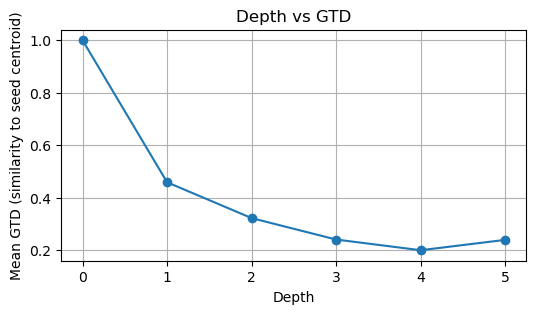

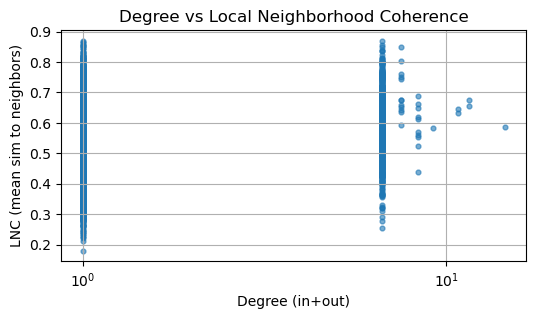

In [27]:
# Small visualizations - mean GTD by depth & LNC vs degree
import matplotlib.pyplot as plt

def plot_depth_gtd(G, node_metrics):
    depth_map = defaultdict(list)
    for n in G.nodes:
        depth_map[int(G.nodes[n].get('depth',0))].append(node_metrics['gtd'][n])
    depths = sorted(depth_map.keys())
    means = [np.nanmean([v for v in depth_map[d] if not math.isnan(v)]) for d in depths]
    plt.figure(figsize=(6,3))
    plt.plot(depths, means, marker='o')
    plt.xlabel("Depth")
    plt.ylabel("Mean GTD (similarity to seed centroid)")
    plt.title("Depth vs GTD")
    plt.grid(True)
    plt.show()

def plot_lnc_vs_degree(G, node_metrics):
    nodes = list(G.nodes)
    degs = np.array([G.out_degree(n) + G.in_degree(n) for n in nodes])
    lnc_vals = np.array([node_metrics['lnc'][n] if not math.isnan(node_metrics['lnc'][n]) else np.nanmean(list(node_metrics['lnc'].values())) for n in nodes])
    plt.figure(figsize=(6,3))
    plt.scatter(degs, lnc_vals, alpha=0.6, s=12)
    plt.xscale('symlog')
    plt.xlabel("Degree (in+out)")
    plt.ylabel("LNC (mean sim to neighbors)")
    plt.title("Degree vs Local Neighborhood Coherence")
    plt.grid(True)
    plt.show()

# Usage:
plot_depth_gtd(G, node_metrics)
plot_lnc_vs_degree(G, node_metrics)


In [28]:
# # Cell 12: Example end-to-end run (execute cell-by-cell instead for exploration)
# # Adjust the file path as needed:
# #INPUT_JSON = "dataforseo-topic-graph.jsonl"
# G, raw = load_graph_from_json(JSON)
# G, model = compute_embeddings(G)
# # compute seed centroid from roots
# seed_nodes = [n for n in G.nodes if G.in_degree(n) == 0] if SEED_ROOT_IDS is None else [str(s) for s in SEED_ROOT_IDS if str(s) in G.nodes]
# seed_nodes = seed_nodes or ["0"]
# seed_centroid = np.mean([G.nodes[n]['embedding'] for n in seed_nodes], axis=0)
# seed_centroid = seed_centroid / (np.linalg.norm(seed_centroid) + 1e-12)

# neighbors = build_knn_index(G, k=K_NEIGHBORS)
# node_metrics = compute_node_metrics(G, neighbors, seed_centroid=seed_centroid)
# global_scores = compute_global_scores(G, node_metrics, neighbors)
# flagged = flag_nodes(G, node_metrics)
# report = create_report(G, node_metrics, global_scores, flagged)

# print("Summary:")
# pprint(report['summary'])
# print("Top flagged nodes:")
# pprint(report['flagged_nodes'][:10])
# # optionally save
# with open("topic_graph_report.json", "w", encoding="utf-8") as fh:
#     json.dump(report, fh, indent=2)


# visualisation

In [141]:
# Cell: Build a DataFrame for easy plotting & sorting
import pandas as pd
import numpy as np

node_list = list(G.nodes)

df = pd.DataFrame({
    "node_id": node_list,
    "uuid": [G.nodes[n]['metadata'].get('uuid') for n in node_list],
    "topic": [G.nodes[n].get('topic','') for n in node_list],
    "depth": [G.nodes[n].get('depth', None) for n in node_list],
    "degree": [G.in_degree(n) + G.out_degree(n) for n in node_list],
    "lnc": [node_metrics['lnc'][n] for n in node_list],
    "na": [node_metrics['na'][n] for n in node_list],
    "gtd": [node_metrics['gtd'][n] for n in node_list],
    "ltd": [node_metrics.get('ltd', {}).get(n, np.nan) for n in node_list],
    "max_sim": [node_metrics['max_sim'][n] for n in node_list],
    "novelty": [node_metrics['novelty'][n] for n in node_list]
})

# Some columns may contain NaNs: keep as-is.
df.head(8)


,node_id,uuid,topic,depth,degree,lnc,na,gtd,ltd,max_sim,novelty
0,0,e3408c83-dcc5-46f5-9c79-164823ca5c6a,Generate diverse SEO tasks using 10 core tools...,0,16,0.585501,0.568484,1.000000,NaN,0.752462,1.000000
1,1,d24000a1-1fac-46fa-9c97-dd4db0c3af8e,Identifying and Categorizing the 10 Core SEO T...,1,12,0.656075,0.568772,0.711312,0.711312,0.832474,0.599249
2,2,1b020fba-8c60-4dbc-96f8-cf95682e24e1,Strategies for Diverse SEO Task Generation,1,12,0.675300,0.620185,0.717687,0.717687,0.880517,0.521880
3,3,27d1b940-511b-44d4-a7cf-3d323a0c8d10,Architecting a Single Tool for Multi-Tool SEO ...,1,11,0.631091,0.574692,0.752461,0.752461,0.773638,0.599210
4,4,13dbc0fd-7d85-4e36-9235-61d9fccf245b,Automated Workflow Design for SEO Task Generation,1,11,0.646983,0.576774,0.620918,0.620918,0.804454,0.509929
5,5,625376db-3dbd-4f2f-a6fc-7f11f274dfa3,Metrics for Evaluating Diversity and Effective...,1,7,0.759569,0.648465,0.692940,0.692940,0.934295,0.542066
6,6,5dc95553-72c6-4eac-aa4f-bde5acf47ede,API Integration Strategies for Core SEO Tools,2,7,0.634691,0.490476,0.596794,0.681057,0.800408,0.494409
7,7,a769c678-2fcf-46ad-9bdd-4ce882051ec3,Unified Data Model Design for Consolidated SEO...,2,7,0.673762,0.605501,0.491830,0.580237,0.764212,0.603838


In [30]:
# compute ancestor_at_absolute_depth columns
# Semantic: ancestor_at_level_D stores the node id of the ancestor that sits at depth (D).

from collections import deque

# find max depth in graph
max_depth = int(df['depth'].max()) if not df['depth'].isna().all() else 0
max_level = max_depth  # we'll compute levels 1..max_level

def ancestor_at_absolute_depth(node_id, target_depth):
    """
    Return the ancestor of node_id whose depth == target_depth, walking parents up.
    target_depth is absolute depth (0-based). Returns None if not found.
    """
    cur = str(node_id)
    cur_depth = G.nodes[cur].get('depth', None)
    if cur_depth is None:
        return None
    if cur_depth < target_depth:
        return None  # node is shallower than target depth
    # walk up until we find node at target_depth
    # guard: prevent infinite loops using visited set
    visited = set()
    while True:
        if cur in visited:
            return None
        visited.add(cur)
        d = G.nodes[cur].get('depth', None)
        if d == target_depth:
            return cur
        # step up: choose first parent if multiple (consistent with graph creation)
        parents = G.nodes[cur].get('parents', []) or []
        if not parents:
            return None
        cur = str(parents[0])
        # loop continues until depth matches or runs out

# compute columns for levels 0..max_level
for D in range(0, max_level + 1):
    col_node = f"parent_node_at_level_{D}"
    #col_uuid = f"ancestor_uuid_level_{D}"
    vals_node = []
    vals_uuid = []
    target_depth = D 
    for nid in df['node_id']:
        anc = ancestor_at_absolute_depth(nid, target_depth)
        vals_node.append(anc)
        vals_uuid.append(G.nodes[anc]['metadata'].get('uuid') if anc is not None else None)
    df[col_node] = vals_node
    #df[col_uuid] = vals_uuid

# quick check: show a few rows
df.head(12)



,node_id,uuid,topic,depth,degree,lnc,na,gtd,max_sim,novelty,parent_node_at_level_0,parent_node_at_level_1,parent_node_at_level_2,parent_node_at_level_3,parent_node_at_level_4,parent_node_at_level_5
0,0,e3408c83-dcc5-46f5-9c79-164823ca5c6a,Generate diverse SEO tasks using 10 core tools...,0,16,0.585501,0.568484,1.000000,0.752462,1.000000,0,None,None,None,None,None
1,1,d24000a1-1fac-46fa-9c97-dd4db0c3af8e,Identifying and Categorizing the 10 Core SEO T...,1,12,0.656075,0.568772,0.711312,0.832474,0.599249,0,1,None,None,None,None
2,2,1b020fba-8c60-4dbc-96f8-cf95682e24e1,Strategies for Diverse SEO Task Generation,1,12,0.675300,0.620185,0.717687,0.880517,0.521880,0,2,None,None,None,None
3,3,27d1b940-511b-44d4-a7cf-3d323a0c8d10,Architecting a Single Tool for Multi-Tool SEO ...,1,11,0.631091,0.574692,0.752462,0.773638,0.599211,0,3,None,None,None,None
4,4,13dbc0fd-7d85-4e36-9235-61d9fccf245b,Automated Workflow Design for SEO Task Generation,1,11,0.646983,0.576774,0.620918,0.804454,0.509929,0,4,None,None,None,None
5,5,625376db-3dbd-4f2f-a6fc-7f11f274dfa3,Metrics for Evaluating Diversity and Effective...,1,7,0.759569,0.648465,0.692940,0.934295,0.542066,0,5,None,None,None,None
6,6,5dc95553-72c6-4eac-aa4f-bde5acf47ede,API Integration Strategies for Core SEO Tools,2,7,0.634691,0.490476,0.596794,0.800408,0.494409,0,3,6,None,None,None
7,7,a769c678-2fcf-46ad-9bdd-4ce882051ec3,Unified Data Model Design for Consolidated SEO...,2,7,0.673762,0.605501,0.491830,0.764212,0.603838,0,3,7,None,None,None
8,8,227005b3-ae3c-412e-8b06-c897096eab4f,User Interface (UI) / User Experience (UX) for...,2,6,0.585225,0.518297,0.445997,0.747375,0.569921,0,3,8,None,None,None
9,9,ab7cac7b-66de-427d-83c9-317b73a0a8d2,Error Handling and Robustness in Multi-Tool In...,2,6,0.499149,0.353330,0.431731,0.722226,0.656327,0,3,9,None,None,None


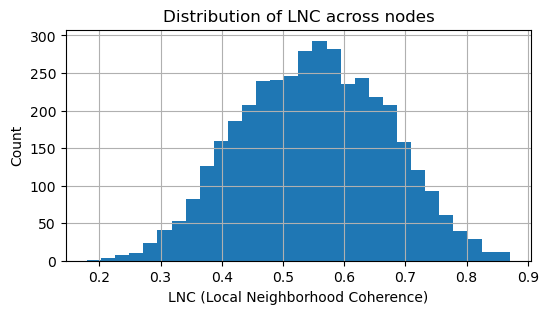

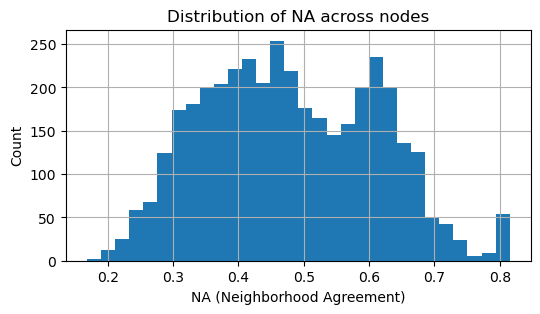

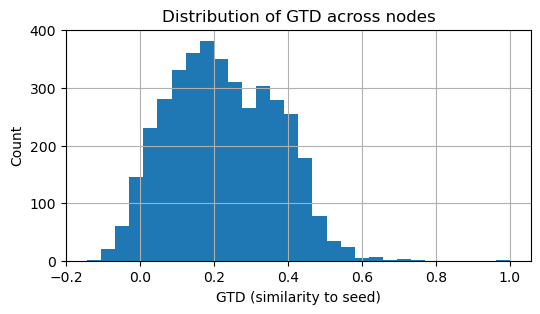

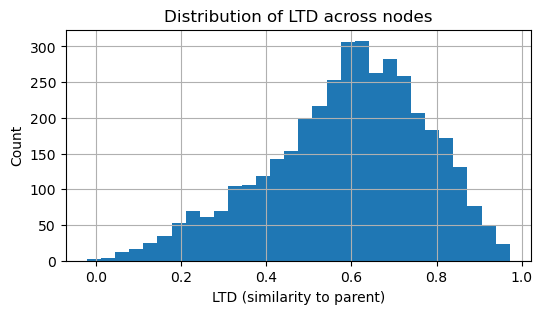

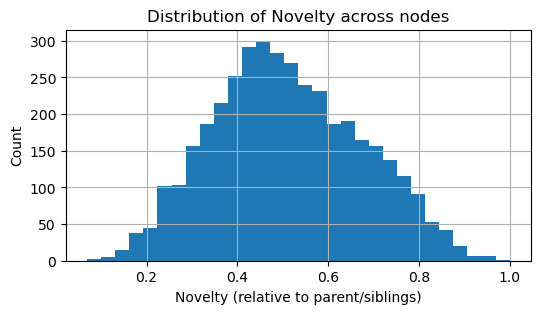

In [142]:
# Cell: Histogram of LNC
import matplotlib.pyplot as plt
plt.figure(figsize=(6,3))
plt.hist(df['lnc'].dropna().values, bins=30)
plt.xlabel("LNC (Local Neighborhood Coherence)")
plt.ylabel("Count")
plt.title("Distribution of LNC across nodes")
plt.grid(True)
plt.show()

# Cell: Histogram of NA (neighborhood agreement)
import matplotlib.pyplot as plt
plt.figure(figsize=(6,3))
plt.hist(df['na'].dropna().values, bins=30)
plt.xlabel("NA (Neighborhood Agreement)")
plt.ylabel("Count")
plt.title("Distribution of NA across nodes")
plt.grid(True)
plt.show()

# Cell: Histogram of GTD (similarity to seed centroid)
import matplotlib.pyplot as plt
plt.figure(figsize=(6,3))
plt.hist(df['gtd'].dropna().values, bins=30)
plt.xlabel("GTD (similarity to seed)")
plt.ylabel("Count")
plt.title("Distribution of GTD across nodes")
plt.grid(True)
plt.show()

# Cell: Histogram of LTD (local topic drift)
import matplotlib.pyplot as plt

plt.figure(figsize=(6,3))
plt.hist(df['ltd'].dropna().values, bins=30)
plt.xlabel("LTD (similarity to parent)")
plt.ylabel("Count")
plt.title("Distribution of LTD across nodes")
plt.grid(True)
plt.show()

# Cell: Histogram of Novelty
import matplotlib.pyplot as plt
plt.figure(figsize=(6,3))
plt.hist(df['novelty'].dropna().values, bins=30)
plt.xlabel("Novelty (relative to parent/siblings)")
plt.ylabel("Count")
plt.title("Distribution of Novelty across nodes")
plt.grid(True)
plt.show()

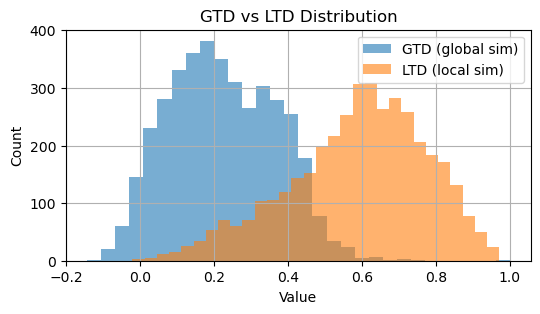

In [144]:
# Cell: Compare GTD and LTD distributions
plt.figure(figsize=(6,3))

plt.hist(df['gtd'].dropna().values, bins=30, alpha=0.6, label="GTD (global sim)")
plt.hist(df['ltd'].dropna().values, bins=30, alpha=0.6, label="LTD (local sim)")

plt.xlabel("Value")
plt.ylabel("Count")
plt.title("GTD vs LTD Distribution")
plt.legend()
plt.grid(True)
plt.show()


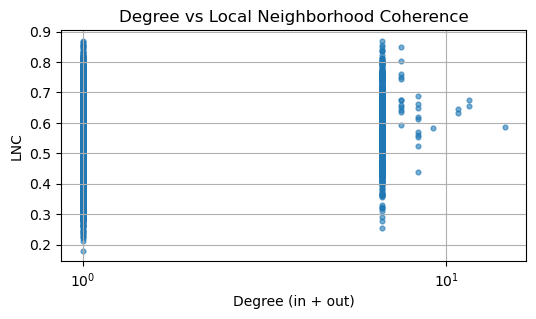

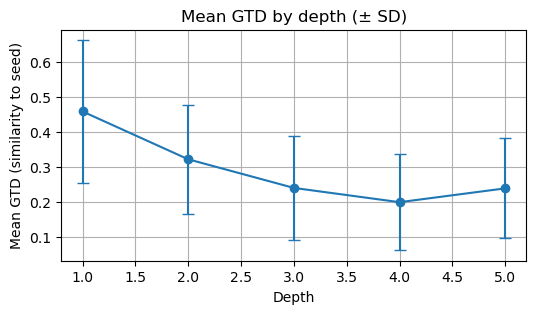

,depth,mean,std,count
1,1,0.458677,0.203371,16
2,2,0.322113,0.156080,69
3,3,0.240395,0.147303,345
4,4,0.199704,0.137130,1725
5,5,0.239196,0.142689,1750


In [52]:
# Cell: Scatter LNC vs Degree (navigability check)
import matplotlib.pyplot as plt
plt.figure(figsize=(6,3))
plt.scatter(df['degree'], df['lnc'], s=12, alpha=0.6)
plt.xscale('symlog')  # shows small & large degrees nicely
plt.xlabel("Degree (in + out)")
plt.ylabel("LNC")
plt.title("Degree vs Local Neighborhood Coherence")
plt.grid(True)
plt.show()

# Mean GTD by depth with SD error bars
import matplotlib.pyplot as plt

depth_groups = (
    df.groupby('depth')['gtd']
      .agg(['mean', 'std', 'count'])
      .reset_index()
      .dropna()
)

plt.figure(figsize=(6,3))
plt.errorbar(
    depth_groups['depth'],
    depth_groups['mean'],
    yerr=depth_groups['std'],
    marker='o',
    capsize=4
)

plt.xlabel("Depth")
plt.ylabel("Mean GTD (similarity to seed)")
plt.title("Mean GTD by depth (± SD)")
plt.grid(True)
plt.show()

# also display the table
depth_groups

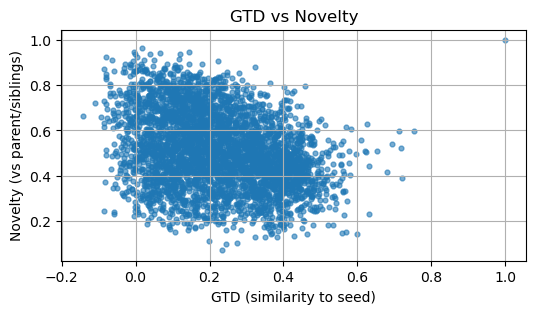

In [33]:
# Cell: GTD vs Novelty
import matplotlib.pyplot as plt
plt.figure(figsize=(6,3))
plt.scatter(df['gtd'], df['novelty'], s=12, alpha=0.6)
plt.xlabel("GTD (similarity to seed)")
plt.ylabel("Novelty (vs parent/siblings)")
plt.title("GTD vs Novelty")
plt.grid(True)
plt.show()

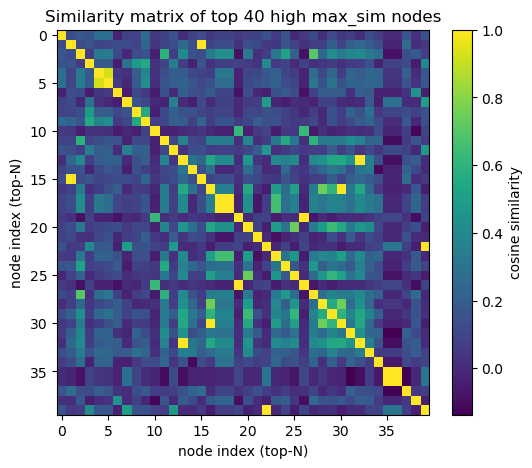

In [34]:
# Cell: Similarity heatmap for top-N potentially redundant nodes
import numpy as np
import matplotlib.pyplot as plt

TOP_N = 40
top_dup = df.sort_values('max_sim', ascending=False).head(TOP_N)
ids = top_dup['node_id'].tolist()
embs = np.vstack([G.nodes[n]['embedding'] for n in ids])
# cosine similarity matrix (embeddings should be normalized)
sim_mat = embs @ embs.T

plt.figure(figsize=(6,5))
plt.imshow(sim_mat, interpolation='nearest', aspect='auto')
plt.colorbar(label='cosine similarity')
plt.title(f"Similarity matrix of top {TOP_N} high max_sim nodes")
plt.xlabel("node index (top-N)")
plt.ylabel("node index (top-N)")
plt.show()


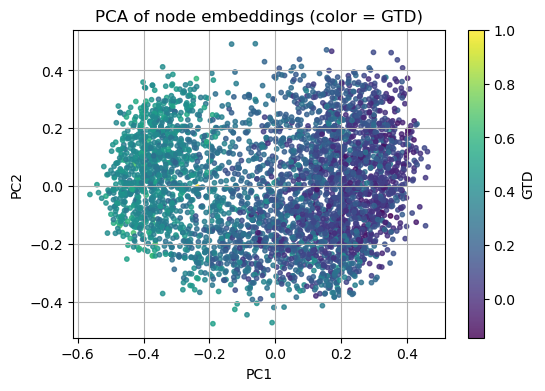

In [35]:
# Cell: PCA projection of embeddings, colored by GTD
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

node_list = list(G.nodes)
emb_arr = np.vstack([G.nodes[n]['embedding'] for n in node_list])

pca = PCA(n_components=2, random_state=0)
proj = pca.fit_transform(emb_arr)

plt.figure(figsize=(6,4))
plt.scatter(proj[:,0], proj[:,1], c=df['gtd'].fillna(df['gtd'].mean()).values, s=10, alpha=0.8)
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("PCA of node embeddings (color = GTD)")
plt.colorbar(label="GTD")
plt.grid(True)
plt.show()

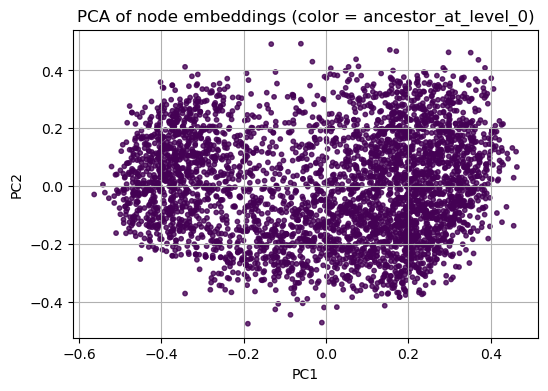

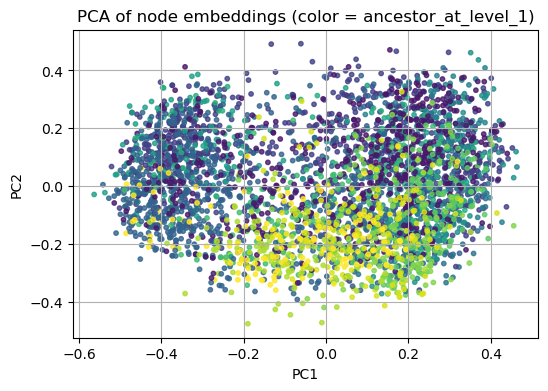

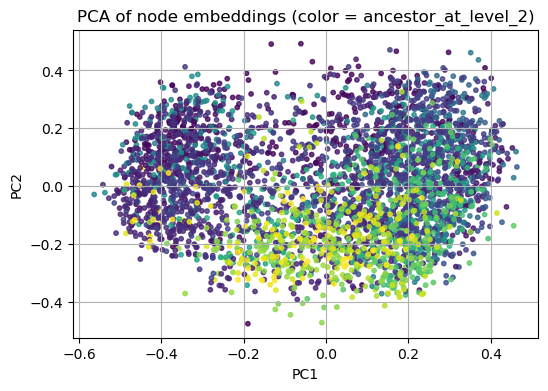

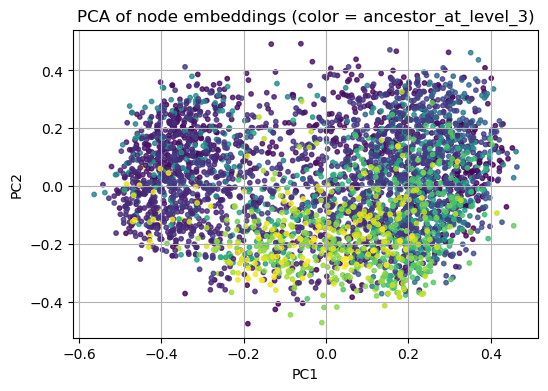

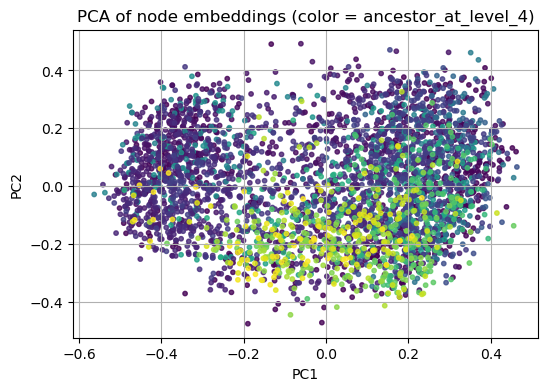

In [36]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np

# PCA once
pca = PCA(n_components=2, random_state=0)
proj = pca.fit_transform(emb_arr)

# how many levels to plot
max_level = int(df['depth'].max())

for D in range(0, max_level):
    col = f"parent_node_at_level_{D}"
    if col not in df.columns:
        continue

    plt.figure(figsize=(6,4))
    plt.scatter(
        proj[:,0],
        proj[:,1],
        c=pd.factorize(df[col].fillna("ROOT"))[0],
        s=10,
        alpha=0.8
    )
    plt.xlabel("PC1")
    plt.ylabel("PC2")
    plt.title(f"PCA of node embeddings (color = ancestor_at_level_{D})")
    plt.grid(True)
    plt.show()


In [50]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np

# PCA once
pca = PCA(n_components=2, random_state=0)
proj = pca.fit_transform(emb_arr)

max_level = min(int(df['depth'].max()),3)

for D in range(0, max_level):
    col = f"parent_node_at_level_{D}"
    if col not in df.columns:
        continue

    plt.figure(figsize=(6,4))

    # group by parent at this level
    for parent, idx in df.groupby(col).groups.items():
        label = str(parent) if parent is not None else "ROOT"
        plt.scatter(
            proj[idx, 0],
            proj[idx, 1],
            s=10,
            alpha=0.8,
            label=label
        )

    plt.xlabel("PC1")
    plt.ylabel("PC2")
    plt.title(f"PCA of node embeddings (color = ancestor_at_level_{D})")
    plt.legend(
        title="Parent node",
        bbox_to_anchor=(1.02, 1),
        loc="upper left",
        fontsize="small"
    )
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [51]:
# UMAP projection + loop plotting colored by ancestor_at_level_D (no KMeans)
import time
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# compute projection: try UMAP, fallback to PCA
try:
    import umap
    umap_model = umap.UMAP(n_components=2, n_neighbors=15, min_dist=0.1, metric="cosine", random_state=42)
    proj = umap_model.fit_transform(emb_arr)
    method = "umap"
except Exception as e:
    print("UMAP failed, falling back to PCA:", type(e).__name__, str(e)[:200])
    pca = PCA(n_components=2, random_state=0)
    proj = pca.fit_transform(emb_arr)
    method = "pca"

df['proj_x'] = proj[:,0]
df['proj_y'] = proj[:,1]

# loop over ancestor levels and plot
max_level = min(int(df['depth'].max()) if not df['depth'].isna().all() else 0,2)
print(max_level)
for D in range(0, max_level):
    col = f"parent_node_at_level_{D}"
    if col not in df.columns:
        continue

    plt.figure(figsize=(7,5))
    # plot group-by so legend shows mapping parent -> color
    grouped = df.groupby(col)
    for parent, group in grouped:
        label = str(parent) if parent is not None else "ROOT"
        plt.scatter(group['proj_x'], group['proj_y'], s=12, alpha=0.85, label=label)

    plt.title(f"{method.upper()} projection colored by ancestor_at_level_{D}")
    plt.xlabel("proj_x"); plt.ylabel("proj_y")
    plt.legend(title="Parent node", bbox_to_anchor=(1.02,1), loc="upper left", fontsize="small")
    plt.tight_layout()
    plt.show()

/Users/kexinxu/anaconda3/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


2


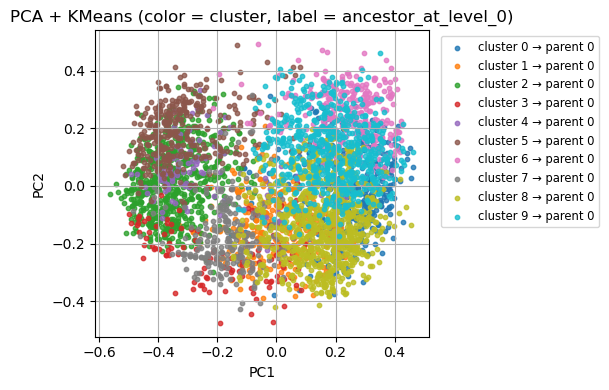

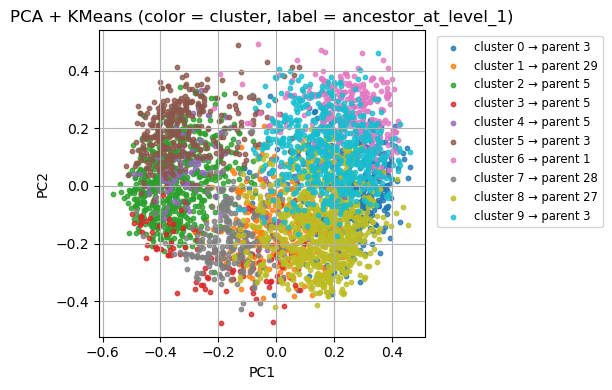

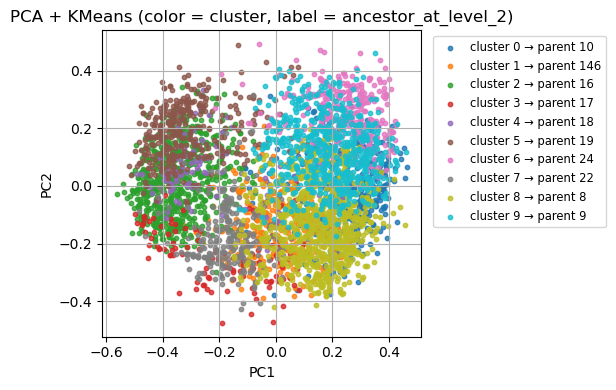

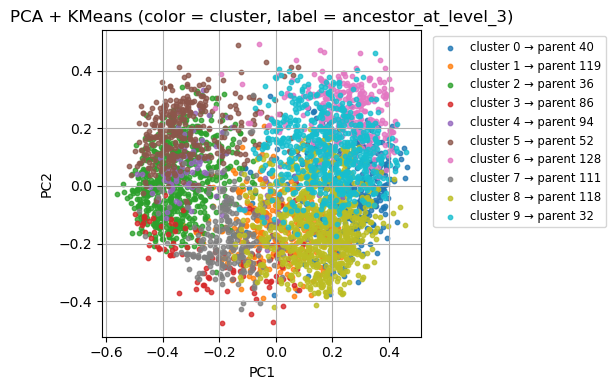

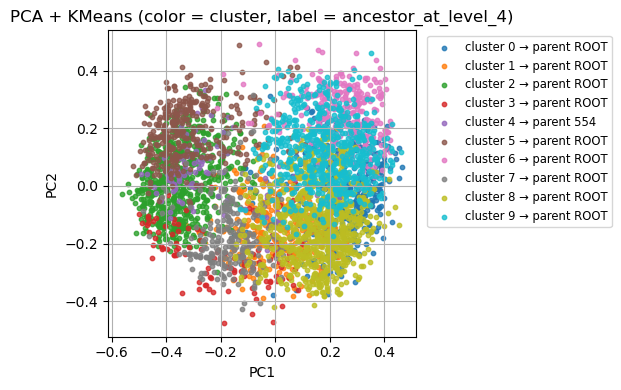

In [39]:
## K means
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import numpy as np

# PCA once
pca = PCA(n_components=2, random_state=0)
proj = pca.fit_transform(emb_arr)

max_level = int(df['depth'].max())
n_clusters = 10   # choose as you like

# KMeans once (on embeddings, not PCA)
kmeans = KMeans(n_clusters=n_clusters, random_state=0)
clusters = kmeans.fit_predict(emb_arr)
df['kmeans_cluster'] = clusters

for D in range(0, max_level):
    col = f"parent_node_at_level_{D}"
    if col not in df.columns:
        continue

    plt.figure(figsize=(6,4))

    for c in range(n_clusters):
        idx = df.index[df['kmeans_cluster'] == c]

        # find dominant parent at this level for the cluster
        parents = df.loc[idx, col].fillna("ROOT")
        dominant_parent = parents.value_counts().idxmax()

        plt.scatter(
            proj[idx, 0],
            proj[idx, 1],
            s=10,
            alpha=0.8,
            label=f"cluster {c} → parent {dominant_parent}"
        )

    plt.xlabel("PC1")
    plt.ylabel("PC2")
    plt.title(f"PCA + KMeans (color = cluster, label = ancestor_at_level_{D})")
    plt.legend(
        bbox_to_anchor=(1.02, 1),
        loc="upper left",
        fontsize="small"
    )
    plt.grid(True)
    plt.tight_layout()
    plt.show()


/Users/kexinxu/anaconda3/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP OK in 11.51s


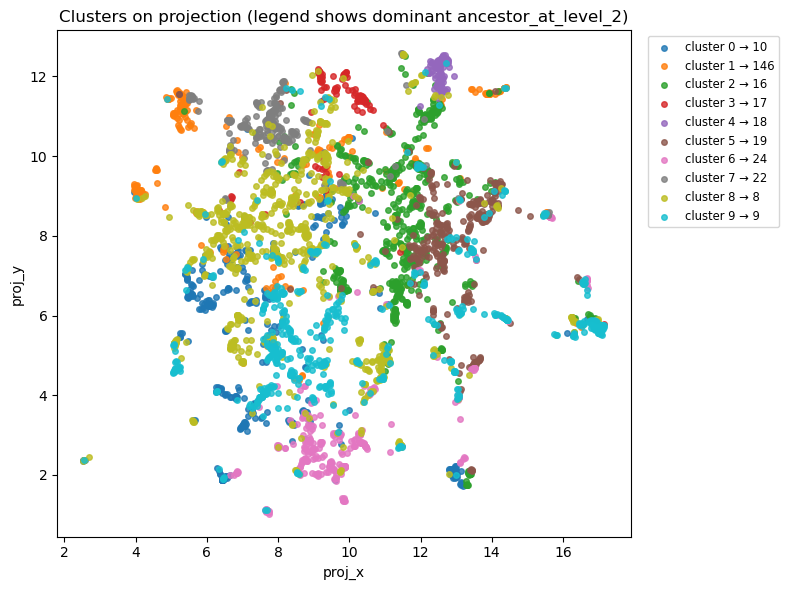

In [40]:
# UMAP projection + cluster visualization (with dominant-parent legend)
import time
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# CONFIG
D = 2                  # ancestor level to use in legend (change as needed)
n_clusters = 10        # will create kmeans if df lacks 'kmeans_cluster'
umap_params = {"n_components":2, "n_neighbors":15, "min_dist":0.1, "metric":"cosine", "random_state":42}

# ensure clusters exist
if 'kmeans_cluster' not in df.columns:
    km = KMeans(n_clusters=n_clusters, random_state=0).fit(emb_arr)
    df['kmeans_cluster'] = km.labels_

# compute projection (UMAP if available, otherwise PCA)
proj_ok = False
try:
    import umap
    start = time.time()
    umap_model = umap.UMAP(**umap_params)
    proj = umap_model.fit_transform(emb_arr)
    print("UMAP OK in {:.2f}s".format(time.time()-start))
    proj_ok = True
except Exception as e:
    print("UMAP failed (fallback to PCA):", type(e).__name__, str(e)[:200])
    pca = PCA(n_components=2, random_state=0)
    proj = pca.fit_transform(emb_arr)

df['proj_x'] = proj[:,0]
df['proj_y'] = proj[:,1]

# plotting clusters, legend shows dominant parent at level D
col = f"parent_node_at_level_{D}"
if col not in df.columns:
    print(f"Warning: {col} not in df — legend will show 'UNKNOWN' parents.")

plt.figure(figsize=(8,6))
for c in sorted(df['kmeans_cluster'].unique()):
    sel = df[df['kmeans_cluster'] == c]
    # dominant parent for this cluster
    if col in df.columns:
        dominant = str(sel[col].fillna("ROOT").value_counts().idxmax())
    else:
        dominant = "UNKNOWN"
    plt.scatter(sel['proj_x'], sel['proj_y'], s=16, alpha=0.8, label=f"cluster {c} → {dominant}")

plt.title(f"Clusters on projection (legend shows dominant ancestor_at_level_{D})")
plt.xlabel("proj_x"); plt.ylabel("proj_y")
plt.legend(bbox_to_anchor=(1.02,1), loc="upper left", fontsize="small")
plt.tight_layout()
plt.show()


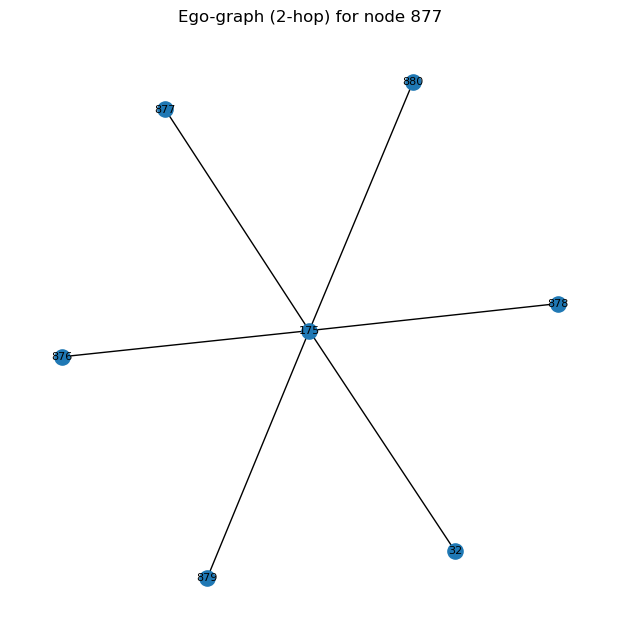

880 | depth: 5 | lnc: 0.38426589727401733 | gtd: 0.034233540296554565
879 | depth: 5 | lnc: 0.3633007335662842 | gtd: 0.19483521580696106
175 | depth: 4 | lnc: 0.413406765460968 | gtd: 0.12864018976688385
876 | depth: 5 | lnc: 0.37712509512901304 | gtd: 0.11034297198057175
32 | depth: 3 | lnc: 0.5803108239173889 | gtd: 0.1305605173110962
878 | depth: 5 | lnc: 0.3775749909877777 | gtd: 0.054726485162973404
877 | depth: 5 | lnc: 0.1798845660686493 | gtd: -0.007584879174828529


In [41]:
# Cell: Ego-graph inspector
import networkx as nx
import matplotlib.pyplot as plt

# pick a node to inspect: e.g., worst by LNC or pick manually
worst_lnc_node = df.sort_values('lnc', ascending=True).iloc[0]['node_id']
inspect_node = worst_lnc_node  # or set manually: inspect_node = '23'

H = nx.ego_graph(G.to_undirected(), inspect_node, radius=2)  # 2-hop ego graph
pos = nx.spring_layout(H, seed=1)  # layout

plt.figure(figsize=(6,6))
nx.draw(H, pos, with_labels=True, node_size=120, font_size=8)
plt.title(f"Ego-graph (2-hop) for node {inspect_node}")
plt.show()

# Print node info for each member
for n in H.nodes:
    print(n, "| depth:", G.nodes[n].get('depth'), "| lnc:", node_metrics['lnc'].get(n), "| gtd:", node_metrics['gtd'].get(n))


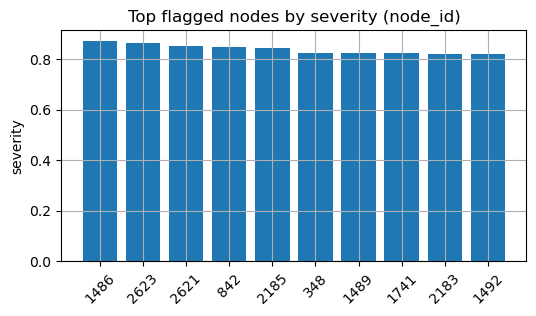

1486 81029a1d-55e9-4823-b13d-e4d9c1e595a3 ['LOW_LNC', 'LOW_NEIGH_AGREEMENT', 'OFF_TOPIC_DRIFT'] {'lnc': 0.14577673444753195, 'gtd': 0.08186620147323184, 'novelty': 0.29742936071697296, 'dup_sim': 0.9030135273933411}
2623 ed020395-e791-4c08-abfa-f5b59a58bc39 ['LOW_LNC', 'LOW_NEIGH_AGREEMENT', 'OFF_TOPIC_DRIFT'] {'lnc': 0.043631937888650524, 'gtd': 0.12179400296386836, 'novelty': 0.4310339087758697, 'dup_sim': 0.8281406164169312}
2621 e95ee528-4dc7-4788-88d0-db823e1b3b6f ['LOW_LNC', 'LOW_NEIGH_AGREEMENT', 'OFF_TOPIC_DRIFT'] {'lnc': 0.10351757171919804, 'gtd': 0.09750566733849667, 'novelty': 0.42171218033418534, 'dup_sim': 0.8281406164169312}
842 e3e9b4cb-ecbb-403d-b54d-ba837002747a ['LOW_LNC', 'LOW_NEIGH_AGREEMENT', 'OFF_TOPIC_DRIFT', 'DUPLICATE'] {'lnc': 0.20919105881787756, 'gtd': 0.10937567965897452, 'novelty': 0.4067237521482714, 'dup_sim': 1.0}
2185 8693d748-8ebc-4eb8-a841-2ef048352c31 ['LOW_LNC', 'LOW_NEIGH_AGREEMENT', 'OFF_TOPIC_DRIFT'] {'lnc': 0.16939488182278076, 'gtd': 0.092136

In [42]:
# Cell: Top flagged nodes bar chart
import matplotlib.pyplot as plt

# Ensure 'flagged' exists; otherwise compute
try:
    flagged_list = flagged  # from earlier
except NameError:
    flagged_list = flag_nodes(G, node_metrics)

topk = flagged_list[:10]
labels = [f"{f['node_id']}" for f in topk]
sevs = [f['severity'] for f in topk]

plt.figure(figsize=(6,3))
plt.bar(range(len(sevs)), sevs)
plt.xticks(range(len(sevs)), labels, rotation=45)
plt.ylabel("severity")
plt.title("Top flagged nodes by severity (node_id)")
plt.grid(True)
plt.show()

# print details
for f in topk:
    print(f["node_id"], f["uuid"], f["reasons"], f["scores"])


## UMAP of Embedding

In [43]:
# Cell 1: Prepare dataframe & embedding array (run first)
import numpy as np
import pandas as pd

node_list = list(G.nodes)
# ensure embeddings exist
missing = [n for n in node_list if 'embedding' not in G.nodes[n]]
if missing:
    raise RuntimeError(f"Missing embeddings for {len(missing)} nodes; run embedding step first. Examples: {missing[:5]}")

emb_arr = np.vstack([G.nodes[n]['embedding'] for n in node_list])
df = pd.DataFrame({
    "node_id": node_list,
    "uuid": [G.nodes[n]['metadata'].get('uuid') for n in node_list],
    "topic": [G.nodes[n].get('topic','') for n in node_list],
    "depth": [G.nodes[n].get('depth', None) for n in node_list],
    "degree": [G.in_degree(n) + G.out_degree(n) for n in node_list],
    "lnc": [node_metrics['lnc'].get(n, np.nan) for n in node_list],
    "na": [node_metrics['na'].get(n, np.nan) for n in node_list],
    "gtd": [node_metrics['gtd'].get(n, np.nan) for n in node_list],
    "max_sim": [node_metrics['max_sim'].get(n, np.nan) for n in node_list],
    "novelty": [node_metrics['novelty'].get(n, np.nan) for n in node_list],
    # parent: pick first parent if multiple, else 'root' if none
    "parent": [ (G.nodes[n].get('parents') or [None])[0] if G.nodes[n].get('parents') else None for n in node_list ]
})
# replace None parent values with 'ROOT' string for plotting
df['parent_cat'] = df['parent'].fillna('ROOT').astype(str)
print("Prepared df and embeddings:", emb_arr.shape, "nodes:", len(df))
df.head(5)


Prepared df and embeddings: (3906, 384) nodes: 3906


,node_id,uuid,topic,depth,degree,lnc,na,gtd,max_sim,novelty,parent,parent_cat
0,0,e3408c83-dcc5-46f5-9c79-164823ca5c6a,Generate diverse SEO tasks using 10 core tools...,0,16,0.585501,0.568484,1.000000,0.752462,1.000000,None,ROOT
1,1,d24000a1-1fac-46fa-9c97-dd4db0c3af8e,Identifying and Categorizing the 10 Core SEO T...,1,12,0.656075,0.568772,0.711312,0.832474,0.599249,0,0
2,2,1b020fba-8c60-4dbc-96f8-cf95682e24e1,Strategies for Diverse SEO Task Generation,1,12,0.675300,0.620185,0.717687,0.880517,0.521880,0,0
3,3,27d1b940-511b-44d4-a7cf-3d323a0c8d10,Architecting a Single Tool for Multi-Tool SEO ...,1,11,0.631091,0.574692,0.752462,0.773638,0.599211,0,0
4,4,13dbc0fd-7d85-4e36-9235-61d9fccf245b,Automated Workflow Design for SEO Task Generation,1,11,0.646983,0.576774,0.620918,0.804454,0.509929,0,0


In [44]:
# Cell 2: Compute UMAP projection (2D)
import umap
import time

# UMAP params - tweak if you want different granularity
n_neighbors = 15
min_dist = 0.1
metric = 'cosine'   # embeddings are cosine-friendly

start = time.time()
umap_model = umap.UMAP(n_components=2, n_neighbors=n_neighbors, min_dist=min_dist, metric=metric, random_state=42)
proj = umap_model.fit_transform(emb_arr)
print("UMAP done in {:.2f}s; proj shape: {}".format(time.time() - start, proj.shape))

# attach to dataframe
df['umap_x'] = proj[:,0]
df['umap_y'] = proj[:,1]

/Users/kexinxu/anaconda3/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP done in 11.20s; proj shape: (3906, 2)


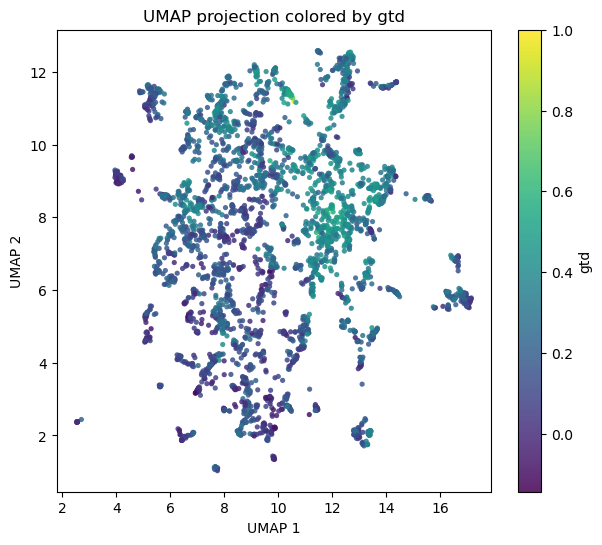

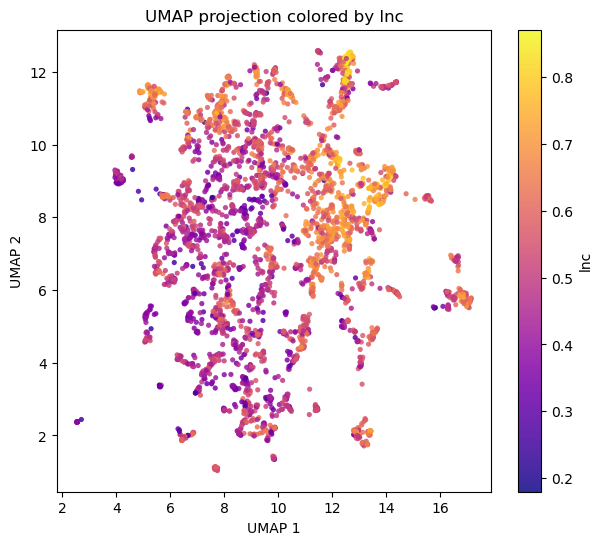

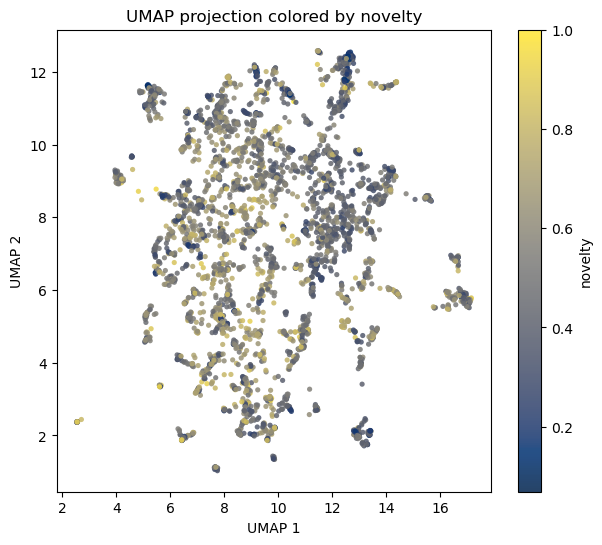

In [45]:
# Cell 3: Plot UMAP colored by numeric metric helper function
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.colors import Normalize

def plot_umap_numeric(df, metric='gtd', cmap='viridis', size=18, savepath=None):
    vals = df[metric].fillna(df[metric].mean()).values
    norm = Normalize(vmin=np.nanmin(vals), vmax=np.nanmax(vals))
    plt.figure(figsize=(7,6))
    sc = plt.scatter(df['umap_x'], df['umap_y'], c=vals, cmap=cmap, s=size, alpha=0.85, edgecolors='none')
    plt.colorbar(sc, label=metric)
    plt.title(f"UMAP projection colored by {metric}")
    plt.xlabel("UMAP 1"); plt.ylabel("UMAP 2")
    plt.grid(False)
    if savepath:
        plt.savefig(savepath, bbox_inches='tight', dpi=150)
    plt.show()

# Examples (run each cell separately to view):
plot_umap_numeric(df, metric='gtd', cmap='viridis', size=14)
plot_umap_numeric(df, metric='lnc', cmap='plasma', size=14)
plot_umap_numeric(df, metric='novelty', cmap='cividis', size=14)


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


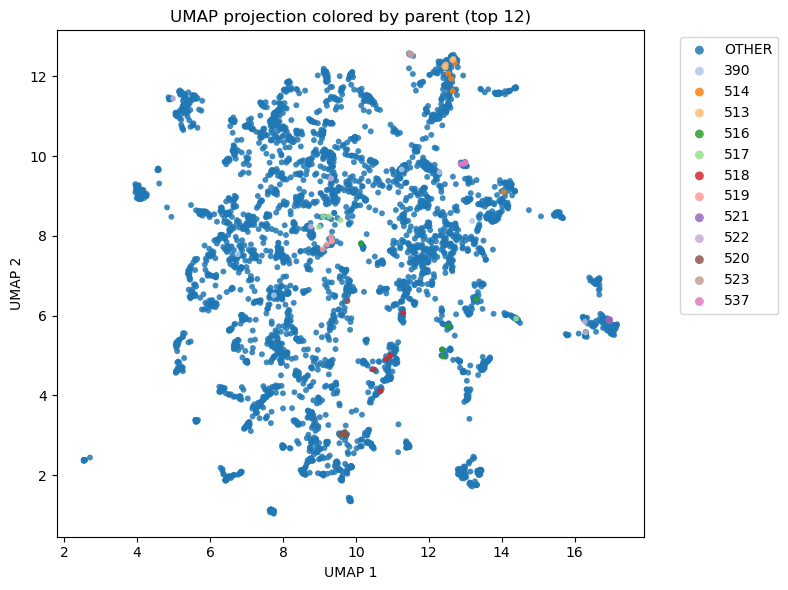

In [46]:
# Cell 4: Plot UMAP colored by categorical parent (top-K parents + 'OTHER' grouping)
import matplotlib.pyplot as plt
import seaborn as sns

def plot_umap_parent(df, top_k=10, size=20, savepath=None):
    # determine top-k parents by frequency
    parent_counts = df['parent_cat'].value_counts()
    top_parents = parent_counts.index[:top_k].tolist()
    # create a column for plotting: keep top_k as-is, group rest as OTHER
    df['parent_plot'] = df['parent_cat'].apply(lambda p: p if p in top_parents else 'OTHER')
    # palette
    unique_parents = df['parent_plot'].unique().tolist()
    palette = sns.color_palette('tab20', n_colors=max(len(unique_parents), 8))
    color_map = {p: palette[i % len(palette)] for i,p in enumerate(unique_parents)}

    plt.figure(figsize=(8,6))
    for p in unique_parents:
        sel = df[df['parent_plot'] == p]
        plt.scatter(sel['umap_x'], sel['umap_y'], s=size, color=color_map[p], alpha=0.85, label=p, edgecolors='none')
    plt.legend(markerscale=1.5, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.title(f"UMAP projection colored by parent (top {top_k})")
    plt.xlabel("UMAP 1"); plt.ylabel("UMAP 2")
    plt.tight_layout()
    if savepath:
        plt.savefig(savepath, bbox_inches='tight', dpi=150)
    plt.show()

# Example:
plot_umap_parent(df, top_k=12, size=18)

# Determining GTD cutoff

GTD range: -0.143 → 1.000


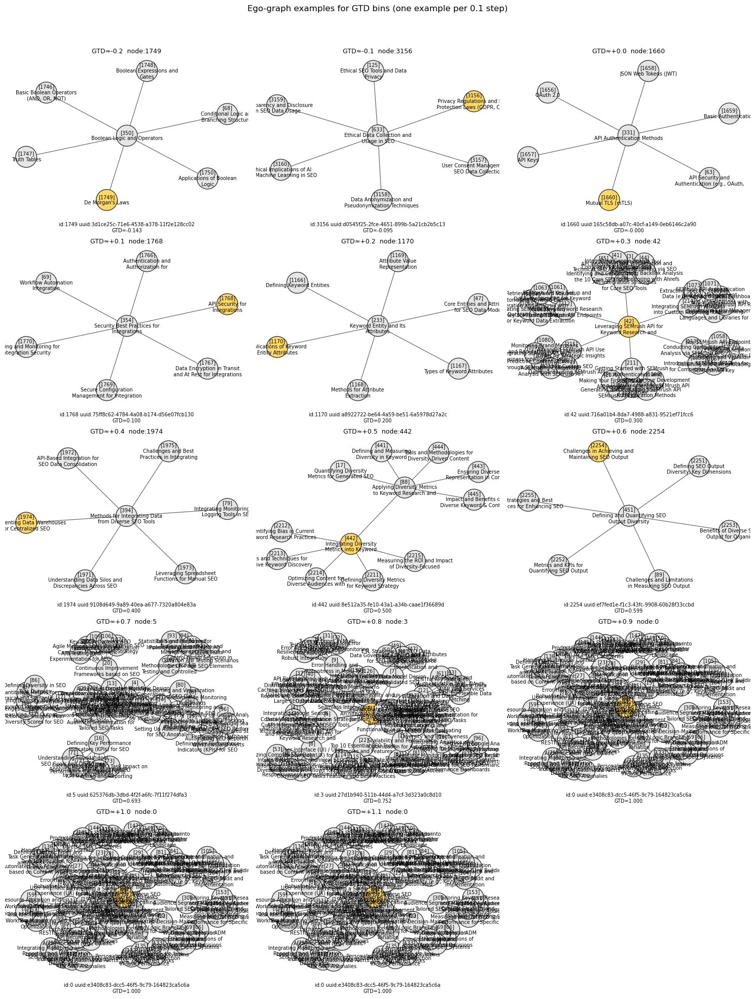


Chosen representatives (bin_center, node_id, gtd, uuid):
(-0.2, '1749', -0.14349761605262756, '3d1ce25c-71e6-4538-a378-11f2e128cc02')
(-0.1, '3156', -0.09479783475399017, 'd0545f25-2fce-4651-899b-5a21cb2b5c13')
(0.0, '1660', -1.5616416931152344e-05, '165c58db-a07c-40cf-a149-0eb6146c2a90')
(0.10000000000000003, '1768', 0.10000012069940567, '75ff8c62-4784-4a08-b174-d56e07fcb130')
(0.2, '1170', 0.19994604587554932, 'a8922722-be64-4a59-be51-6a5978d27a2c')
(0.3, '42', 0.30003148317337036, '716a01b4-8da7-4988-a831-9521ef71fcc6')
(0.4000000000000001, '1974', 0.39996710419654846, '9108d649-9a89-40ea-a677-7320a804e83a')
(0.5, '442', 0.49987247586250305, '8e512a35-fe10-43a1-a34b-caae1f36689d')
(0.6000000000000001, '2254', 0.5991601943969727, 'ef7fed1e-f1c3-43fc-9908-60b28f33ccbd')
(0.7, '5', 0.6929402947425842, '625376db-3dbd-4f2f-a6fc-7f11f274dfa3')
(0.8, '3', 0.7524615526199341, '27d1b940-511b-44d4-a7cf-3d323a0c8d10')
(0.9000000000000001, '0', 1.000000238418579, 'e3408c83-dcc5-46f5-9c79-16482

In [53]:
# Inspect examples across GTD bins (one ego-graph per 0.1 step)
# Paste-run: expects G, df, node_metrics defined, and networkx, matplotlib available.

import math
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from textwrap import fill
from math import floor, ceil

# helper: short node label
def node_label(n, width=28, max_lines=2):
    topic = (G.nodes[n].get('topic') or "").replace("\n"," ").strip()
    if not topic:
        topic = G.nodes[n]['metadata'].get('uuid') or str(n)
    wrapped = fill(topic, width=width)
    lines = wrapped.splitlines()[:max_lines]
    return f"[{n}]\n" + ("\n".join(lines)).strip()

# prepare GTD values (drop NaNs)
gtd_series = df['gtd'].dropna()
if gtd_series.empty:
    raise RuntimeError("No valid GTD values present (all NaN). Compute seed_centroid/gtd first.")

gmin = float(np.min(gtd_series))
gmax = float(np.max(gtd_series))
print(f"GTD range: {gmin:.3f} → {gmax:.3f}")

# create bins every 0.1 (centered bins)
step = 0.1
# floor/ceil to nearest 0.1
left = math.floor(gmin*10)/10.0
right = math.ceil(gmax*10)/10.0
bin_centers = np.arange(left, right + 1e-9, step)

# select representative node per bin: closest to bin center
rep_nodes = []
for c in bin_centers:
    # find nodes whose gtd is defined
    candidates = df[~df['gtd'].isna()].copy()
    if candidates.empty:
        continue
    candidates['dist'] = (candidates['gtd'] - c).abs()
    best = candidates.loc[candidates['dist'].idxmin()]
    # optional: skip if too far (no node actually near this bin)
    # if best['dist'] > step * 0.7: continue
    rep_nodes.append((c, str(best['node_id']), float(best['gtd']), best['uuid']))

if not rep_nodes:
    raise RuntimeError("No representative nodes found for GTD bins (unexpected).")

# plotting grid: determine rows/cols
n = len(rep_nodes)
cols = 3
rows = math.ceil(n / cols)
fig_w = cols * 5
fig_h = rows * 4

fig, axes = plt.subplots(rows, cols, figsize=(fig_w, fig_h))
axes = axes.flatten()

for i, (center, node_id, node_gtd, node_uuid) in enumerate(rep_nodes):
    ax = axes[i]
    inspect_node = node_id
    # ego graph (2-hop)
    H = nx.ego_graph(G.to_undirected(), inspect_node, radius=2)
    pos = nx.spring_layout(H, seed=1)

    # draw nodes/edges
    node_colors = ["#FFD966" if n==inspect_node else "#E6E6E6" for n in H.nodes]
    nx.draw_networkx_nodes(H, pos, node_size=900, node_color=node_colors, edgecolors="#333333", ax=ax)
    nx.draw_networkx_edges(H, pos, width=0.9, alpha=0.6, ax=ax)

    labels = {n: node_label(n) for n in H.nodes}
    nx.draw_networkx_labels(H, pos, labels=labels, font_size=7, ax=ax)

    ax.set_title(f"GTD≈{center:+.1f}  node:{inspect_node}", fontsize=9)
    ax.axis('off')

    # print small caption below subplot with exact info
    caption = f"id:{inspect_node} uuid:{node_uuid}\nGTD={node_gtd:.3f}"
    ax.text(0.5, -0.12, caption, transform=ax.transAxes, ha='center', fontsize=7)

# hide unused axes
for j in range(i+1, len(axes)):
    axes[j].axis('off')

plt.suptitle("Ego-graph examples for GTD bins (one example per 0.1 step)", fontsize=12)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

# Print list of chosen representatives
print("\nChosen representatives (bin_center, node_id, gtd, uuid):")
for tup in rep_nodes:
    print(tup)


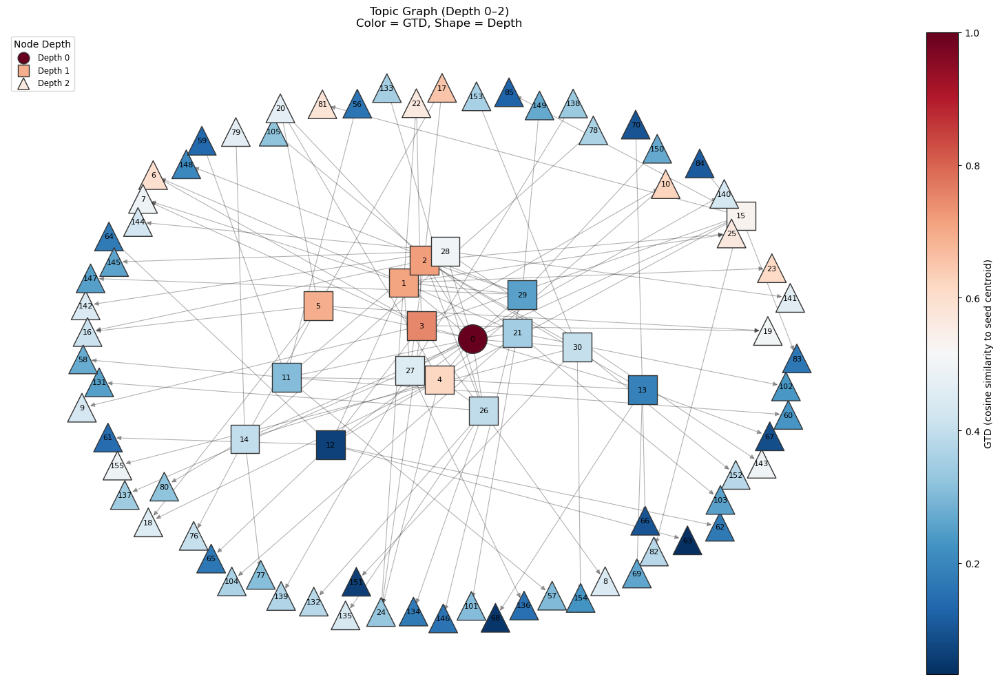

In [67]:
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np

MAX_DEPTH = 2
subgraph_nodes = [n for n in G.nodes() if G.nodes[n]['depth'] <= MAX_DEPTH]
subG = G.subgraph(subgraph_nodes)

# Layout
pos = nx.spring_layout(subG, k=1.5, iterations=80, seed=1)

# GTD values
node_colors = {
    n: node_metrics['gtd'].get(n, 0.0) if node_metrics['gtd'].get(n) is not None else 0.0
    for n in subG.nodes()
}

# Use actual min and max (not symmetric)
gmin = min(node_colors.values())
gmax = max(node_colors.values())

# Depth → marker mapping
depth_shapes = {
    0: "o",
    1: "s",
    2: "^",
    3: "D",
    4: "P",
    5: "X"
}

fig, ax = plt.subplots(figsize=(16,10))

# Draw edges
nx.draw_networkx_edges(subG, pos, alpha=0.3, width=0.8, ax=ax)

node_collection = None

for depth in sorted(set(nx.get_node_attributes(subG, 'depth').values())):
    nodes_at_depth = [n for n in subG.nodes() if subG.nodes[n]['depth'] == depth]
    if not nodes_at_depth:
        continue
    
    colors = [node_colors[n] for n in nodes_at_depth]
    
    node_collection = nx.draw_networkx_nodes(
        subG,
        pos,
        nodelist=nodes_at_depth,
        node_color=colors,
        cmap=plt.cm.RdBu_r,
        vmin=gmin,
        vmax=gmax,
        node_size=900,
        node_shape=depth_shapes.get(depth, "o"),
        edgecolors="#333333",
        label=f"Depth {depth}",
        ax=ax
    )

nx.draw_networkx_labels(
    subG,
    pos,
    labels={n: str(n) for n in subG.nodes()},
    font_size=8,
    ax=ax
)

# Correct colorbar usage
cbar = fig.colorbar(node_collection, ax=ax)
cbar.set_label("GTD (cosine similarity to seed centroid)")

ax.legend(
    title="Node Depth",
    loc="upper left",
    markerscale=0.4,   
    fontsize="small"
)
ax.set_title(f"Topic Graph (Depth 0–{MAX_DEPTH})\nColor = GTD, Shape = Depth")
ax.axis("off")

plt.tight_layout()
plt.show()



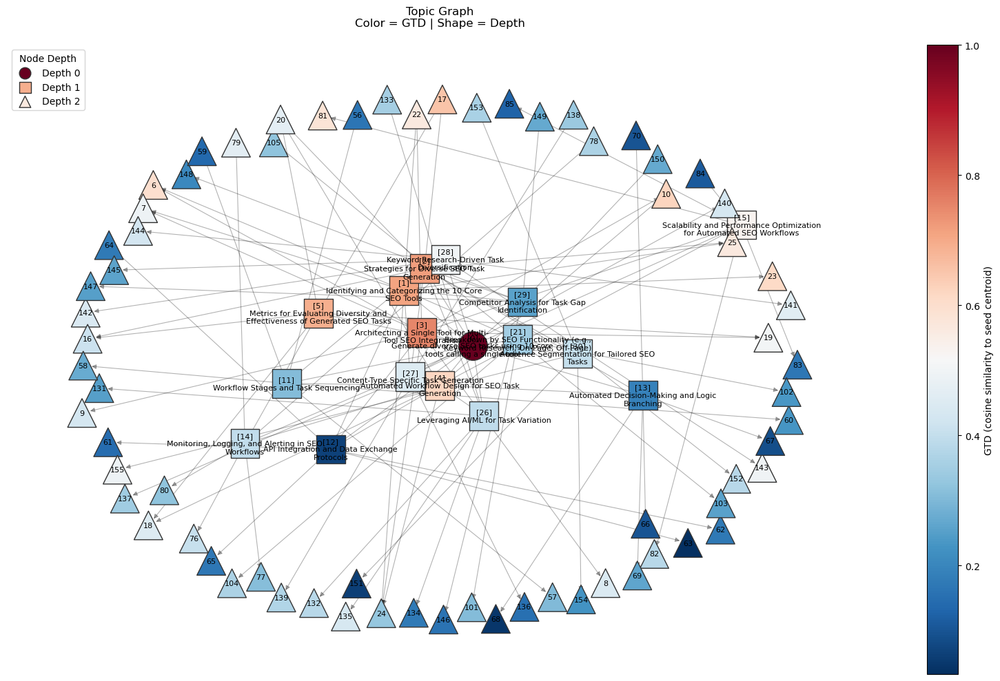

In [76]:
import matplotlib.pyplot as plt
import networkx as nx
from textwrap import fill

MAX_DEPTH = 2
subgraph_nodes = [n for n in G.nodes() if G.nodes[n]['depth'] <= MAX_DEPTH]
subG = G.subgraph(subgraph_nodes)

pos = nx.spring_layout(subG, k=1.5, iterations=80, seed=1)

# GTD color values
node_colors = {
    n: node_metrics['gtd'].get(n, 0.0) if node_metrics['gtd'].get(n) is not None else 0.0
    for n in subG.nodes()
}

gmin = min(node_colors.values())
gmax = max(node_colors.values())

depth_shapes = {
    0: "o",
    1: "s",
    2: "^",
    3: "D",
    4: "P",
    5: "X"
}

fig, ax = plt.subplots(figsize=(16,10))

# Draw edges
nx.draw_networkx_edges(subG, pos, alpha=0.3, width=0.8, ax=ax)

# Draw nodes grouped by depth
for depth in sorted(set(nx.get_node_attributes(subG, 'depth').values())):
    nodes_at_depth = [n for n in subG.nodes() if subG.nodes[n]['depth'] == depth]
    if not nodes_at_depth:
        continue
    
    colors = [node_colors[n] for n in nodes_at_depth]
    
    node_collection = nx.draw_networkx_nodes(
        subG,
        pos,
        nodelist=nodes_at_depth,
        node_color=colors,
        cmap=plt.cm.RdBu_r,
        vmin=gmin,
        vmax=gmax,
        node_size=900,
        node_shape=depth_shapes.get(depth, "o"),
        edgecolors="#333333",
        label=f"Depth {depth}",
        ax=ax
    )

# ---- Labels ----

labels = {}

for n in subG.nodes():
    depth = subG.nodes[n]['depth']
    
    if depth in [0, 1]:
        # Show full topic (wrapped)
        topic = G.nodes[n].get('topic', '').replace("\n", " ").strip()
        topic_wrapped = fill(topic, width=40)
        labels[n] = f"[{n}]\n{topic_wrapped}"
    else:
        # Only show node id
        labels[n] = str(n)

nx.draw_networkx_labels(
    subG,
    pos,
    labels=labels,
    font_size=8,
    ax=ax
)

# Colorbar
cbar = fig.colorbar(node_collection, ax=ax)
cbar.set_label("GTD (cosine similarity to seed centroid)")

ax.legend(title="Node Depth", loc="upper left", markerscale=0.4)
ax.set_title("Topic Graph\nColor = GTD | Shape = Depth\n")
ax.axis("off")

plt.tight_layout()
plt.show()


In [75]:
threshold = 0.3

# Ensure GTD exists and drop NaNs
valid_df = df[~df['gtd'].isna()]

# ---- Overall ----
total_nodes = len(valid_df)
below_total = (valid_df['gtd'] < threshold).sum()

print(f"Overall:")
print(f"Nodes with GTD < {threshold}: {below_total} / {total_nodes} "
      f"({below_total/total_nodes:.2%})")

print("\nBy depth:")

# ---- Per depth ----
for depth in sorted(valid_df['depth'].dropna().unique()):
    subset = valid_df[valid_df['depth'] == depth]
    total = len(subset)
    below = (subset['gtd'] < threshold).sum()
    
    print(f"Depth {int(depth)}: "
          f"{below} / {total} ({below/total:.2%})")

Overall:
Nodes with GTD < 0.3: 2640 / 3906 (67.59%)

By depth:
Depth 0: 0 / 1 (0.00%)
Depth 1: 3 / 16 (18.75%)
Depth 2: 30 / 69 (43.48%)
Depth 3: 221 / 345 (64.06%)
Depth 4: 1283 / 1725 (74.38%)
Depth 5: 1103 / 1750 (63.03%)


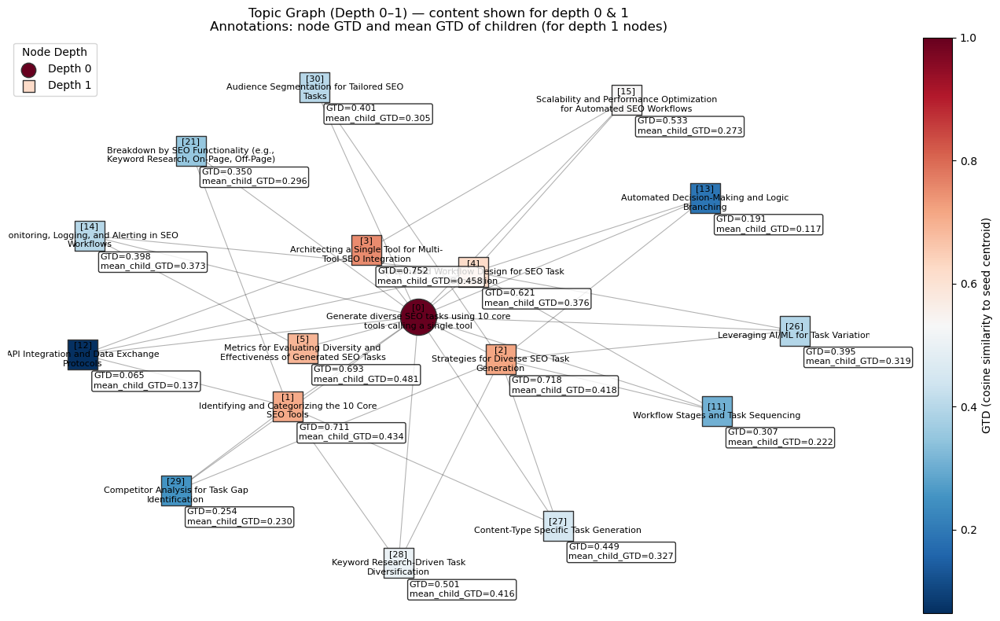

Depth-1 node summary: (node_id, own_gtd, mean_child_gtd, num_children)
1	 0.7113124132156372	 0.4343102140860124	 11
11	 0.30692732334136963	 0.22158631086349487	 5
12	 0.06455618143081665	 0.13744599968194962	 5
13	 0.19143353402614594	 0.11733916029334068	 5
14	 0.39811018109321594	 0.3730930984020233	 5
15	 0.5328593254089355	 0.2729895025491714	 5
2	 0.7176869511604309	 0.418084132400426	 11
21	 0.3501361608505249	 0.2956454813480377	 5
26	 0.3945605158805847	 0.3193635046482086	 5
27	 0.44861721992492676	 0.3269969880580902	 5
28	 0.5011248588562012	 0.4163181960582733	 5
29	 0.2538928687572479	 0.23009303212165833	 5
3	 0.7524615526199341	 0.4582703113555908	 10
30	 0.4012889564037323	 0.30489437058568003	 5
4	 0.6209182739257812	 0.37581693679094313	 10
5	 0.6929402947425842	 0.4807823846737544	 6


In [77]:
# Plot subgraph (max depth = 1), show content and annotate GTD + mean child GTD
import matplotlib.pyplot as plt
import networkx as nx
from textwrap import fill
import numpy as np

MAX_DEPTH = 1
subgraph_nodes = [n for n in G.nodes() if (G.nodes[n].get('depth') is not None and G.nodes[n]['depth'] <= MAX_DEPTH)]
subG = G.subgraph(subgraph_nodes).copy()

# layout
pos = nx.spring_layout(subG, k=1.2, iterations=80, seed=1)

# GTD values for coloring
node_colors = {n: node_metrics['gtd'].get(n, np.nan) for n in subG.nodes()}
valid_vals = [v for v in node_colors.values() if not (v is None or np.isnan(v))]
gmin = float(np.nanmin(valid_vals)) if valid_vals else -1.0
gmax = float(np.nanmax(valid_vals)) if valid_vals else 1.0

# shapes
depth_shapes = {0: "o", 1: "s"}

fig, ax = plt.subplots(figsize=(14,8))

# draw edges
nx.draw_networkx_edges(subG, pos, alpha=0.3, width=0.8, ax=ax)

node_collection = None
for depth in sorted({G.nodes[n].get('depth') for n in subG.nodes()}):
    nodes_at_depth = [n for n in subG.nodes() if G.nodes[n].get('depth') == depth]
    if not nodes_at_depth:
        continue
    colors = [node_colors[n] if not (node_colors[n] is None or np.isnan(node_colors[n])) else 0.0 for n in nodes_at_depth]
    node_collection = nx.draw_networkx_nodes(
        subG, pos,
        nodelist=nodes_at_depth,
        node_color=colors,
        cmap=plt.cm.RdBu_r,
        vmin=gmin,
        vmax=gmax,
        node_size=1100 if depth==0 else 750,
        node_shape=depth_shapes.get(depth, "o"),
        edgecolors="#333333",
        ax=ax,
        label=f"Depth {depth}"
    )

# Build labels: show full topic for depth 0 and 1
labels = {}
for n in subG.nodes():
    depth = G.nodes[n].get('depth')
    topic = (G.nodes[n].get('topic') or "").replace("\n", " ").strip()
    if depth in [0, 1]:
        wrapped = fill(topic, width=40)
        labels[n] = f"[{n}]\n{wrapped}"
    else:
        labels[n] = str(n)

nx.draw_networkx_labels(subG, pos, labels=labels, font_size=8, ax=ax)

# Annotate depth-1 nodes with own GTD and mean GTD of their children
summary = []
for n in sorted(subG.nodes(), key=lambda x: (G.nodes[x].get('depth', 0), str(x))):
    if G.nodes[n].get('depth') != 1:
        continue
    # own GTD
    own_gtd = node_metrics['gtd'].get(n, None)
    own_str = f"GTD={own_gtd:.3f}" if own_gtd is not None and not np.isnan(own_gtd) else "GTD=NaN"
    # children (use stored children list on node if available)
    children = G.nodes[n].get('children', []) or []
    child_gtds = []
    for c in children:
        # normalize key type
        c_key = c
        if c_key in node_metrics['gtd']:
            v = node_metrics['gtd'].get(c_key)
            if v is not None and not np.isnan(v):
                child_gtds.append(v)
    if child_gtds:
        mean_child = float(np.mean(child_gtds))
        child_str = f"mean_child_GTD={mean_child:.3f}"
    else:
        mean_child = None
        child_str = "mean_child_GTD=NaN"
    # annotate near node
    x, y = pos[n]
    ax.annotate(f"{own_str}\n{child_str}", xy=(x,y), xytext=(10,-30),
                textcoords='offset points', fontsize=8, bbox=dict(boxstyle="round,pad=0.2", fc="w", alpha=0.8))
    summary.append((n, own_gtd, mean_child, children))

# colorbar
if node_collection is not None:
    cbar = fig.colorbar(node_collection, ax=ax)
    cbar.set_label("GTD (cosine similarity to seed centroid)")

ax.legend(title="Node Depth", loc="upper left", markerscale=0.4)
ax.set_title(f"Topic Graph (Depth 0–{MAX_DEPTH}) — content shown for depth 0 & 1\nAnnotations: node GTD and mean GTD of children (for depth 1 nodes)")
ax.axis("off")
plt.tight_layout()
plt.show()

# Print summary table
print("Depth-1 node summary: (node_id, own_gtd, mean_child_gtd, num_children)")
for item in summary:
    nid, og, mg, childs = item
    print(f"{nid}\t {og if og is not None else 'NaN'}\t {mg if mg is not None else 'NaN'}\t {len(childs)}")


In [78]:
import pandas as pd
from textwrap import shorten

summary_rows = []

for n in sorted(subG.nodes()):
    if G.nodes[n].get('depth') != 1:
        continue
    
    # Node content
    topic = (G.nodes[n].get('topic') or "").replace("\n", " ").strip()
    
    # Own GTD
    own_gtd = node_metrics['gtd'].get(n)
    
    # Children
    children = G.nodes[n].get('children', []) or []
    child_gtds = []
    child_examples = []
    
    for c in children:
        v = node_metrics['gtd'].get(c)
        if v is not None and not pd.isna(v):
            child_gtds.append(v)
        
        # collect example child topics (limit 3)
        if len(child_examples) < 3:
            child_topic = (G.nodes[c].get('topic') or "").replace("\n", " ").strip()
            child_examples.append(shorten(child_topic, width=60))
    
    mean_child_gtd = sum(child_gtds)/len(child_gtds) if child_gtds else None
    
    summary_rows.append({
        "Node ID": n,
        "Node GTD": round(own_gtd, 3) if own_gtd is not None else None,
        "Mean Child GTD": round(mean_child_gtd, 3) if mean_child_gtd is not None else None,
        "# Children": len(children),
        "Node Topic": shorten(topic, width=80),
        "Example Children": " | ".join(child_examples)
    })

summary_df = pd.DataFrame(summary_rows)

summary_df.sort_values("Node GTD", ascending=False)


,Node ID,Node GTD,Mean Child GTD,# Children,Node Topic,Example Children
12,3,0.752,0.458,10,Architecting a Single Tool for Multi-Tool SEO ...,API Integration Strategies for Core SEO Tools ...
6,2,0.718,0.418,11,Strategies for Diverse SEO Task Generation,Workflow Stages and Task Sequencing | Automate...
0,1,0.711,0.434,11,Identifying and Categorizing the 10 Core SEO T...,API Integration Strategies for Core SEO Tools ...
15,5,0.693,0.481,6,Metrics for Evaluating Diversity and Effective...,"Monitoring, Logging, and Alerting in SEO Workf..."
14,4,0.621,0.376,10,Automated Workflow Design for SEO Task Generation,Scalability and Performance Optimization for [...
5,15,0.533,0.273,5,Scalability and Performance Optimization for A...,Distributed Processing for Large-Scale SEO Tas...
10,28,0.501,0.416,5,Keyword Research-Driven Task Diversification,Identifying New Keyword Niches for Task Expans...
9,27,0.449,0.327,5,Content-Type Specific Task Generation,Defining Content Types and Schemas | Task Spec...
13,30,0.401,0.305,5,Audience Segmentation for Tailored SEO Tasks,"Types of Audience Segmentation (Demographic, [..."
4,14,0.398,0.373,5,"Monitoring, Logging, and Alerting in SEO Workf...",SEO Performance Monitoring Dashboards | Techni...


#### relationship between GTD and children GTD

In [149]:
import pandas as pd
from textwrap import shorten
import math

summary_rows = []

# iterate over nodes in subG (or switch to G if you prefer)
for n in sorted(subG.nodes()):
    # Node content
    topic = (G.nodes[n].get('topic') or "").replace("\n", " ").strip()

    # own GTD / LTD (may be None or NaN)
    own_gtd = node_metrics['gtd'].get(n)
    own_ltd = node_metrics.get('ltd', {}).get(n)

    # Children
    children = G.nodes[n].get('children', []) or []
    child_gtds = []
    child_ltds = []
    child_examples = []

    for c in children:
        # collect child GTD
        v_gtd = node_metrics['gtd'].get(c)
        if v_gtd is not None and not (isinstance(v_gtd, float) and math.isnan(v_gtd)):
            child_gtds.append(v_gtd)

        # collect child LTD
        v_ltd = node_metrics.get('ltd', {}).get(c)
        if v_ltd is not None and not (isinstance(v_ltd, float) and math.isnan(v_ltd)):
            child_ltds.append(v_ltd)

        # collect example child topics (limit 3)
        if len(child_examples) < 3:
            child_topic = (G.nodes[c].get('topic') or "").replace("\n", " ").strip()
            child_examples.append(shorten(child_topic, width=60))

    mean_child_gtd = float(sum(child_gtds) / len(child_gtds)) if child_gtds else None
    mean_child_ltd = float(sum(child_ltds) / len(child_ltds)) if child_ltds else None

    summary_rows.append({
        "Node ID": n,
        "Depth": G.nodes[n].get('depth', None),
        "Node GTD": round(own_gtd, 3) if (own_gtd is not None and not (isinstance(own_gtd, float) and math.isnan(own_gtd))) else None,
        "Node LTD": round(own_ltd, 3) if (own_ltd is not None and not (isinstance(own_ltd, float) and math.isnan(own_ltd))) else None,
        "Mean Child GTD": round(mean_child_gtd, 3) if mean_child_gtd is not None else None,
        "Mean Child LTD": round(mean_child_ltd, 3) if mean_child_ltd is not None else None,
        "# Children": len(children),
        "Node Topic": shorten(topic, width=80),
        "Example Children": " | ".join(child_examples)
    })

summary_df = pd.DataFrame(summary_rows)

# Example sorts / views:
# - sort by depth then Node GTD descending:
summary_df_sorted = summary_df.sort_values(["Depth", "Node GTD"], ascending=[True, False])

# show
summary_df_sorted.reset_index(drop=True).head(200)


,Node ID,Depth,Node GTD,Node LTD,Mean Child GTD,Mean Child LTD,# Children,Node Topic,Example Children
0,0,0,1.000,NaN,0.459,0.558,16,Generate diverse SEO tasks using 10 core tools...,Identifying and Categorizing the 10 Core SEO T...
1,3,1,0.752,0.752,0.458,0.612,10,Architecting a Single Tool for Multi-Tool SEO ...,API Integration Strategies for Core SEO Tools ...
2,2,1,0.718,0.718,0.418,0.554,11,Strategies for Diverse SEO Task Generation,Workflow Stages and Task Sequencing | Automate...
3,1,1,0.711,0.711,0.434,0.574,11,Identifying and Categorizing the 10 Core SEO T...,API Integration Strategies for Core SEO Tools ...
4,5,1,0.693,0.693,0.481,0.661,6,Metrics for Evaluating Diversity and Effective...,"Monitoring, Logging, and Alerting in SEO Workf..."
...,...,...,...,...,...,...,...,...,...
195,700,3,0.326,0.647,0.238,0.402,5,Evaluation Metrics for Generated Visual Tasks,"Quantitative Metrics (e.g., FID, Inception Sco..."
196,45,3,0.325,0.664,0.293,0.564,5,API Integration for Technical SEO Audits and S...,Google Search Console API for Indexing and Cra...
197,495,3,0.325,0.591,0.288,0.631,5,Keyword Performance Tracking and Reporting,Keyword Ranking and Position Tracking | Organi...
198,761,3,0.325,0.686,0.264,0.673,5,Demographic Profiling for SEO Audience,Defining Target Demographics for SEO | Data Co...


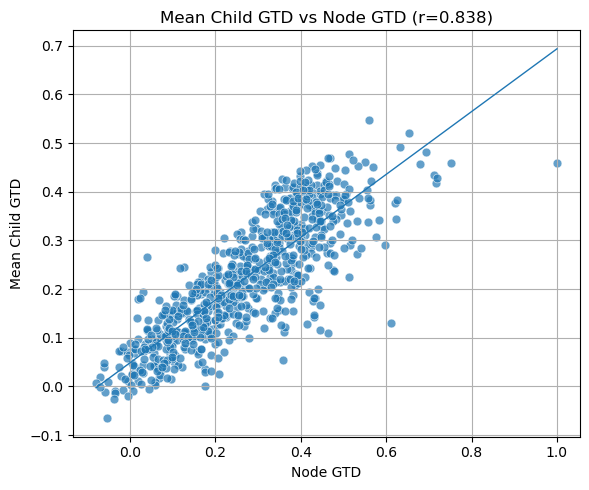

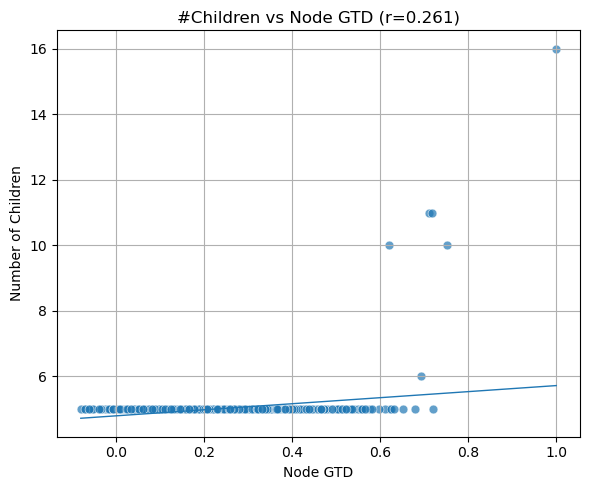

In [155]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from textwrap import shorten
import math

# --- Build summary_df if not present (robust) ---
summary_rows = []
for n in sorted(G.nodes()):
    topic = (G.nodes[n].get('topic') or "").replace("\n", " ").strip()
    own_gtd = node_metrics['gtd'].get(n)
    own_ltd = node_metrics.get('ltd', {}).get(n)

    children = G.nodes[n].get('children', []) or []
    child_gtds = []
    child_ltds = []
    for c in children:
        v_gtd = node_metrics['gtd'].get(c)
        if v_gtd is not None and not (isinstance(v_gtd, float) and math.isnan(v_gtd)):
            child_gtds.append(v_gtd)
        v_ltd = node_metrics.get('ltd', {}).get(c)
        if v_ltd is not None and not (isinstance(v_ltd, float) and math.isnan(v_ltd)):
            child_ltds.append(v_ltd)

    mean_child_gtd = float(np.mean(child_gtds)) if child_gtds else np.nan
    mean_child_ltd = float(np.mean(child_ltds)) if child_ltds else np.nan

    summary_rows.append({
        "node_id": n,
        "depth": G.nodes[n].get('depth', None),
        "node_gtd": own_gtd if own_gtd is not None else np.nan,
        "node_ltd": own_ltd if own_ltd is not None else np.nan,
        "mean_child_gtd": mean_child_gtd,
        "mean_child_ltd": mean_child_ltd,
        "#children": len(children),
        "topic": shorten(topic, width=80)
    })

summary_df = pd.DataFrame(summary_rows)

# Optionally filter to nodes that actually have children (otherwise mean_child_* will be NaN)
has_children = summary_df['#children'] > 0
plot_df = summary_df[has_children].dropna(subset=['node_gtd', 'node_ltd', 'mean_child_gtd', 'mean_child_ltd'], how='all').copy()

# helper for pearson r safely
def pearson_r(x, y):
    mask = (~np.isnan(x)) & (~np.isnan(y))
    if mask.sum() < 2:
        return np.nan
    return float(np.corrcoef(x[mask], y[mask])[0,1])


plt.figure(figsize=(6,5))
ax = plt.gca()

x = plot_df['node_gtd'].values
y = plot_df['mean_child_gtd'].values

sns.scatterplot(x=x, y=y, s=40, alpha=0.7, ax=ax)
sns.regplot(x=x, y=y, scatter=False, ci=None, line_kws={'linewidth':1}, ax=ax)

r = pearson_r(x, y)

ax.set_xlabel("Node GTD")
ax.set_ylabel("Mean Child GTD")
ax.set_title(f"Mean Child GTD vs Node GTD (r={r:.3f})")
ax.grid(True)

plt.tight_layout()
plt.show()

plt.figure(figsize=(6,5))
ax = plt.gca()

x = plot_df['node_gtd'].values
y = plot_df['#children'].values

sns.scatterplot(x=x, y=y, s=40, alpha=0.7, ax=ax)
sns.regplot(x=x, y=y, scatter=False, ci=None, line_kws={'linewidth':1}, ax=ax)

# Pearson correlation
mask = (~np.isnan(x)) & (~np.isnan(y))
r = np.corrcoef(x[mask], y[mask])[0,1] if mask.sum() > 1 else np.nan

ax.set_xlabel("Node GTD")
ax.set_ylabel("Number of Children")
ax.set_title(f"#Children vs Node GTD (r={r:.3f})")
ax.grid(True)

plt.tight_layout()
plt.show()



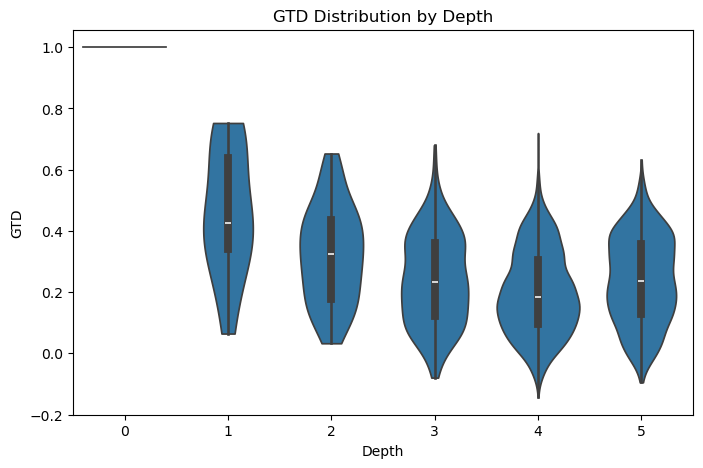

In [71]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8,5))
sns.violinplot(
    data=df,
    x='depth',
    y='gtd',
    cut=0
)

plt.title("GTD Distribution by Depth")
plt.xlabel("Depth")
plt.ylabel("GTD")
plt.show()



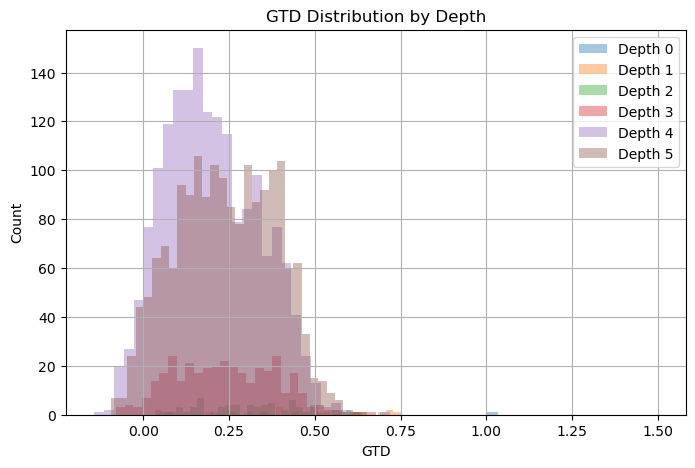

In [72]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8,5))

for depth in sorted(df['depth'].dropna().unique()):
    subset = df[df['depth'] == depth]['gtd'].dropna()
    plt.hist(subset, bins=30, alpha=0.4, label=f"Depth {int(depth)}")

plt.xlabel("GTD")
plt.ylabel("Count")
plt.title("GTD Distribution by Depth")
plt.legend()
plt.grid(True)
plt.show()

### Prune at depth = 1 (GTD > 0.25)

In [79]:
# Cell A: Filter out depth-1 nodes with GTD < 0.25 and all their descendants
import networkx as nx
import copy

threshold = 0.25

# make a copy so we don't mutate the original graph
G_filt = copy.deepcopy(G)

# find depth-1 nodes with GTD < threshold
depth1_nodes = [n for n in G.nodes() if G.nodes[n].get('depth') == 1]
bad_depth1 = [n for n in depth1_nodes if (node_metrics['gtd'].get(n) is not None and node_metrics['gtd'][n] < threshold)]

print("Depth-1 nodes to remove (GTD < {:.3f}):".format(threshold), bad_depth1)

# helper: gather all descendants of a node (directed)
def gather_descendants(Gd, start):
    seen = set()
    stack = [start]
    while stack:
        u = stack.pop()
        if u in seen:
            continue
        seen.add(u)
        # get children from graph node attr if present else successors
        children = Gd.nodes[u].get('children') or list(Gd.successors(u))
        for c in children:
            if c not in seen:
                stack.append(c)
    # exclude the start itself? we want to remove start + descendants, so keep all
    return seen

# collect nodes to remove
to_remove = set()
for n in bad_depth1:
    desc = gather_descendants(G_filt, n)
    to_remove.update(desc)

print("Total nodes to remove (including descendants):", len(to_remove))

# remove nodes (if they still exist in G_filt)
for n in list(to_remove):
    if n in G_filt:
        G_filt.remove_node(n)

print("Filtered graph: nodes before =", G.number_of_nodes(), "after =", G_filt.number_of_nodes())
# optionally rebuild node depths for G_filt if you rely on them (we'll keep original depth attributes, but nodes removed)


Depth-1 nodes to remove (GTD < 0.250): ['12', '13']
Total nodes to remove (including descendants): 312
Filtered graph: nodes before = 3906 after = 3594


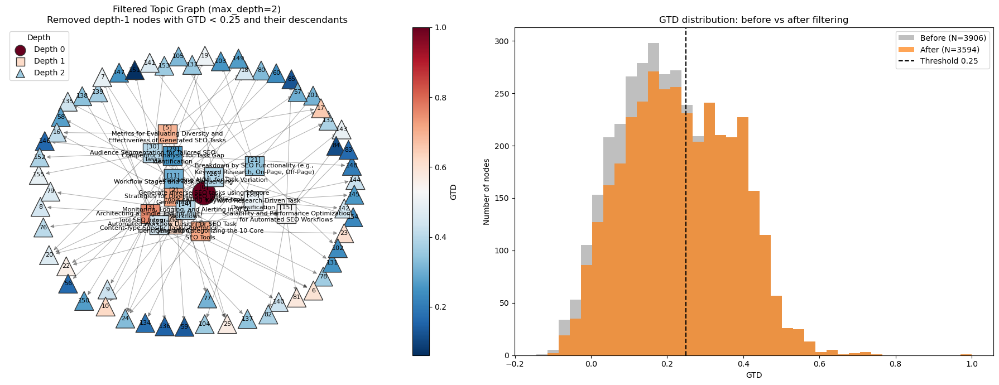

Nodes before: 3906, after: 3594
Nodes removed: 312


In [80]:
# Cell B: visualize graph (max_depth=2) for filtered graph and plot histogram of GTD before vs after
import matplotlib.pyplot as plt
import numpy as np
import networkx as nx
from textwrap import fill

MAX_DEPTH = 2

# nodes for plotting: only nodes remaining in filtered graph whose original depth <= MAX_DEPTH
plot_nodes = [n for n in G_filt.nodes() if (G.nodes[n].get('depth') is not None and G.nodes[n].get('depth') <= MAX_DEPTH)]
subG = G_filt.subgraph(plot_nodes).copy()

pos = nx.spring_layout(subG, k=1.2, iterations=80, seed=1)

# GTD color values (use original node_metrics)
node_colors = {n: node_metrics['gtd'].get(n, np.nan) for n in subG.nodes()}
valid_vals = [v for v in node_colors.values() if not (v is None or np.isnan(v))]
if valid_vals:
    gmin = float(np.nanmin(valid_vals))
    gmax = float(np.nanmax(valid_vals))
else:
    gmin, gmax = -1.0, 1.0

depth_shapes = {0: "o", 1: "s", 2: "^"}

fig, ax = plt.subplots(1, 2, figsize=(18, 7))

# Left: Graph plot colored by GTD, shape by depth
axg = ax[0]
nx.draw_networkx_edges(subG, pos, alpha=0.3, width=0.8, ax=axg)

node_collection = None
for depth in sorted({G.nodes[n].get('depth') for n in subG.nodes()}):
    nodes_at_depth = [n for n in subG.nodes() if G.nodes[n].get('depth') == depth]
    if not nodes_at_depth:
        continue
    colors = [node_colors[n] if not (node_colors[n] is None or np.isnan(node_colors[n])) else 0.0 for n in nodes_at_depth]
    node_collection = nx.draw_networkx_nodes(
        subG, pos,
        nodelist=nodes_at_depth,
        node_color=colors,
        cmap=plt.cm.RdBu_r,
        vmin=gmin, vmax=gmax,
        node_size=900 if depth==0 else 600,
        node_shape=depth_shapes.get(depth, "o"),
        edgecolors="#333333",
        label=f"Depth {depth}",
        ax=axg
    )

# labels: show full content for depth 0 and 1
labels = {}
for n in subG.nodes():
    depth = G.nodes[n].get('depth')
    topic = (G.nodes[n].get('topic') or "").replace("\n", " ").strip()
    if depth in [0,1]:
        labels[n] = f"[{n}]\n" + fill(topic, width=40)
    else:
        labels[n] = str(n)

nx.draw_networkx_labels(subG, pos, labels=labels, font_size=8, ax=axg)

if node_collection is not None:
    cbar = fig.colorbar(node_collection, ax=axg)
    cbar.set_label("GTD")

axg.legend(title="Depth", loc="upper left", markerscale=0.45)
axg.set_title(f"Filtered Topic Graph (max_depth={MAX_DEPTH})\nRemoved depth-1 nodes with GTD < {threshold} and their descendants")
axg.axis("off")

# Right: histogram before vs after
axh = ax[1]
# prepare GTD arrays (use only nodes present in original df)
all_gtd = np.array([v for v in node_metrics['gtd'].values() if v is not None and not np.isnan(v)])
# after: GTD of nodes remaining in G_filt
after_nodes = [n for n in G_filt.nodes() if node_metrics['gtd'].get(n) is not None and not np.isnan(node_metrics['gtd'].get(n))]
after_gtd = np.array([node_metrics['gtd'][n] for n in after_nodes])

bins = np.linspace(min(all_gtd.min(), after_gtd.min()) - 1e-6, max(all_gtd.max(), after_gtd.max()) + 1e-6, 40)

axh.hist(all_gtd, bins=bins, alpha=0.5, label=f"Before (N={len(all_gtd)})", color='gray')
axh.hist(after_gtd, bins=bins, alpha=0.7, label=f"After (N={len(after_gtd)})", color='C1')
axh.axvline(threshold, color='k', linestyle='--', label=f"Threshold {threshold}")
axh.set_xlabel("GTD")
axh.set_ylabel("Number of nodes")
axh.set_title("GTD distribution: before vs after filtering")
axh.legend()

plt.tight_layout()
plt.show()

# Print counts summary
print(f"Nodes before: {G.number_of_nodes()}, after: {G_filt.number_of_nodes()}")
print(f"Nodes removed: {G.number_of_nodes() - G_filt.number_of_nodes()}")


## Prune at depth 2 level using GTD

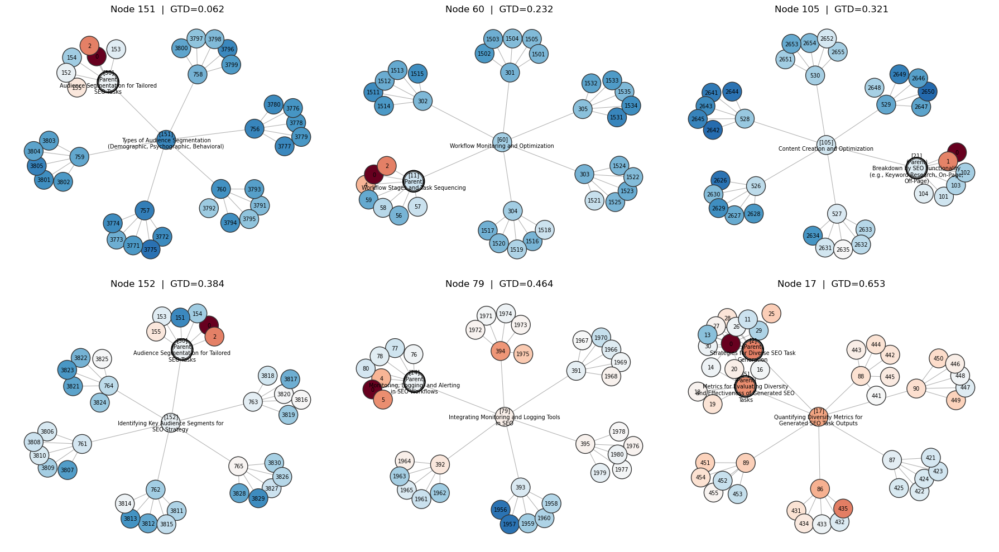


SUMMARY: sampled depth-2 nodes and their parent(s)

Node 151  |  GTD = 0.062
  Parent 30  |  GTD = 0.401  |  Topic: Audience Segmentation for Tailored SEO Tasks
--------------------------------------------------------------------------------
Node 60  |  GTD = 0.232
  Parent 11  |  GTD = 0.307  |  Topic: Workflow Stages and Task Sequencing
--------------------------------------------------------------------------------
Node 105  |  GTD = 0.321
  Parent 21  |  GTD = 0.35  |  Topic: Breakdown by SEO Functionality (e.g., Keyword Research, On-Page, Off-Page)
--------------------------------------------------------------------------------
Node 152  |  GTD = 0.384
  Parent 30  |  GTD = 0.401  |  Topic: Audience Segmentation for Tailored SEO Tasks
--------------------------------------------------------------------------------
Node 79  |  GTD = 0.464
  Parent 14  |  GTD = 0.398  |  Topic: Monitoring, Logging, and Alerting in SEO Workflows
------------------------------------------------------

In [84]:
# Inspect depth-2 nodes and show parent content as well
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
from textwrap import fill
import math

# CONFIG
DEPTH = 2
N_SAMPLES = 6
RADIUS = 2

# gather valid depth-2 nodes
depth_nodes = [n for n in G_filt.nodes() if G_filt.nodes[n].get('depth') == DEPTH and node_metrics['gtd'].get(n) is not None]
if not depth_nodes:
    raise RuntimeError("No depth-2 nodes with valid GTD found.")

depth_nodes_sorted = sorted(depth_nodes, key=lambda n: node_metrics['gtd'][n])
indices = np.linspace(0, len(depth_nodes_sorted)-1, N_SAMPLES, dtype=int)
sample_nodes = [depth_nodes_sorted[i] for i in indices]

# color range for GTD
all_gtd = [v for v in node_metrics['gtd'].values() if v is not None and not np.isnan(v)]
gmin, gmax = min(all_gtd), max(all_gtd)

cols = 3
rows = math.ceil(len(sample_nodes)/cols)
fig, axes = plt.subplots(rows, cols, figsize=(cols*6, rows*5))
axes = axes.flatten()

summary = []

for i, node_id in enumerate(sample_nodes):
    ax = axes[i]
    H = nx.ego_graph(G.to_undirected(), node_id, radius=RADIUS)
    pos = nx.spring_layout(H, seed=1)
    
    # node colors by GTD
    colors = [ node_metrics['gtd'].get(n, 0.0) if node_metrics['gtd'].get(n) is not None else 0.0 for n in H.nodes() ]
    nx.draw_networkx_edges(H, pos, alpha=0.3, width=0.8, ax=ax)
    nodes = nx.draw_networkx_nodes(H, pos,
                                   node_color=colors,
                                   cmap=plt.cm.RdBu_r,
                                   vmin=gmin, vmax=gmax,
                                   node_size=600,
                                   edgecolors="#333333",
                                   ax=ax)
    
    # parents (immediate parents of node_id) - may be list
    parents = G_filt.nodes[node_id].get('parents') or []
    parent_ids = [str(p) for p in parents]
    
    # build labels: full for inspected node and for parents; ids for others
    labels = {}
    for n in H.nodes():
        n_str = str(n)
        if n == node_id:
            topic = (G_filt.nodes[n].get('topic') or "").replace("\n"," ").strip()
            labels[n] = f"[{n}]\n{fill(topic, width=40)}"
        elif n_str in parent_ids or n in parents:
            # parent full content
            topic = (G_filt.nodes[n].get('topic') or "").replace("\n"," ").strip()
            labels[n] = f"[{n}]\n(Parent)\n{fill(topic, width=35)}"
        else:
            labels[n] = str(n)
    
    nx.draw_networkx_labels(H, pos, labels=labels, font_size=7, ax=ax)
    
    # highlight parent nodes visually with a thicker edge / different facecolor: draw them again
    for p in parents:
        if p in H.nodes():
            nx.draw_networkx_nodes(H, pos, nodelist=[p], node_size=760,
                                   node_color='none', edgecolors='black', linewidths=1.6, ax=ax)
    
    ax.set_title(f"Node {node_id}  |  GTD={node_metrics['gtd'][node_id]:.3f}")
    ax.axis("off")
    
    # collect parent summary
    parent_details = []
    for p in parents:
        p_topic = (G_filt.nodes[p].get('topic') or "").replace("\n"," ").strip()
        p_gtd = node_metrics['gtd'].get(p)
        parent_details.append((p, round(p_gtd,3) if p_gtd is not None else None, p_topic[:140]))
    summary.append((node_id, round(node_metrics['gtd'][node_id],3), parent_details))

# hide unused axes
for j in range(i+1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

# Print concise summary for each sampled node and its parent(s)
print("\nSUMMARY: sampled depth-2 nodes and their parent(s)\n")
for node_id, node_gtd, parents in summary:
    print(f"Node {node_id}  |  GTD = {node_gtd:.3f}")
    if not parents:
        print("  (No recorded parents)")
    for (pid, pgtd, ptopic) in parents:
        print(f"  Parent {pid}  |  GTD = {pgtd}  |  Topic: {ptopic}")
    print("-"*80)


/var/folders/vt/y72wtch959d241m26rz762980000gq/T/ipykernel_51752/1356164947.py:105: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


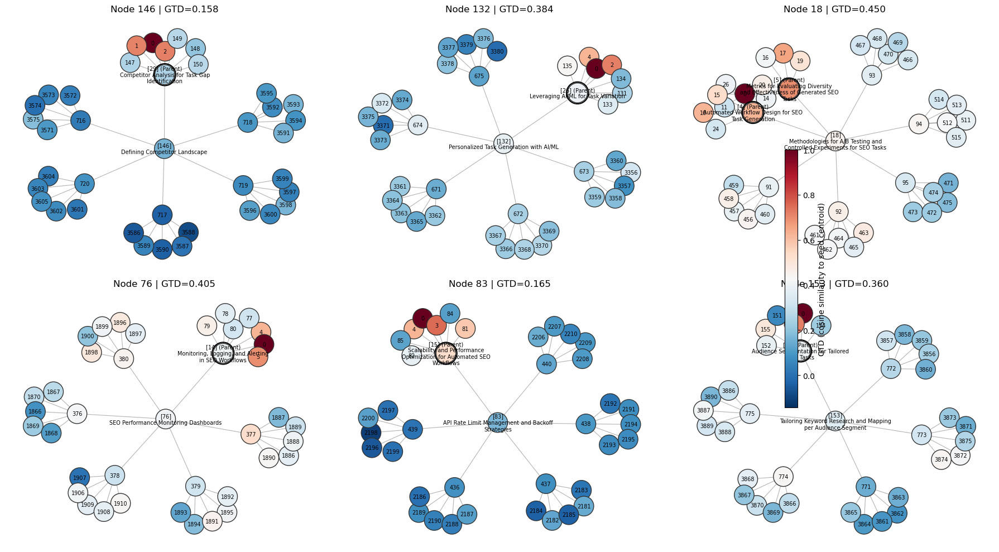

In [86]:
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
from textwrap import fill
import random
import math

# ---- CONFIG ----
DEPTH = 2
N_SAMPLES = 6
RADIUS = 2
# ----------------

# Get valid depth-2 nodes
depth2_nodes = [
    n for n in G_filt.nodes()
    if G_filt.nodes[n].get('depth') == DEPTH
    and node_metrics['gtd'].get(n) is not None
    and not np.isnan(node_metrics['gtd'].get(n))
]

if len(depth2_nodes) < N_SAMPLES:
    N_SAMPLES = len(depth2_nodes)

# Random new sample
sample_nodes = random.sample(depth2_nodes, N_SAMPLES)

# Global GTD range
all_gtd = [v for v in node_metrics['gtd'].values() if v is not None and not np.isnan(v)]
gmin, gmax = min(all_gtd), max(all_gtd)

# Grid setup
cols = 3
rows = math.ceil(N_SAMPLES / cols)
fig, axes = plt.subplots(rows, cols, figsize=(cols*6, rows*5))
axes = axes.flatten()

for i, node_id in enumerate(sample_nodes):
    ax = axes[i]
    
    H = nx.ego_graph(G_filt.to_undirected(), node_id, radius=RADIUS)
    pos = nx.spring_layout(H, seed=1)
    
    # GTD colors
    colors = [
        node_metrics['gtd'].get(n, 0.0)
        if node_metrics['gtd'].get(n) is not None else 0.0
        for n in H.nodes()
    ]
    
    nx.draw_networkx_edges(H, pos, alpha=0.3, width=0.8, ax=ax)
    
    node_collection = nx.draw_networkx_nodes(
        H, pos,
        node_color=colors,
        cmap=plt.cm.RdBu_r,
        vmin=gmin,
        vmax=gmax,
        node_size=650,
        edgecolors="#333333",
        ax=ax
    )
    
    # Parent(s)
    parents = G.nodes[node_id].get('parents') or []
    
    # Labels
    labels = {}
    for n in H.nodes():
        if n == node_id:
            topic = G_filt.nodes[n].get('topic', '').replace("\n", " ").strip()
            labels[n] = f"[{n}]\n{fill(topic, width=40)}"
        elif n in parents:
            topic = G_filt.nodes[n].get('topic', '').replace("\n", " ").strip()
            labels[n] = f"[{n}] (Parent)\n{fill(topic, width=35)}"
        else:
            labels[n] = str(n)
    
    nx.draw_networkx_labels(H, pos, labels=labels, font_size=7, ax=ax)
    
    # Highlight parent nodes
    for p in parents:
        if p in H.nodes():
            nx.draw_networkx_nodes(
                H, pos,
                nodelist=[p],
                node_size=800,
                node_color="none",
                edgecolors="black",
                linewidths=1.5,
                ax=ax
            )
    
    ax.set_title(f"Node {node_id} | GTD={node_metrics['gtd'][node_id]:.3f}")
    ax.axis("off")

# Hide unused axes
for j in range(i+1, len(axes)):
    axes[j].axis("off")

# Add global colorbar
cbar = fig.colorbar(node_collection, ax=axes.tolist(), shrink=0.6)
cbar.set_label("GTD (cosine similarity to seed centroid)")

plt.tight_layout()
plt.show()


## remove nodes with negative GTD

In [87]:
# Cell 1: second-pass filter: remove nodes with GTD < 0 (and their descendants) from existing G_filt
import copy
import networkx as nx

if 'G_filt' not in globals():
    raise RuntimeError("G_filt not found in the workspace. Make sure you have G_filt from the depth-1 GTD<0.25 filtering step.")

threshold_neg = 0.0

# copy G_filt so we keep it
G_filt2 = copy.deepcopy(G_filt)

# nodes in G_filt with negative GTD
neg_nodes = [n for n in G_filt2.nodes() if (node_metrics['gtd'].get(n) is not None and node_metrics['gtd'][n] < threshold_neg)]
print("Nodes with GTD < 0 in G_filt (count):", len(neg_nodes))

def gather_descendants_local(Gd, start):
    """Return set of start + all descendants using 'children' attr if present, else successors."""
    seen = set()
    stack = [start]
    while stack:
        u = stack.pop()
        if u in seen:
            continue
        seen.add(u)
        children = Gd.nodes[u].get('children') or list(Gd.successors(u))
        for c in children:
            if c not in seen:
                stack.append(c)
    return seen

# collect nodes to remove (only those present in G_filt2)
to_remove = set()
for n in neg_nodes:
    if n in G_filt2:
        desc = gather_descendants_local(G_filt2, n)
        to_remove.update(desc)

print("Total nodes to remove (including descendants):", len(to_remove))

# remove nodes
removed_count = 0
for n in list(to_remove):
    if n in G_filt2:
        G_filt2.remove_node(n)
        removed_count += 1

print(f"Removed {removed_count} nodes from G_filt -> resulting G_filt2 nodes:", G_filt2.number_of_nodes())


Nodes with GTD < 0 in G_filt (count): 132
Total nodes to remove (including descendants): 182
Removed 182 nodes from G_filt -> resulting G_filt2 nodes: 3412


Removed (neg GTD + descendants): 182
Counts: original G nodes: 3906 G_filt nodes: 3594 G_filt_neg nodes: 3412


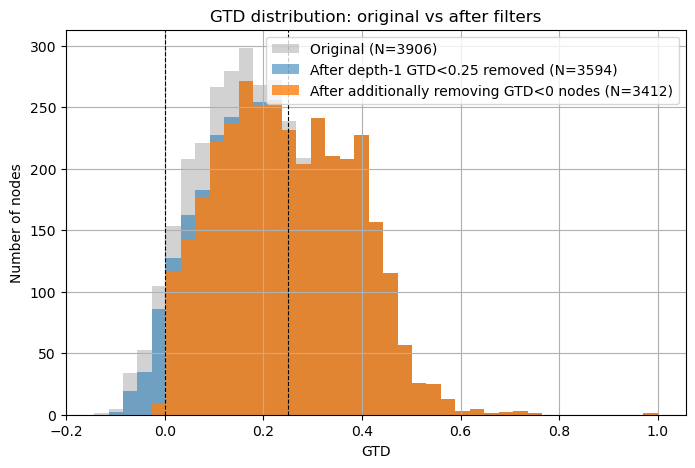

In [93]:
# Remove negative-GTD nodes (and their descendants) from existing G_filt, then plot histograms
import copy, networkx as nx, numpy as np, matplotlib.pyplot as plt

# make sure G_filt exists
if 'G_filt' not in globals():
    raise RuntimeError("G_filt not found. Run the depth-1 GTD<0.25 filtering first to obtain G_filt.")

# 1) build G_filt_neg by removing nodes with GTD < 0 and their descendants
G_filt_neg = copy.deepcopy(G_filt)

def gather_descendants_local(Gd, start):
    seen = set(); stack=[start]
    while stack:
        u = stack.pop()
        if u in seen: continue
        seen.add(u)
        children = Gd.nodes[u].get('children') or list(Gd.successors(u))
        for c in children:
            if c not in seen:
                stack.append(c)
    return seen

neg_nodes = [n for n in G_filt_neg.nodes() if (node_metrics['gtd'].get(n) is not None and node_metrics['gtd'][n] < 0)]
to_remove=set()
for n in neg_nodes:
    to_remove.update(gather_descendants_local(G_filt_neg, n))

# remove them
for n in list(to_remove):
    if n in G_filt_neg:
        G_filt_neg.remove_node(n)

print("Removed (neg GTD + descendants):", len(to_remove))
print("Counts: original G nodes:", G.number_of_nodes(),
      "G_filt nodes:", G_filt.number_of_nodes(),
      "G_filt_neg nodes:", G_filt_neg.number_of_nodes())

# 2) make GTD arrays for histograms (original, after depth-1 0.25 removal, after also removing neg+descendants)
gtd_original = np.array([v for v in node_metrics['gtd'].values() if v is not None and not np.isnan(v)])
gtd_after_025 = np.array([node_metrics['gtd'][n] for n in G_filt.nodes()
                          if node_metrics['gtd'].get(n) is not None and not np.isnan(node_metrics['gtd'].get(n))])
gtd_after_neg_desc = np.array([node_metrics['gtd'][n] for n in G_filt_neg.nodes()
                               if node_metrics['gtd'].get(n) is not None and not np.isnan(node_metrics['gtd'].get(n))])

# 3) plot (common bins)
bins = np.linspace(gtd_original.min(), gtd_original.max(), 40)
plt.figure(figsize=(8,5))
plt.hist(gtd_original, bins=bins, alpha=0.35, label=f"Original (N={len(gtd_original)})", color='gray')
plt.hist(gtd_after_025, bins=bins, alpha=0.55, label=f"After depth-1 GTD<0.25 removed (N={len(gtd_after_025)})", color='C0')
plt.hist(gtd_after_neg_desc, bins=bins, alpha=0.8, label=f"After additionally removing GTD<0 nodes (N={len(gtd_after_neg_desc)})", color='C1')
plt.axvline(0.25, linestyle='--', color='k', linewidth=0.8)
plt.axvline(0.0, linestyle='--', color='k', linewidth=0.8)
plt.xlabel("GTD"); plt.ylabel("Number of nodes")
plt.title("GTD distribution: original vs after filters")
plt.legend(); plt.grid(True); plt.show()



# calculating LTD

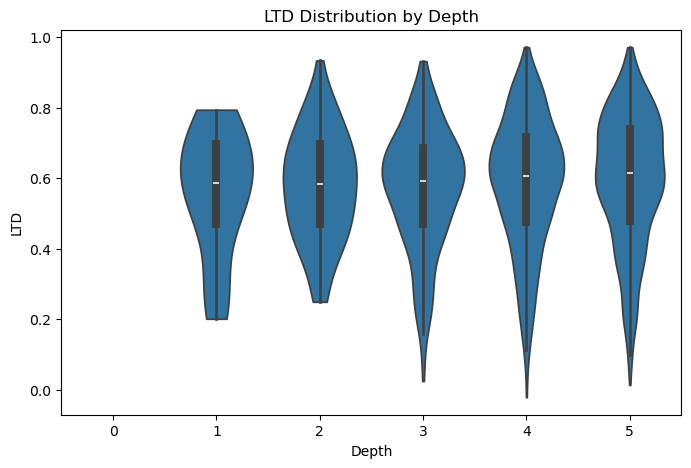

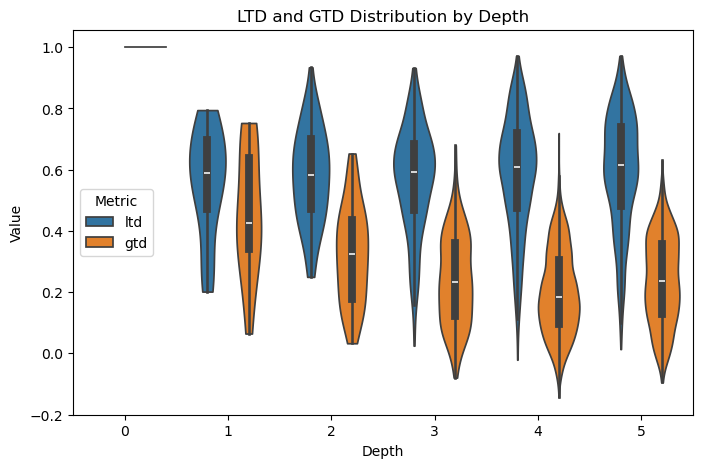

In [147]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8,5))
sns.violinplot(
    data=df,
    x='depth',
    y='ltd',
    cut=0
)

plt.title("LTD Distribution by Depth")
plt.xlabel("Depth")
plt.ylabel("LTD")
plt.show()

# Prepare long-form dataframe for seaborn
df_long = df.melt(
    id_vars=['depth'],
    value_vars=['ltd', 'gtd'],
    var_name='metric',
    value_name='value'
)

plt.figure(figsize=(8,5))

sns.violinplot(
    data=df_long,
    x='depth',
    y='value',
    hue='metric',
    cut=0,
    split=False
)

plt.title("LTD and GTD Distribution by Depth")
plt.xlabel("Depth")
plt.ylabel("Value")
plt.legend(title="Metric")
plt.show()

LTD range: -0.021 → 0.972


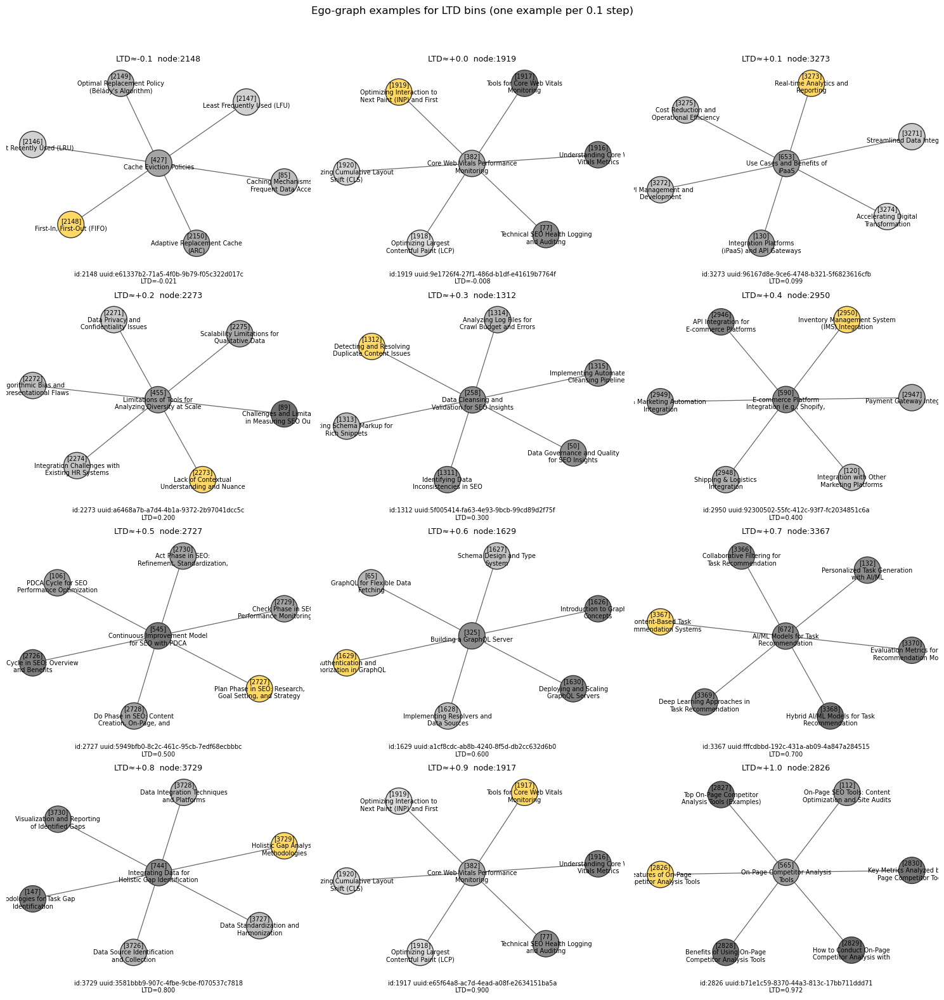


Chosen representatives (bin_center, node_id, ltd, uuid):
(-0.1, '2148', -0.020926177272005856, 'e61337b2-71a5-4f0b-9b79-f05c322d017c')
(0.0, '1919', -0.007861841767363752, '9e1726f4-27f1-486d-b1df-e41619b7764f')
(0.1, '3273', 0.09865908300534308, '96167d8e-9ce6-4748-b321-5f6823616cfb')
(0.20000000000000004, '2273', 0.20011266401810587, 'a6468a7b-a7d4-4b1a-9372-2b97041dcc5c')
(0.30000000000000004, '1312', 0.3001117017492029, '5f005414-fa63-4e93-9bcb-99cd89d2f75f')
(0.4, '2950', 0.40007454545619686, '92300502-55fc-412c-93f7-fc2034851c6a')
(0.5000000000000001, '2727', 0.4999942172428981, '5949bfb0-8c2c-461c-95cb-7edf68ecbbbc')
(0.6000000000000001, '1629', 0.5999293203144483, 'a1cf8cdc-ab8b-4240-8f5d-db2cc632d6b0')
(0.7000000000000001, '3367', 0.7000531900150389, 'fffcdbbd-192c-431a-ab09-4a847a284515')
(0.8, '3729', 0.800051909525164, '3581bbb9-907c-4fbe-9cbe-f070537c7818')
(0.9, '1917', 0.899678510624368, 'e65f64a8-ac7d-4ead-a08f-e2634151ba5a')
(1.0, '2826', 0.9717873485482638, 'b71e1c59

In [148]:
import math
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from textwrap import fill
from math import floor, ceil

# helper: short node label (re-uses your node_label)
def node_label(n, width=28, max_lines=2):
    topic = (G.nodes[n].get('topic') or "").replace("\n"," ").strip()
    if not topic:
        topic = G.nodes[n]['metadata'].get('uuid') or str(n)
    wrapped = fill(topic, width=width)
    lines = wrapped.splitlines()[:max_lines]
    return f"[{n}]\n" + ("\n".join(lines)).strip()

# prepare LTD values (drop NaNs)
ltd_series = df['ltd'].dropna()
if ltd_series.empty:
    raise RuntimeError("No valid LTD values present (all NaN). Compute LTD first.")

lmin = float(np.min(ltd_series))
lmax = float(np.max(ltd_series))
print(f"LTD range: {lmin:.3f} → {lmax:.3f}")

# create bins every 0.1 (centered bins)
step = 0.1
left = math.floor(lmin*10)/10.0
right = math.ceil(lmax*10)/10.0
bin_centers = np.arange(left, right + 1e-9, step)

# select representative node per bin: closest to bin center
rep_nodes = []
for c in bin_centers:
    candidates = df[~df['ltd'].isna()].copy()
    if candidates.empty:
        continue
    candidates['dist'] = (candidates['ltd'] - c).abs()
    best = candidates.loc[candidates['dist'].idxmin()]
    rep_nodes.append((c, str(best['node_id']), float(best['ltd']), best['uuid']))

if not rep_nodes:
    raise RuntimeError("No representative nodes found for LTD bins (unexpected).")

# plotting grid: determine rows/cols
n = len(rep_nodes)
cols = 3
rows = math.ceil(n / cols)
fig_w = cols * 5
fig_h = rows * 4

fig, axes = plt.subplots(rows, cols, figsize=(fig_w, fig_h))
axes = axes.flatten()

for i, (center, node_id, node_ltd, node_uuid) in enumerate(rep_nodes):
    ax = axes[i]
    inspect_node = node_id
    # ego graph (2-hop) — work with the graph's node-id types: ensure we cast back if needed
    # If your node ids are ints in G, convert the string back to int when present.
    try:
        inspect_node_cast = int(inspect_node) if inspect_node.isdigit() and (int(inspect_node) in G.nodes) else inspect_node
    except Exception:
        inspect_node_cast = inspect_node

    H = nx.ego_graph(G.to_undirected(), inspect_node_cast, radius=2)
    pos = nx.spring_layout(H, seed=1)

    # color inspected node by highlight and shade others by LTD if available
    node_colors = []
    for nnode in H.nodes:
        if nnode == inspect_node_cast:
            node_colors.append("#FFD966")
        else:
            val = node_metrics.get('ltd', {}).get(nnode, np.nan)
            # map ltd to greyscale for subtlety (nan -> light grey)
            if np.isnan(val):
                node_colors.append("#E6E6E6")
            else:
                # darker = higher drift
                grey = 220 - int(120 * min(max(val, 0.0), 1.0))
                grey = max(60, min(220, grey))
                node_colors.append(f"#{grey:02x}{grey:02x}{grey:02x}")

    nx.draw_networkx_nodes(H, pos, node_size=900, node_color=node_colors, edgecolors="#333333", ax=ax)
    nx.draw_networkx_edges(H, pos, width=0.9, alpha=0.6, ax=ax)

    labels = {n: node_label(n) for n in H.nodes}
    nx.draw_networkx_labels(H, pos, labels=labels, font_size=7, ax=ax)

    ax.set_title(f"LTD≈{center:+.1f}  node:{inspect_node}", fontsize=9)
    ax.axis('off')

    # caption with exact info
    caption = f"id:{inspect_node} uuid:{node_uuid}\nLTD={node_ltd:.3f}"
    ax.text(0.5, -0.12, caption, transform=ax.transAxes, ha='center', fontsize=7)

# hide unused axes
for j in range(i+1, len(axes)):
    axes[j].axis('off')

plt.suptitle("Ego-graph examples for LTD bins (one example per 0.1 step)", fontsize=12)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

# Print list of chosen representatives
print("\nChosen representatives (bin_center, node_id, ltd, uuid):")
for tup in rep_nodes:
    print(tup)


## Remove LTD < 0.25 for the whole graph

Step1: Removed depth-1 GTD<0.25: 312 nodes
Counts: orig: 3906 step1: 3594
Step2: Removed GTD<0.0: 182 nodes
Counts: step1: 3594 step2: 3412
Step3: Removed LTD<0.25: 391 nodes
Counts: step2: 3412 step3: 3021


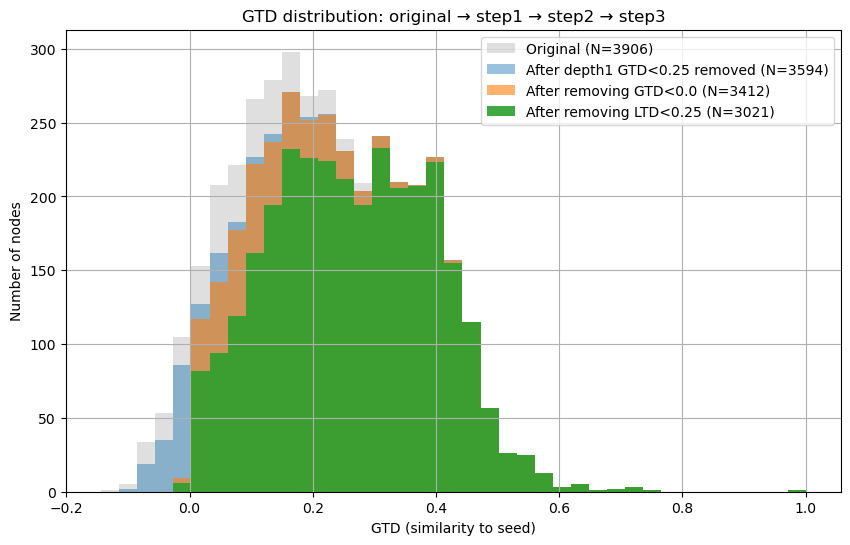

In [160]:
import copy
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt

# --- Safety checks ---
if 'G' not in globals():
    raise RuntimeError("G not found in globals.")
if 'node_metrics' not in globals():
    raise RuntimeError("node_metrics not found in globals.")

# helper: gather descendants using 'children' attribute if available, else successors()
def gather_descendants_local(Gd, start):
    if start not in Gd:
        return set()

    seen = set()
    stack = [start]
    while stack:
        u = stack.pop()
        if u not in Gd or u in seen:
            continue
        seen.add(u)

        children = Gd.nodes[u].get('children') or (
            list(Gd.successors(u)) if Gd.is_directed() else list(Gd.neighbors(u))
        )

        for c in children:
            if c not in seen:
                stack.append(c)

    return seen

# Start from original graph
G_orig = copy.deepcopy(G)

# Step 1: remove depth-1 nodes with GTD < 0.25 and their descendants
G_step1 = copy.deepcopy(G_orig)
THRESH_DEPTH1_GTD = 0.25

# find nodes at depth == 1 with GTD < threshold
depth1_nodes = [n for n in G_step1.nodes()
                if G_step1.nodes[n].get('depth') == 1
                and (node_metrics['gtd'].get(n) is not None)
                and (not np.isnan(node_metrics['gtd'][n]))
                and node_metrics['gtd'][n] < THRESH_DEPTH1_GTD]

to_remove_1 = set()
for n in depth1_nodes:
    to_remove_1.update(gather_descendants_local(G_step1, n))

for n in list(to_remove_1):
    if n in G_step1:
        G_step1.remove_node(n)

print(f"Step1: Removed depth-1 GTD<{THRESH_DEPTH1_GTD}: {len(to_remove_1)} nodes")
print("Counts: orig:", G_orig.number_of_nodes(), "step1:", G_step1.number_of_nodes())

# Step 2: from G_step1, remove all nodes with GTD < 0 and their descendants
G_step2 = copy.deepcopy(G_step1)
THRESH_GTD_NEG = 0.0

gtd_neg_nodes = [n for n in G_step2.nodes()
                 if (node_metrics['gtd'].get(n) is not None)
                 and (not np.isnan(node_metrics['gtd'][n]))
                 and node_metrics['gtd'][n] < THRESH_GTD_NEG]

to_remove_2 = set()
for n in gtd_neg_nodes:
    to_remove_2.update(gather_descendants_local(G_step2, n))

for n in list(to_remove_2):
    if n in G_step2:
        G_step2.remove_node(n)

print(f"Step2: Removed GTD<{THRESH_GTD_NEG}: {len(to_remove_2)} nodes")
print("Counts: step1:", G_step1.number_of_nodes(), "step2:", G_step2.number_of_nodes())

# Step 3: from G_step2, remove nodes with LTD < 0.25 and their descendants
# NOTE: This removes nodes that are close to their parent (low local drift). If you meant the opposite (high drift),
# change the comparison to node_metrics['ltd'][n] > LTD_THRESH.
G_step3 = copy.deepcopy(G_step2)
LTD_THRESH = 0.25

ltd_candidates = [n for n in G_step3.nodes()
                  if (node_metrics.get('ltd', {}).get(n) is not None)
                  and (not np.isnan(node_metrics['ltd'][n]))
                  and node_metrics['ltd'][n] < LTD_THRESH]

to_remove_3 = set()
for n in ltd_candidates:
    to_remove_3.update(gather_descendants_local(G_step3, n))

for n in list(to_remove_3):
    if n in G_step3:
        G_step3.remove_node(n)

print(f"Step3: Removed LTD<{LTD_THRESH}: {len(to_remove_3)} nodes")
print("Counts: step2:", G_step2.number_of_nodes(), "step3:", G_step3.number_of_nodes())

# --- Prepare GTD arrays for histogram plotting ---
def gtd_array_for_graph(Ggraph):
    vals = []
    for n in Ggraph.nodes():
        v = node_metrics['gtd'].get(n)
        if v is not None and not np.isnan(v):
            vals.append(v)
    return np.array(vals)

gtd_original = gtd_array_for_graph(G_orig)
gtd_after_step1 = gtd_array_for_graph(G_step1)
gtd_after_step2 = gtd_array_for_graph(G_step2)
gtd_after_step3 = gtd_array_for_graph(G_step3)

# safety: ensure we have some GTD values
if gtd_original.size == 0:
    raise RuntimeError("No GTD values available in node_metrics to plot.")

# common bins
bins = np.linspace(gtd_original.min(), gtd_original.max(), 40)

plt.figure(figsize=(10,6))
plt.hist(gtd_original, bins=bins, alpha=0.25, label=f"Original (N={len(gtd_original)})", color='gray')
plt.hist(gtd_after_step1, bins=bins, alpha=0.45, label=f"After depth1 GTD<{THRESH_DEPTH1_GTD} removed (N={len(gtd_after_step1)})", color='C0')
plt.hist(gtd_after_step2, bins=bins, alpha=0.6, label=f"After removing GTD<{THRESH_GTD_NEG} (N={len(gtd_after_step2)})", color='C1')
plt.hist(gtd_after_step3, bins=bins, alpha=0.9, label=f"After removing LTD<{LTD_THRESH} (N={len(gtd_after_step3)})", color='C2')


plt.xlabel("GTD (similarity to seed)")
plt.ylabel("Number of nodes")
plt.title("GTD distribution: original → step1 → step2 → step3")
plt.legend()
plt.grid(True)
plt.show()



In [162]:
from pyvis.network import Network

# Create interactive visualization for limited depth
MAX_DEPTH_INTERACTIVE = 3
subgraph_nodes = [n for n in G_step3.nodes() if G_step3.nodes[n]['depth'] <= MAX_DEPTH_INTERACTIVE]
subG = G_step3.subgraph(subgraph_nodes)

net = Network(height="800px", width="100%", notebook=True, directed=True)
net.barnes_hut()  # Use Barnes-Hut physics for better layout

# Add nodes with hover tooltips
for node in subG.nodes():
    topic = G_step3.nodes[node]['topic']
    depth = G_step3.nodes[node]['depth']
    net.add_node(node, 
                 label=f"{node}",
                 title=f"Depth {depth}: {topic}",
                 level=depth)  # Use depth for hierarchical layout

# Add edges
for u, v in subG.edges():
    net.add_edge(u, v)

# Set hierarchical layout
net.set_options("""
{
  "layout": {
    "hierarchical": {
      "enabled": true,
      "direction": "UD",
      "sortMethod": "directed"
    }
  },
  "physics": {
    "hierarchicalRepulsion": {
      "centralGravity": 0.0
    }
  }
}
""")

net.show("dataforseo_dag_3filt_interactive.html")
print(f"Interactive visualization saved to dataforseo_dag_3filt_interactive.html")

dataforseo_dag_3filt_interactive.html
Interactive visualization saved to dataforseo_dag_3filt_interactive.html


In [164]:
from pyvis.network import Network

# Create interactive visualization for limited depth
MAX_DEPTH_INTERACTIVE = 3
subgraph_nodes = [n for n in G.nodes() if G.nodes[n]['depth'] <= MAX_DEPTH_INTERACTIVE]
subG = G.subgraph(subgraph_nodes)

net = Network(height="800px", width="100%", notebook=True, directed=True)
net.barnes_hut()  # Use Barnes-Hut physics for better layout

# Add nodes with hover tooltips
for node in subG.nodes():
    topic = G.nodes[node]['topic']
    depth = G.nodes[node]['depth']
    net.add_node(node, 
                 label=f"{node}",
                 title=f"Depth {depth}: {topic}",
                 level=depth)  # Use depth for hierarchical layout

# Add edges
for u, v in subG.edges():
    net.add_edge(u, v)

# Set hierarchical layout
net.set_options("""
{
  "layout": {
    "hierarchical": {
      "enabled": true,
      "direction": "UD",
      "sortMethod": "directed"
    }
  },
  "physics": {
    "hierarchicalRepulsion": {
      "centralGravity": 0.0
    }
  }
}
""")

net.show("dataforseo_dag_interactive.html")
print(f"Interactive visualization saved to dataforseo_dag_interactive.html")

dataforseo_dag_interactive.html
Interactive visualization saved to dataforseo_dag_interactive.html


# Workflow including GTD & LTD filtering

In [197]:
"""
simple_gtd_ltd_workflow.py

Minimal workflow:
- load JSON -> networkx DiGraph
- compute GTD (cosine to seed) and LTD (max cosine to parents)
- flag & filter nodes using thresholds
- save filtered graph to JSON
"""

import json
import copy
import math
from typing import Any, Dict, Tuple, List
import numpy as np
import networkx as nx

# --------------------
# Utility functions
# --------------------
def safe_cosine_sim(a, b, eps=1e-12):
    a = np.asarray(a, dtype=float)
    b = np.asarray(b, dtype=float)
    na = np.linalg.norm(a)
    nb = np.linalg.norm(b)
    if na < eps or nb < eps:
        return 0.0
    return float(np.dot(a, b) / (na * nb))

def gather_descendants_local(Gd: nx.DiGraph, start) -> set:
    """Return set of descendants (including start). Defensive: returns empty set if start not in Gd."""
    if start not in Gd:
        return set()
    seen = set()
    stack = [start]
    while stack:
        u = stack.pop()
        if u in seen:
            continue
        if u not in Gd:
            continue
        seen.add(u)
        children = Gd.nodes[u].get('children') or (list(Gd.successors(u)) if Gd.is_directed() else list(Gd.neighbors(u)))
        for c in children:
            if c not in seen:
                stack.append(c)
    return seen

import json
import networkx as nx
from collections import deque

import json
import networkx as nx
from collections import deque

def load_graph_from_json(path):
    """
    Load JSON (mapping node_id -> node_data) into a networkx.DiGraph.
    Ensures nodes have 'parents' and 'children' attrs, edges are added,
    and 'depth' is computed by BFS from roots.
    Returns (G, raw_json).
    """
    with open(path, 'r', encoding='utf-8') as fh:
        data = json.load(fh)

    nodes = data.get('nodes', {})
    G = nx.DiGraph()

    # --- add nodes with provided attrs (coerce ids to strings) ---
    for node_id, nd in nodes.items():
        key = str(node_id)
        attrs = {
            'topic': (nd.get('topic', '') or '').strip(),
            'metadata': nd.get('metadata', {}) or {},
            'parents': [str(p) for p in nd.get('parents', [])] if nd.get('parents') is not None else [],
            'children': [str(c) for c in nd.get('children', [])] if nd.get('children') is not None else []
        }
        # preserve embedding if present
        if 'embedding' in nd:
            attrs['embedding'] = nd['embedding']
        G.add_node(key, **attrs)

    # --- Add edges based on children lists (prefer children as source of truth) ---
    for n in list(G.nodes):
        for c in G.nodes[n].get('children', []):
            if c not in G:
                # create minimal node if child missing in JSON
                G.add_node(c, topic='', metadata={}, parents=[], children=[])
            G.add_edge(n, c)

    # --- If some nodes list parents but no corresponding edge exists, add them ---
    for n in list(G.nodes):
        for p in G.nodes[n].get('parents', []):
            if p not in G:
                G.add_node(p, topic='', metadata={}, parents=[], children=[])
            if not G.has_edge(p, n):
                G.add_edge(p, n)

    # --- Recompute consistent parents/children attributes from edges (authoritative) ---
    for n in list(G.nodes):
        G.nodes[n]['children'] = [str(c) for c in G.successors(n)]
        G.nodes[n]['parents']  = [str(p) for p in G.predecessors(n)]

    # --- Compute depth via BFS from all roots (in_degree == 0) ---
    roots = [n for n in G.nodes if G.in_degree(n) == 0]
    if not roots:
        # fallback: if JSON contains a root_id, try it; otherwise use first node
        rid = data.get('root_id')
        if rid is not None and str(rid) in G.nodes:
            roots = [str(rid)]
        else:
            first = next(iter(G.nodes), None)
            roots = [first] if first is not None else []

    # initialize depths
    for n in G.nodes:
        G.nodes[n].pop('depth', None)

    for root in roots:
        G.nodes[root]['depth'] = 0
        queue = deque([root])
        while queue:
            cur = queue.popleft()
            cur_depth = G.nodes[cur].get('depth', 0)
            for child in G.successors(cur):
                # only set depth once (first encounter)
                if 'depth' not in G.nodes[child]:
                    G.nodes[child]['depth'] = cur_depth + 1
                    queue.append(child)

    return G



def save_graph_to_json(G: nx.DiGraph, path: str):
    nodes_out = []
    for n in G.nodes():
        attrs = dict(G.nodes[n])
        for k, v in list(attrs.items()):
            if isinstance(v, np.ndarray):
                attrs[k] = v.tolist()
            # numpy scalars -> python floats
            if isinstance(v, (np.floating, np.integer)):
                attrs[k] = float(v)
        nodes_out.append({"id": n, **attrs})
    edges_out = [[u, v] for u, v in G.edges()]
    out = {"nodes": nodes_out, "edges": edges_out}
    with open(path, "w", encoding="utf-8") as f:
        json.dump(out, f, indent=2)

# --------------------
# Embedding computation
# --------------------
def compute_embeddings(G: nx.DiGraph, model_name: str = "all-MiniLM-L6-v2"):
    """
    Compute embeddings for nodes missing 'embedding' using SentenceTransformer.
    Stores embeddings in G.nodes[n]['embedding'] as numpy arrays (unit-normalized).
    Returns (G, model_instance).
    """
    try:
        from sentence_transformers import SentenceTransformer
    except Exception as e:
        raise RuntimeError("sentence-transformers is required for compute_embeddings. "
                           "Install with `pip install sentence-transformers`. Original error: " + str(e))

    node_list = list(G.nodes())
    # build texts: prefer topic, then metadata.title, then uuid or node id
    texts = []
    for n in node_list:
        topic = (G.nodes[n].get('topic') or "").strip()
        if topic:
            texts.append(topic)
            continue
        title = G.nodes[n].get('metadata', {}).get('title', '')
        if title:
            texts.append(title)
            continue
        uid = G.nodes[n].get('metadata', {}).get('uuid')
        texts.append(uid if uid is not None else str(n))

    # detect which nodes need embeddings
    need_idx = [i for i, n in enumerate(node_list) if 'embedding' not in G.nodes[n] or G.nodes[n]['embedding'] is None]

    if not need_idx:
        # nothing to do; ensure embeddings are numpy arrays
        for n in node_list:
            emb = G.nodes[n].get('embedding')
            if emb is not None and not isinstance(emb, np.ndarray):
                G.nodes[n]['embedding'] = np.asarray(emb, dtype=float)
        return G, None

    model = SentenceTransformer(model_name)
    # only encode texts for nodes that need embeddings (faster)
    texts_to_encode = [texts[i] for i in need_idx]
    embeddings = model.encode(texts_to_encode, show_progress_bar=True, convert_to_numpy=True, normalize_embeddings=True)

    # insert embeddings back to graph
    for j, i in enumerate(need_idx):
        n = node_list[i]
        emb = embeddings[j]
        # ensure python float array
        G.nodes[n]['embedding'] = np.asarray(emb, dtype=float)

    # ensure any existing embeddings are numpy arrays
    for n in node_list:
        emb = G.nodes[n].get('embedding')
        if emb is not None and not isinstance(emb, np.ndarray):
            G.nodes[n]['embedding'] = np.asarray(emb, dtype=float)

    return G, model


# --------------------
# Metrics (only GTD and LTD)
# --------------------
def compute_gtd_ltd(G: nx.DiGraph, seed_centroid: Any = None) -> Dict[str, Dict]:
    """
    Compute per-node GTD and LTD.
    GTD: cosine similarity to seed_centroid (seed can be a node id in G or a raw vector).
    LTD: max cosine similarity to any parent (NaN if no parents).
    Returns dict: {'gtd': {node:val}, 'ltd': {node:val}}
    """
    # resolve seed vector
    resolved_seed = None
    if seed_centroid is None:
        # try node '0' then first node
        if '0' in G.nodes:
            resolved_seed = G.nodes['0'].get('embedding')
        else:
            first = next(iter(G.nodes), None)
            if first is not None:
                resolved_seed = G.nodes[first].get('embedding')
    else:
        if (isinstance(seed_centroid, (str, int))) and (seed_centroid in G.nodes):
            resolved_seed = G.nodes[seed_centroid].get('embedding')
        else:
            try:
                resolved_seed = np.asarray(seed_centroid, dtype=float)
            except Exception:
                resolved_seed = None

    node_list = list(G.nodes)
    emb_map = {n: (np.asarray(G.nodes[n].get('embedding'), dtype=float) if G.nodes[n].get('embedding') is not None else None)
               for n in node_list}

    gtd = {}
    ltd = {}
    for n in node_list:
        # GTD
        if resolved_seed is not None and emb_map[n] is not None:
            gtd[n] = safe_cosine_sim(emb_map[n], resolved_seed)
        else:
            gtd[n] = float('nan')

        # LTD = max similarity to parents (no 1 - ...)
        parents = G.nodes[n].get('parents', []) or []
        if not parents:
            ltd[n] = float('nan')
        else:
            parent_sims = []
            for p in parents:
                if p in emb_map and emb_map[p] is not None and emb_map[n] is not None:
                    parent_sims.append(safe_cosine_sim(emb_map[n], emb_map[p]))
            if parent_sims:
                ltd[n] = float(np.max(parent_sims))
            else:
                ltd[n] = float('nan')
    return {"gtd": gtd, "ltd": ltd}

# --------------------
# Flagging (simple)
# --------------------
DEFAULT_THRESHOLDS = {
    "depth1_gtd": 0.25,   # remove depth-1 nodes with GTD < this
    "gtd_neg": 0.0,       # remove nodes with GTD < this
    "ltd": 0.25           # remove nodes with LTD < this (insufficient parent similarity)
}

from typing import Dict, List
import math
from textwrap import shorten

def flag_nodes_simple(
    G: nx.DiGraph,
    metrics: Dict[str, Dict],
    thresholds: Dict = None,
    max_parents: int = 3,
    max_children: int = 3,
    text_width: int = 80
) -> List[Dict]:
    """
    Return list of flagged nodes with:
    - GTD/LTD values
    - reasons
    - node topic
    - parent info
    - sample child info
    """

    thresholds = thresholds or DEFAULT_THRESHOLDS
    flagged = []

    for n in G.nodes():
        reasons = []
        g = metrics['gtd'].get(n)
        l = metrics['ltd'].get(n)

        # --- threshold logic ---
        if (G.nodes[n].get('depth') == 1) and (g is not None) and (not math.isnan(g)) and g < thresholds['depth1_gtd']:
            reasons.append("DEPTH1_LOW_GTD")

        if (g is not None) and (not math.isnan(g)) and g < thresholds['gtd_neg']:
            reasons.append("GTD_NEGATIVE")

        if (l is not None) and (not math.isnan(l)) and l < thresholds['ltd']:
            reasons.append("LOW_LTD")

        if not reasons:
            continue

        # --- content info ---
        topic = (G.nodes[n].get('topic') or "").strip()
        topic_short = shorten(topic, width=text_width) if topic else ""

        parents = list(G.predecessors(n))
        children = list(G.successors(n))

        parent_ids = parents[:max_parents]
        child_ids = children[:max_children]

        parent_topics = []
        for p in parent_ids:
            pt = (G.nodes[p].get('topic') or "").strip()
            parent_topics.append(shorten(pt, width=text_width))

        child_topics = []
        for c in child_ids:
            ct = (G.nodes[c].get('topic') or "").strip()
            child_topics.append(shorten(ct, width=text_width))

        flagged.append({
            "node_id": n,
            "depth": G.nodes[n].get('depth'),
            "reasons": reasons,
            "gtd": None if g is None or math.isnan(g) else float(g),
            "ltd": None if l is None or math.isnan(l) else float(l),
            "topic": topic_short,
            "parent_ids": parent_ids,
            "parent_topics": parent_topics,
            # "child_ids": child_ids,
            # "child_topics": child_topics,
            # "num_children": len(children)
        })

    return flagged


# --------------------
# Filter pipeline
# --------------------
def filter_graph_pipeline_simple(G_in: nx.DiGraph, metrics: Dict[str, Dict], thresholds: Dict = None, verbose: bool = True) -> Tuple[nx.DiGraph, Dict]:
    thresholds = thresholds or DEFAULT_THRESHOLDS
    G0 = copy.deepcopy(G_in)
    stats = {}

    # helper returns candidates that still exist in graph
    def _current_nodes_with_pred(Gcur, pred):
        return [n for n in list(Gcur.nodes()) if pred(n)]

    # Step 1: depth-1 GTD
    G1 = copy.deepcopy(G0)
    depth1_bad = [n for n in list(G1.nodes)
                  if G1.nodes[n].get('depth') == 1
                  and (metrics['gtd'].get(n) is not None)
                  and (not math.isnan(metrics['gtd'][n]))
                  and metrics['gtd'][n] < thresholds['depth1_gtd']]
    rem1 = set()
    for n in depth1_bad:
        if n in G1:
            rem1.update(gather_descendants_local(G1, n))
    for u in list(rem1):
        if u in G1:
            G1.remove_node(u)
    stats['step1_removed'] = len(rem1)

    # Step 2: GTD < gtd_neg (on current graph)
    G2 = copy.deepcopy(G1)
    gtd_neg_nodes = [n for n in list(G2.nodes)
                     if (metrics['gtd'].get(n) is not None)
                     and (not math.isnan(metrics['gtd'][n]))
                     and metrics['gtd'][n] < thresholds['gtd_neg']]
    rem2 = set()
    for n in gtd_neg_nodes:
        if n in G2:
            rem2.update(gather_descendants_local(G2, n))
    for u in list(rem2):
        if u in G2:
            G2.remove_node(u)
    stats['step2_removed'] = len(rem2)

    # Step 3: LTD < ltd_thresh (on current graph) — LTD is similarity to parent
    G3 = copy.deepcopy(G2)
    ltd_nodes = [n for n in list(G3.nodes)
                 if (metrics['ltd'].get(n) is not None)
                 and (not math.isnan(metrics['ltd'][n]))
                 and metrics['ltd'][n] < thresholds['ltd']]
    rem3 = set()
    for n in ltd_nodes:
        if n in G3:
            rem3.update(gather_descendants_local(G3, n))
    for u in list(rem3):
        if u in G3:
            G3.remove_node(u)
    stats['step3_removed'] = len(rem3)

    stats['counts'] = {
        "orig": G0.number_of_nodes(),
        "after_step1": G1.number_of_nodes(),
        "after_step2": G2.number_of_nodes(),
        "after_step3": G3.number_of_nodes()
    }
    if verbose:
        print("Filter pipeline summary:", stats)
    return G3, stats

# --------------------
# Orchestration
# --------------------
def run_simple_workflow(input_json_path: str,
                        output_json_path: str,
                        model_name: str = "all-MiniLM-L6-v2",
                        seed_centroid: Any = "0",
                        thresholds: Dict = None,
                        save_filtered_graph: bool = True) -> Dict:
    thresholds = thresholds or DEFAULT_THRESHOLDS
    G = load_graph_from_json(input_json_path)

    # compute embeddings if needed
    G, model = compute_embeddings(G, model_name=model_name)
        
    metrics = compute_gtd_ltd(G, seed_centroid=seed_centroid)

    flagged = flag_nodes_simple(G, metrics, thresholds=thresholds)
    G_filtered, stats = filter_graph_pipeline_simple(G, metrics, thresholds=thresholds, verbose=True)
    if save_filtered_graph:
        save_graph_to_json(G_filtered, output_json_path)
    return {
        "G": G,
        "metrics": metrics,
        "flagged": flagged,
        "G_filtered": G_filtered,
        "stats": stats
    }




In [198]:
result = run_simple_workflow('seo-graph-10tools-single-5depth.json', "seo-graph-10tools-single-5depth-3filt.json", 
                             thresholds={"depth1_gtd":0.25, "gtd_neg":0.0, "ltd":0.25})
print(result['stats'])
print(result['flagged'][:10])

Batches:   0%|          | 0/123 [00:00<?, ?it/s]

Filter pipeline summary: {'step1_removed': 312, 'step2_removed': 182, 'step3_removed': 391, 'counts': {'orig': 3906, 'after_step1': 3594, 'after_step2': 3412, 'after_step3': 3021}}
{'step1_removed': 312, 'step2_removed': 182, 'step3_removed': 391, 'counts': {'orig': 3906, 'after_step1': 3594, 'after_step2': 3412, 'after_step3': 3021}}
[{'node_id': '12', 'depth': 1, 'reasons': ['DEPTH1_LOW_GTD', 'LOW_LTD'], 'gtd': 0.0645561726803952, 'ltd': 0.20160453426164104, 'topic': 'API Integration and Data Exchange Protocols', 'parent_ids': ['0', '1', '3'], 'parent_topics': ['Generate diverse SEO tasks using 10 core tools calling a single tool', 'Identifying and Categorizing the 10 Core SEO Tools', 'Architecting a Single Tool for Multi-Tool SEO Integration']}, {'node_id': '13', 'depth': 1, 'reasons': ['DEPTH1_LOW_GTD'], 'gtd': 0.19143350550228808, 'ltd': 0.2989048672319507, 'topic': 'Automated Decision-Making and Logic Branching', 'parent_ids': ['0', '2', '4'], 'parent_topics': ['Generate diverse 

## workflow that saves report

In [207]:
# Full minimal workflow with preservation & separate report
import json
import copy
import math
from typing import Any, Dict, Tuple, List
from collections import deque, defaultdict

import numpy as np
import networkx as nx
from textwrap import shorten

# --------------------
# Utility functions (unchanged)
# --------------------
def safe_cosine_sim(a, b, eps=1e-12):
    a = np.asarray(a, dtype=float)
    b = np.asarray(b, dtype=float)
    na = np.linalg.norm(a)
    nb = np.linalg.norm(b)
    if na < eps or nb < eps:
        return 0.0
    return float(np.dot(a, b) / (na * nb))

def gather_descendants_local(Gd: nx.DiGraph, start) -> set:
    """Return set of descendants (including start). Defensive: returns empty set if start not in Gd."""
    if start not in Gd:
        return set()
    seen = set()
    stack = [start]
    while stack:
        u = stack.pop()
        if u in seen:
            continue
        if u not in Gd:
            continue
        seen.add(u)
        children = Gd.nodes[u].get('children') or (list(Gd.successors(u)) if Gd.is_directed() else list(Gd.neighbors(u)))
        for c in children:
            if c not in seen:
                stack.append(c)
    return seen

def gather_descendants_local_defensive(Gd, start):
    """Safer alias used in several places."""
    if start not in Gd:
        return set()
    seen = set(); stack=[start]
    while stack:
        u = stack.pop()
        if u in seen: continue
        if u not in Gd: continue
        seen.add(u)
        children = Gd.nodes[u].get('children') or list(Gd.successors(u))
        for c in children:
            if c not in seen:
                stack.append(c)
    return seen

# --------------------
# Loader (your version) - returns G and raw JSON
# --------------------
def load_graph_from_json(path):
    """
    Load JSON (mapping node_id -> node_data) into a networkx.DiGraph.
    Ensures nodes have 'parents' and 'children' attrs, edges are added,
    and 'depth' is computed by BFS from roots.
    Returns (G, raw_json).
    """
    with open(path, 'r', encoding='utf-8') as fh:
        data = json.load(fh)

    nodes = data.get('nodes', {})
    G = nx.DiGraph()

    # --- add nodes with provided attrs (coerce ids to strings) ---
    for node_id, nd in nodes.items():
        key = str(node_id)
        attrs = {
            'topic': (nd.get('topic', '') or '').strip(),
            'metadata': nd.get('metadata', {}) or {},
            'parents': [str(p) for p in nd.get('parents', [])] if nd.get('parents') is not None else [],
            'children': [str(c) for c in nd.get('children', [])] if nd.get('children') is not None else []
        }
        # preserve embedding if present
        if 'embedding' in nd:
            attrs['embedding'] = nd['embedding']
        G.add_node(key, **attrs)

    # --- Add edges based on children lists (prefer children as source of truth) ---
    for n in list(G.nodes):
        for c in G.nodes[n].get('children', []):
            if c not in G:
                # create minimal node if child missing in JSON
                G.add_node(c, topic='', metadata={}, parents=[], children=[])
            G.add_edge(n, c)

    # --- If some nodes list parents but no corresponding edge exists, add them ---
    for n in list(G.nodes):
        for p in G.nodes[n].get('parents', []):
            if p not in G:
                G.add_node(p, topic='', metadata={}, parents=[], children=[])
            if not G.has_edge(p, n):
                G.add_edge(p, n)

    # --- Recompute consistent parents/children attributes from edges (authoritative) ---
    for n in list(G.nodes):
        G.nodes[n]['children'] = [str(c) for c in G.successors(n)]
        G.nodes[n]['parents']  = [str(p) for p in G.predecessors(n)]

    # --- Compute depth via BFS from all roots (in_degree == 0) ---
    roots = [n for n in G.nodes if G.in_degree(n) == 0]
    if not roots:
        # fallback: if JSON contains a root_id, try it; otherwise use first node
        rid = data.get('root_id')
        if rid is not None and str(rid) in G.nodes:
            roots = [str(rid)]
        else:
            first = next(iter(G.nodes), None)
            roots = [first] if first is not None else []

    # initialize depths
    for n in G.nodes:
        G.nodes[n].pop('depth', None)

    for root in roots:
        G.nodes[root]['depth'] = 0
        queue = deque([root])
        while queue:
            cur = queue.popleft()
            cur_depth = G.nodes[cur].get('depth', 0)
            for child in G.successors(cur):
                # only set depth once (first encounter)
                if 'depth' not in G.nodes[child]:
                    G.nodes[child]['depth'] = cur_depth + 1
                    queue.append(child)

    return G, data

# --------------------
# Embedding computation (unchanged)
# --------------------
def compute_embeddings(G: nx.DiGraph, model_name: str = "all-MiniLM-L6-v2"):
    """
    Compute embeddings for nodes missing 'embedding' using SentenceTransformer.
    Stores embeddings in G.nodes[n]['embedding'] as numpy arrays (unit-normalized).
    Returns (G, model_instance).
    """
    try:
        from sentence_transformers import SentenceTransformer
    except Exception as e:
        raise RuntimeError("sentence-transformers is required for compute_embeddings. "
                           "Install with `pip install sentence-transformers`. Original error: " + str(e))

    node_list = list(G.nodes())
    # build texts: prefer topic, then metadata.title, then uuid or node id
    texts = []
    for n in node_list:
        topic = (G.nodes[n].get('topic') or "").strip()
        if topic:
            texts.append(topic)
            continue
        title = G.nodes[n].get('metadata', {}).get('title', '')
        if title:
            texts.append(title)
            continue
        uid = G.nodes[n].get('metadata', {}).get('uuid')
        texts.append(uid if uid is not None else str(n))

    # detect which nodes need embeddings
    need_idx = [i for i, n in enumerate(node_list) if 'embedding' not in G.nodes[n] or G.nodes[n]['embedding'] is None]

    if not need_idx:
        # nothing to do; ensure embeddings are numpy arrays
        for n in node_list:
            emb = G.nodes[n].get('embedding')
            if emb is not None and not isinstance(emb, np.ndarray):
                G.nodes[n]['embedding'] = np.asarray(emb, dtype=float)
        return G, None

    model = SentenceTransformer(model_name)
    # only encode texts for nodes that need embeddings (faster)
    texts_to_encode = [texts[i] for i in need_idx]
    embeddings = model.encode(texts_to_encode, show_progress_bar=True, convert_to_numpy=True, normalize_embeddings=True)

    # insert embeddings back to graph
    for j, i in enumerate(need_idx):
        n = node_list[i]
        emb = embeddings[j]
        # ensure python float array
        G.nodes[n]['embedding'] = np.asarray(emb, dtype=float)

    # ensure any existing embeddings are numpy arrays
    for n in node_list:
        emb = G.nodes[n].get('embedding')
        if emb is not None and not isinstance(emb, np.ndarray):
            G.nodes[n]['embedding'] = np.asarray(emb, dtype=float)

    return G, model

# --------------------
# Metrics (only GTD and LTD)
# --------------------
def compute_gtd_ltd(G: nx.DiGraph, seed_centroid: Any = None, raw_json: Dict = None) -> Dict[str, Dict]:
    """
    Compute per-node GTD and LTD.
    GTD: cosine similarity to seed_centroid (seed can be a node id in G or a raw vector).
    LTD: max cosine similarity to any parent (NaN if no parents).
    Returns dict: {'gtd': {node:val}, 'ltd': {node:val}}
    """
    # resolve seed vector
    resolved_seed = None
    if seed_centroid is None:
        # prefer raw_json root_id if present
        if raw_json is not None and raw_json.get('root_id') is not None:
            rid = str(raw_json['root_id'])
            if rid in G.nodes and 'embedding' in G.nodes[rid]:
                resolved_seed = G.nodes[rid].get('embedding')
        if resolved_seed is None and '0' in G.nodes:
            resolved_seed = G.nodes['0'].get('embedding')
        else:
            first = next(iter(G.nodes), None)
            if first is not None:
                resolved_seed = G.nodes[first].get('embedding')
    else:
        if (isinstance(seed_centroid, (str, int))) and (seed_centroid in G.nodes):
            resolved_seed = G.nodes[seed_centroid].get('embedding')
        else:
            try:
                resolved_seed = np.asarray(seed_centroid, dtype=float)
            except Exception:
                resolved_seed = None

    node_list = list(G.nodes)
    emb_map = {n: (np.asarray(G.nodes[n].get('embedding'), dtype=float) if G.nodes[n].get('embedding') is not None else None)
               for n in node_list}

    gtd = {}
    ltd = {}
    for n in node_list:
        # GTD
        if resolved_seed is not None and emb_map[n] is not None:
            gtd[n] = safe_cosine_sim(emb_map[n], resolved_seed)
        else:
            gtd[n] = float('nan')

        # LTD = max similarity to parents (no 1 - ...)
        parents = G.nodes[n].get('parents', []) or []
        if not parents:
            # try predecessors if parents missing
            parents = [str(p) for p in G.predecessors(n)]
        if not parents:
            ltd[n] = float('nan')
        else:
            parent_sims = []
            for p in parents:
                if p in emb_map and emb_map[p] is not None and emb_map[n] is not None:
                    parent_sims.append(safe_cosine_sim(emb_map[n], emb_map[p]))
            if parent_sims:
                ltd[n] = float(np.max(parent_sims))
            else:
                ltd[n] = float('nan')
    return {"gtd": gtd, "ltd": ltd}

# --------------------
# Flagging (enhanced)
# --------------------
DEFAULT_THRESHOLDS = {
    "depth1_gtd": 0.25,   # remove depth-1 nodes with GTD < this
    "gtd_neg": 0.0,       # remove nodes with GTD < this
    "ltd": 0.25           # remove nodes with LTD < this (insufficient parent similarity)
}

def flag_nodes_simple(
    G: nx.DiGraph,
    metrics: Dict[str, Dict],
    thresholds: Dict = None,
    max_parents: int = 3,
    max_children: int = 3,
    text_width: int = 80
) -> List[Dict]:
    """
    Return list of flagged nodes with:
    - GTD/LTD values
    - reasons
    - node topic
    - parent info
    - sample child info
    """

    thresholds = thresholds or DEFAULT_THRESHOLDS
    flagged = []

    for n in G.nodes():
        reasons = []
        g = metrics['gtd'].get(n)
        l = metrics['ltd'].get(n)

        # --- threshold logic ---
        if (G.nodes[n].get('depth') == 1) and (g is not None) and (not math.isnan(g)) and g < thresholds['depth1_gtd']:
            reasons.append("DEPTH1_LOW_GTD")

        if (g is not None) and (not math.isnan(g)) and g < thresholds['gtd_neg']:
            reasons.append("GTD_NEGATIVE")

        if (l is not None) and (not math.isnan(l)) and l < thresholds['ltd']:
            reasons.append("LOW_LTD")

        if not reasons:
            continue

        # --- content info ---
        topic = (G.nodes[n].get('topic') or "").strip()
        topic_short = shorten(topic, width=text_width) if topic else ""

        parents = list(G.predecessors(n))
        children = list(G.successors(n))

        parent_ids = parents[:max_parents]
        child_ids = children[:max_children]

        parent_topics = []
        for p in parent_ids:
            pt = (G.nodes[p].get('topic') or "").strip()
            parent_topics.append(shorten(pt, width=text_width))

        child_topics = []
        for c in child_ids:
            ct = (G.nodes[c].get('topic') or "").strip()
            child_topics.append(shorten(ct, width=text_width))

        flagged.append({
            "node_id": n,
            "depth": G.nodes[n].get('depth'),
            "reasons": reasons,
            "gtd": None if g is None or math.isnan(g) else float(g),
            "ltd": None if l is None or math.isnan(l) else float(l),
            "topic": topic_short,
            "parent_ids": parent_ids,
            "parent_topics": parent_topics,
            "child_ids": child_ids,
            "child_topics": child_topics,
        })

    return flagged

# --------------------
# Filter pipeline (unchanged)
# --------------------
def filter_graph_pipeline_simple(G_in: nx.DiGraph, metrics: Dict[str, Dict], thresholds: Dict = None, verbose: bool = True) -> Tuple[nx.DiGraph, Dict]:
    thresholds = thresholds or DEFAULT_THRESHOLDS
    G0 = copy.deepcopy(G_in)
    stats = {}

    # Step 1: depth-1 GTD
    G1 = copy.deepcopy(G0)
    depth1_bad = [n for n in list(G1.nodes)
                  if G1.nodes[n].get('depth') == 1
                  and (metrics['gtd'].get(n) is not None)
                  and (not math.isnan(metrics['gtd'][n]))
                  and metrics['gtd'][n] < thresholds['depth1_gtd']]
    rem1 = set()
    for n in depth1_bad:
        if n in G1:
            rem1.update(gather_descendants_local(G1, n))
    for u in list(rem1):
        if u in G1:
            G1.remove_node(u)
    stats['step1_removed'] = len(rem1)

    # Step 2: GTD < gtd_neg (on current graph)
    G2 = copy.deepcopy(G1)
    gtd_neg_nodes = [n for n in list(G2.nodes)
                     if (metrics['gtd'].get(n) is not None)
                     and (not math.isnan(metrics['gtd'][n]))
                     and metrics['gtd'][n] < thresholds['gtd_neg']]
    rem2 = set()
    for n in gtd_neg_nodes:
        if n in G2:
            rem2.update(gather_descendants_local(G2, n))
    for u in list(rem2):
        if u in G2:
            G2.remove_node(u)
    stats['step2_removed'] = len(rem2)

    # Step 3: LTD < ltd_thresh (on current graph) — LTD is similarity to parent
    G3 = copy.deepcopy(G2)
    ltd_nodes = [n for n in list(G3.nodes)
                 if (metrics['ltd'].get(n) is not None)
                 and (not math.isnan(metrics['ltd'][n]))
                 and metrics['ltd'][n] < thresholds['ltd']]
    rem3 = set()
    for n in ltd_nodes:
        if n in G3:
            rem3.update(gather_descendants_local(G3, n))
    for u in list(rem3):
        if u in G3:
            G3.remove_node(u)
    stats['step3_removed'] = len(rem3)

    stats['counts'] = {
        "orig": G0.number_of_nodes(),
        "after_step1": G1.number_of_nodes(),
        "after_step2": G2.number_of_nodes(),
        "after_step3": G3.number_of_nodes()
    }
    if verbose:
        print("Filter pipeline summary:", stats)
    return G3, stats

# --------------------
# New: preserve original node fields & save report
# --------------------
def save_filtered_graph_preserve_original(original_raw_json: Dict,
                                          G_filtered: nx.DiGraph,
                                          out_path: str):
    """
    Save filtered graph preserving original node fields (no embeddings).
    original_raw_json: the raw JSON object loaded from input file (so we know original node keys).
    G_filtered: filtered networkx.DiGraph with node ids as strings.
    """
    orig_nodes_map = original_raw_json.get('nodes', {})

    out_nodes = {}
    # The input JSON used mapping node_id -> node_data; preserve that shape
    for original_node_id, original_node_data in orig_nodes_map.items():
        sid = str(original_node_id)
        if sid not in G_filtered.nodes:
            continue
        preserved = {}
        for k, v in original_node_data.items():
            if k == 'embedding':
                continue
            if k == 'children':
                # reflect filtered children
                preserved['children'] = [c for c in G_filtered.nodes[sid].get('children', []) if c in G_filtered.nodes]
            elif k == 'parents':
                preserved['parents'] = [p for p in G_filtered.nodes[sid].get('parents', []) if p in G_filtered.nodes]
            else:
                # if filtered graph has an updated value, prefer it (but not embedding)
                if k in G_filtered.nodes[sid]:
                    if k == 'embedding':
                        continue
                    preserved[k] = G_filtered.nodes[sid][k]
                else:
                    preserved[k] = v
        out_nodes[sid] = preserved

    out = {
        **({'root_id': original_raw_json.get('root_id')} if original_raw_json.get('root_id') is not None else {}),
        'nodes': out_nodes
    }

    with open(out_path, 'w', encoding='utf-8') as fh:
        json.dump(out, fh, indent=2, ensure_ascii=False)

    print(f"Saved filtered graph (preserving original fields, no embeddings) to: {out_path}")

def compute_simple_global_metrics(metrics: Dict[str, Dict], G: nx.DiGraph) -> Dict:
    """
    Compute a few simple global aggregates for the report:
    - counts, mean/median GTD/LTD, number NaNs, nodes per depth distribution.
    """
    node_list = list(G.nodes())
    gtd_vals_all = np.array([metrics['gtd'].get(n) for n in node_list], dtype=float)
    ltd_vals_all = np.array([metrics['ltd'].get(n) for n in node_list], dtype=float)

    def stats(arr):
        mask = ~np.isnan(arr)
        if mask.sum() == 0:
            return {'count': 0}
        return {
            'count': int(mask.sum()),
            'min': float(np.nanmin(arr)),
            '25%': float(np.nanpercentile(arr[mask], 25)),
            'median': float(np.nanpercentile(arr[mask], 50)),
            '75%': float(np.nanpercentile(arr[mask], 75)),
            'max': float(np.nanmax(arr))
        }

    depth_counts = defaultdict(int)
    for n in node_list:
        d = G.nodes[n].get('depth')
        depth_counts[int(d) if d is not None else -1] += 1

    return {
        'gtd_stats': stats(gtd_vals_all),
        'ltd_stats': stats(ltd_vals_all),
        'total_nodes': len(node_list),
        'depth_counts': dict(depth_counts),
        'nodes_missing_embedding': sum(1 for n in node_list if 'embedding' not in G.nodes[n])
    }

def save_report_json(original_raw_json: Dict,
                     metrics: Dict[str, Dict],
                     global_metrics: Dict,
                     flagged: List[Dict],
                     removals: Dict[str, List[str]],
                     out_path: str):
    """
    Write a report JSON containing:
    - summary: counts and global_metrics
    - metrics_per_node: mapping node_id -> {gtd, ltd}
    - flagged_nodes: flagged list (with reasons)
    - removals: which node ids removed at each step
    """
    metrics_out = {}
    all_node_ids = list(original_raw_json.get('nodes', {}).keys())
    for nid in all_node_ids:
        sid = str(nid)
        g = metrics['gtd'].get(sid)
        l = metrics['ltd'].get(sid)
        metrics_out[sid] = {
            'gtd': None if g is None or (isinstance(g, float) and math.isnan(g)) else float(g),
            'ltd': None if l is None or (isinstance(l, float) and math.isnan(l)) else float(l)
        }

    report = {
        'summary': {
            'original_node_count': len(all_node_ids),
            'filtered_node_count': global_metrics.get('total_nodes'),
            **global_metrics
        },
        'metrics_per_node': metrics_out,
        'flagged_nodes': flagged,
        'removals': removals
    }

    with open(out_path, 'w', encoding='utf-8') as fh:
        json.dump(report, fh, indent=2, ensure_ascii=False)

    print(f"Saved report to: {out_path}")

# --------------------
# Run wrapper (integrated save)
# --------------------
def run_simple_workflow_and_save(input_json_path: str,
                                 output_filtered_json_path: str,
                                 output_report_path: str,
                                 model_name: str = "all-MiniLM-L6-v2",
                                 seed_centroid: Any = "0",
                                 thresholds: Dict = None,
                                 save_filtered_graph: bool = True) -> Dict:
    thresholds = thresholds or DEFAULT_THRESHOLDS

    # load original graph & raw json
    G, raw_json = load_graph_from_json(input_json_path)

    # compute embeddings if needed
    G, model = compute_embeddings(G, model_name=model_name)

    # compute metrics
    metrics = compute_gtd_ltd(G, seed_centroid=seed_centroid, raw_json=raw_json)

    # flag nodes (for reporting)
    flagged = flag_nodes_simple(G, metrics, thresholds=thresholds)

    # run filter pipeline but capture which nodes are removed at each step
    G0 = copy.deepcopy(G)
    removals = {'step1': [], 'step2': [], 'step3': []}

    # Step 1: depth1 GTD
    G1 = copy.deepcopy(G0)
    depth1_bad = [n for n in list(G1.nodes)
                  if G1.nodes[n].get('depth') == 1
                  and (metrics['gtd'].get(n) is not None)
                  and (not math.isnan(metrics['gtd'][n]))
                  and metrics['gtd'][n] < thresholds['depth1_gtd']]
    rem1 = set()
    for n in depth1_bad:
        if n in G1:
            desc = gather_descendants_local_defensive(G1, n)
            rem1.update(desc)
    removals['step1'] = sorted(list(rem1))
    for u in list(rem1):
        if u in G1: G1.remove_node(u)

    # Step 2: GTD < gtd_neg
    G2 = copy.deepcopy(G1)
    gtd_neg_nodes = [n for n in list(G2.nodes)
                     if (metrics['gtd'].get(n) is not None)
                     and (not math.isnan(metrics['gtd'][n]))
                     and metrics['gtd'][n] < thresholds['gtd_neg']]
    rem2 = set()
    for n in gtd_neg_nodes:
        if n in G2:
            desc = gather_descendants_local_defensive(G2, n)
            rem2.update(desc)
    removals['step2'] = sorted(list(rem2))
    for u in list(rem2):
        if u in G2: G2.remove_node(u)

    # Step 3: LTD < ltd_thresh
    G3 = copy.deepcopy(G2)
    ltd_nodes = [n for n in list(G3.nodes)
                 if (metrics['ltd'].get(n) is not None)
                 and (not math.isnan(metrics['ltd'][n]))
                 and metrics['ltd'][n] < thresholds['ltd']]
    rem3 = set()
    for n in ltd_nodes:
        if n in G3:
            desc = gather_descendants_local_defensive(G3, n)
            rem3.update(desc)
    removals['step3'] = sorted(list(rem3))
    for u in list(rem3):
        if u in G3: G3.remove_node(u)

    G_filtered = G3

    # compute global metrics on filtered graph for report
    global_metrics = compute_simple_global_metrics(metrics, G_filtered)

    # save filtered graph (preserve original fields; remove embedding)
    if save_filtered_graph:
        save_filtered_graph_preserve_original(raw_json, G_filtered, output_filtered_json_path)

    # save report
    save_report_json(raw_json, metrics, global_metrics, flagged, removals, output_report_path)

    return {
        "G": G,
        #"metrics": metrics,
        "flagged": flagged,
        "G_filtered": G_filtered,
        "removals": removals,
        "global_metrics": global_metrics,
        "stats": {
            "orig": G0.number_of_nodes(),
            "after_step1": G1.number_of_nodes(),
            "after_step2": G2.number_of_nodes(),
            "after_step3": G3.number_of_nodes()
        }
    }


In [208]:
run_simple_workflow_and_save('seo-graph-10tools-single-5depth.json', "seo-graph-10tools-single-5depth-3filt.json", 
                             'report-seo-graph-10tools-single-5depth-3filt.json',
                             thresholds={"depth1_gtd":0.25, "gtd_neg":0.0, "ltd":0.25})

Batches:   0%|          | 0/123 [00:00<?, ?it/s]

Saved filtered graph (preserving original fields, no embeddings) to: seo-graph-10tools-single-5depth-3filt.json
Saved report to: report-seo-graph-10tools-single-5depth-3filt.json


{'G': <networkx.classes.digraph.DiGraph at 0x47cf53490>,
 'flagged': [{'node_id': '12',
   'depth': 1,
   'reasons': ['DEPTH1_LOW_GTD', 'LOW_LTD'],
   'gtd': 0.0645561726803952,
   'ltd': 0.20160453426164104,
   'topic': 'API Integration and Data Exchange Protocols',
   'parent_ids': ['0', '1', '3'],
   'parent_topics': ['Generate diverse SEO tasks using 10 core tools calling a single tool',
    'Identifying and Categorizing the 10 Core SEO Tools',
    'Architecting a Single Tool for Multi-Tool SEO Integration'],
   'child_ids': ['61', '62', '63'],
   'child_topics': ['RESTful API Principles',
    'SOAP Web Services',
    'API Security and Authentication (e.g., OAuth, API Keys)']},
  {'node_id': '13',
   'depth': 1,
   'reasons': ['DEPTH1_LOW_GTD'],
   'gtd': 0.19143350550228808,
   'ltd': 0.2989048672319507,
   'topic': 'Automated Decision-Making and Logic Branching',
   'parent_ids': ['0', '2', '4'],
   'parent_topics': ['Generate diverse SEO tasks using 10 core tools calling a singl

In [209]:
run_simple_workflow_and_save('seo-graph-10tools-single.json', "seo-graph-10tools-single-3filt.json", 
                             'seo-graph-10tools-single-3filt.json',
                             thresholds={"depth1_gtd":0.25, "gtd_neg":0.0, "ltd":0.25})

Batches:   0%|          | 0/5 [00:00<?, ?it/s]

Saved filtered graph (preserving original fields, no embeddings) to: seo-graph-10tools-single-3filt.json
Saved report to: seo-graph-10tools-single-3filt.json


{'G': <networkx.classes.digraph.DiGraph at 0x471cd19d0>,
 'flagged': [{'node_id': '10',
   'depth': 2,
   'reasons': ['LOW_LTD'],
   'gtd': 0.15916851512625835,
   'ltd': 0.1962993566463279,
   'topic': 'User Interface (UI) and Reporting Dashboard Design',
   'parent_ids': ['3', '5'],
   'parent_topics': ['Designing the Single Orchestration Tool for SEO Task Management',
    'Benefits and Challenges of Unified SEO Task Generation'],
   'child_ids': ['46', '47', '48'],
   'child_topics': ['Principles of UI/UX Design for Dashboards',
    'Data Visualization Best Practices for Reporting',
    'Interactive Elements and User Controls in Dashboards']},
  {'node_id': '29',
   'depth': 1,
   'reasons': ['DEPTH1_LOW_GTD'],
   'gtd': 0.1642553740976543,
   'ltd': 0.31608743559192887,
   'topic': 'Backlink Analysis and Link Building Features',
   'parent_ids': ['0', '1', '2'],
   'parent_topics': ['Generate diverse SEO tasks using 10 core tools calling a single tool',
    'Understanding Diverse S

In [170]:
import copy
import math
import numpy as np
from typing import Tuple, Dict, Any
import networkx as nx

def filter_graph_pipeline_debug(G_in: nx.DiGraph, metrics: Dict[str, Dict], thresholds: Dict = None, verbose: bool = True) -> Tuple[nx.DiGraph, Dict]:
    """
    Like filter_graph_pipeline_simple but prints diagnostic information about candidate nodes
    at each step so you can see *why* no nodes are removed.
    Returns (G_final, debug_info).
    """
    thresholds = thresholds or DEFAULT_THRESHOLDS
    debug = {"thresholds": thresholds.copy()}

    G0 = copy.deepcopy(G_in)
    debug['orig_node_count'] = G0.number_of_nodes()

    # helper defensive descendant gatherer (re-using previously defined gather_descendants_local)
    def _gather(Gd, start):
        if start not in Gd:
            return set()
        return gather_descendants_local(Gd, start)

    # Utility to format a short table of nodes and their metric values
    def _format_nodes_summary(nodes_list, metric_names):
        rows = []
        for n in nodes_list:
            row = {"node": n}
            for m in metric_names:
                v = metrics.get(m, {}).get(n)
                if v is None or (isinstance(v, float) and math.isnan(v)):
                    row[m] = None
                else:
                    row[m] = float(v)
            row["depth"] = G0.nodes[n].get("depth", None) if n in G0.nodes else None
            rows.append(row)
        return rows

    # Print overall metric coverage and ranges
    all_nodes = list(G0.nodes())
    gtd_vals = np.array([metrics['gtd'].get(n) for n in all_nodes], dtype=float)
    ltd_vals = np.array([metrics['ltd'].get(n) for n in all_nodes], dtype=float)

    def _arr_stats(arr):
        mask = ~np.isnan(arr)
        if mask.sum() == 0:
            return {"count": 0}
        return {
            "count": int(mask.sum()),
            "min": float(np.nanmin(arr)),
            "10%": float(np.nanpercentile(arr[mask], 10)),
            "25%": float(np.nanpercentile(arr[mask], 25)),
            "50%": float(np.nanpercentile(arr[mask], 50)),
            "75%": float(np.nanpercentile(arr[mask], 75)),
            "90%": float(np.nanpercentile(arr[mask], 90)),
            "max": float(np.nanmax(arr))
        }

    debug['gtd_stats'] = _arr_stats(gtd_vals)
    debug['ltd_stats'] = _arr_stats(ltd_vals)
    debug['gtd_nan_count'] = int(np.isnan(gtd_vals).sum())
    debug['ltd_nan_count'] = int(np.isnan(ltd_vals).sum())

    if verbose:
        print("=== METRIC OVERVIEW ===")
        print("Nodes in input graph:", G0.number_of_nodes())
        print("GTD stats:", debug['gtd_stats'])
        print("LTD stats:", debug['ltd_stats'])
        print("GTD NaNs:", debug['gtd_nan_count'], "  LTD NaNs:", debug['ltd_nan_count'])
        print("Thresholds:", thresholds)
        print("=======================\n")

    # STEP 1: depth-1 GTD < depth1_gtd
    G1 = copy.deepcopy(G0)
    depth1_bad = [n for n in list(G1.nodes)
                  if G1.nodes[n].get('depth') == 1
                  and (metrics['gtd'].get(n) is not None)
                  and (not math.isnan(metrics['gtd'][n]))
                  and metrics['gtd'][n] < thresholds['depth1_gtd']]

    debug['step1_candidates'] = _format_nodes_summary(depth1_bad, ['gtd'])
    debug['step1_candidate_count'] = len(depth1_bad)
    if verbose:
        print(f"STEP 1: depth==1 nodes with GTD < {thresholds['depth1_gtd']}")
        print("Candidates count:", debug['step1_candidate_count'])
        if depth1_bad:
            for r in debug['step1_candidates'][:10]:
                print(r)
        else:
            print("No depth-1 nodes below threshold.")

    # if there are candidates, show how many descendants they'd remove
    rem1 = set()
    for n in depth1_bad:
        if n in G1:
            desc = _gather(G1, n)
            rem1.update(desc)
            if verbose:
                print(f"Node {n}: would remove {len(desc)} descendants (including itself).")
    debug['step1_would_remove_count'] = len(rem1)
    # perform removal
    for u in list(rem1):
        if u in G1:
            G1.remove_node(u)

    if verbose:
        print("After step1 node count:", G1.number_of_nodes(), "\n")

    # STEP 2: GTD < gtd_neg on current graph G1
    G2 = copy.deepcopy(G1)
    gtd_neg_nodes = [n for n in list(G2.nodes)
                     if (metrics['gtd'].get(n) is not None)
                     and (not math.isnan(metrics['gtd'][n]))
                     and metrics['gtd'][n] < thresholds['gtd_neg']]
    debug['step2_candidates'] = _format_nodes_summary(gtd_neg_nodes, ['gtd'])
    debug['step2_candidate_count'] = len(gtd_neg_nodes)
    if verbose:
        print(f"STEP 2: nodes with GTD < {thresholds['gtd_neg']}")
        print("Candidates count:", debug['step2_candidate_count'])
        if gtd_neg_nodes:
            for r in debug['step2_candidates'][:10]:
                print(r)
        else:
            print("No nodes below gtd_neg threshold.")

    rem2 = set()
    for n in gtd_neg_nodes:
        if n in G2:
            desc = _gather(G2, n)
            rem2.update(desc)
            if verbose:
                print(f"Node {n}: would remove {len(desc)} descendants (including itself).")
    debug['step2_would_remove_count'] = len(rem2)
    for u in list(rem2):
        if u in G2:
            G2.remove_node(u)
    if verbose:
        print("After step2 node count:", G2.number_of_nodes(), "\n")

    # STEP 3: LTD < ltd_thresh on current graph G2
    G3 = copy.deepcopy(G2)
    ltd_nodes = [n for n in list(G3.nodes)
                 if (metrics['ltd'].get(n) is not None)
                 and (not math.isnan(metrics['ltd'][n]))
                 and metrics['ltd'][n] < thresholds['ltd']]
    debug['step3_candidates'] = _format_nodes_summary(ltd_nodes, ['ltd'])
    debug['step3_candidate_count'] = len(ltd_nodes)
    if verbose:
        print(f"STEP 3: nodes with LTD < {thresholds['ltd']}")
        print("Candidates count:", debug['step3_candidate_count'])
        if ltd_nodes:
            for r in debug['step3_candidates'][:10]:
                print(r)
        else:
            print("No nodes below LTD threshold.")

    rem3 = set()
    for n in ltd_nodes:
        if n in G3:
            desc = _gather(G3, n)
            rem3.update(desc)
            if verbose:
                print(f"Node {n}: would remove {len(desc)} descendants (including itself).")
    debug['step3_would_remove_count'] = len(rem3)
    for u in list(rem3):
        if u in G3:
            G3.remove_node(u)
    if verbose:
        print("After step3 node count:", G3.number_of_nodes(), "\n")

    # finalize stats
    stats = {
        'step1_removed': debug['step1_would_remove_count'],
        'step2_removed': debug['step2_would_remove_count'],
        'step3_removed': debug['step3_would_remove_count'],
        'counts': {
            "orig": G0.number_of_nodes(),
            "after_step1": G1.number_of_nodes(),
            "after_step2": G2.number_of_nodes(),
            "after_step3": G3.number_of_nodes()
        }
    }
    debug['stats'] = stats

    if verbose:
        print("Filter pipeline summary (debug):", stats)
        # If nothing was removed at all, print quick hints
        if stats['step1_removed'] == 0 and stats['step2_removed'] == 0 and stats['step3_removed'] == 0:
            print("\nHINTS:")
            if debug['gtd_stats'].get("count", 0) == 0:
                print(" - No GTD values present (all NaN). Ensure seed_centroid and embeddings exist.")
            else:
                print(f" - GTD min: {debug['gtd_stats'].get('min')}  (depth1 threshold {thresholds['depth1_gtd']}, neg threshold {thresholds['gtd_neg']})")
            if debug['ltd_stats'].get("count", 0) == 0:
                print(" - No LTD values present (all NaN). Ensure parent links and embeddings exist.")
            else:
                print(f" - LTD min: {debug['ltd_stats'].get('min')}  (LTD threshold {thresholds['ltd']})")
            # show how many nodes are at depth==1
            depth1_count = sum(1 for n in G0.nodes() if G0.nodes[n].get('depth') == 1)
            print(f" - Nodes at depth==1: {depth1_count}")
            # show how many nodes have parents
            with_parents = sum(1 for n in G0.nodes() if (G0.nodes[n].get('parents') or []))
            print(f" - Nodes with parents: {with_parents} out of {G0.number_of_nodes()}")

    return G3, debug

# Example call:



In [171]:
G_final, debug_info = filter_graph_pipeline_debug(G, {"gtd": node_metrics['gtd'], "ltd": node_metrics['ltd']}, thresholds={"depth1_gtd":0.25,"gtd_neg":0.0,"ltd":0.25})
print(debug_info) 

=== METRIC OVERVIEW ===
Nodes in input graph: 3906
GTD stats: {'count': 3906, 'min': -0.14349761212372433, '10%': 0.03759242950274068, '25%': 0.11190612459208871, '50%': 0.21428559864260577, '75%': 0.3373385345833916, '90%': 0.41739567885163836, 'max': 1.0000000000000002}
LTD stats: {'count': 3905, 'min': -0.020926177272005856, '10%': 0.32249138203656796, '25%': 0.4758021746599317, '50%': 0.6080389779183227, '75%': 0.7242824252011909, '90%': 0.8172387529055992, 'max': 0.9717873485482638}
GTD NaNs: 0   LTD NaNs: 1
Thresholds: {'depth1_gtd': 0.25, 'gtd_neg': 0.0, 'ltd': 0.25}

STEP 1: depth==1 nodes with GTD < 0.25
Candidates count: 2
{'node': '12', 'gtd': 0.0645561726803952, 'depth': 1}
{'node': '13', 'gtd': 0.19143350550228808, 'depth': 1}
Node 12: would remove 156 descendants (including itself).
Node 13: would remove 156 descendants (including itself).
After step1 node count: 3594 

STEP 2: nodes with GTD < 0.0
Candidates count: 132
{'node': '158', 'gtd': -0.020197159258390104, 'depth

In [47]:
# -----------------------
# PARAMETERS / THRESHOLDS
# -----------------------
EMBED_MODEL = "all-MiniLM-L6-v2"
K_NEIGHBORS = 50          # neighbors to compute local metrics (cap at n-1)
SAMPLED_PAIRWISE = 5000   # number of random pairs to estimate global pairwise similarity
CLUSTER_K = None          # if None, will choose based on N
SEED_ROOT_IDS = None      # if None, script will use graph roots as seeds for centroid
# Thresholds (tune per domain)
TAU_LNC = 0.50            # local neighborhood coherence threshold
TAU_NA = 0.40             # neighborhood agreement
TAU_GTD = 0.40            # on-message drift threshold
TAU_DUP = 0.92            # duplicate similarity threshold (embedding cosine)
TAU_NOVELTY = 0.20       # novelty threshold
CVC_SLOPE_BAD = -0.05     # slope threshold for coherence vs degree
DCD_BAD = 0.08            # depth coherence decay per level considered bad

# weights for severity scoring
SEV_WEIGHTS = {
    "lnc": 0.35,
    "gtd": 0.35,
    "dup": 0.2,
    "novelty": 0.1
}

# -----------------------
# Helper utilities
# -----------------------
def normalize_to_01(arr, eps=1e-12):
    a = np.array(arr, dtype=float)
    lo = np.nanmin(a)
    hi = np.nanmax(a)
    if math.isclose(hi, lo):
        return np.clip((a - lo), 0.0, 1.0)  # zeros
    return (a - lo) / (hi - lo + eps)

def cosine_sim_matrix_rowwise(A, B=None):
    # A: (n,d), B: (m,d) or None -> returns sims of A x A
    if B is None:
        B = A
    # assume normalized embeddings; if not, normalize
    A_n = A / (np.linalg.norm(A, axis=1, keepdims=True) + 1e-12)
    B_n = B / (np.linalg.norm(B, axis=1, keepdims=True) + 1e-12)
    return A_n.dot(B_n.T)

# -----------------------
# Load graph JSON & build NetworkX DiGraph
# -----------------------
def load_graph_from_json(path):
    with open(path, 'r', encoding='utf-8') as fh:
        data = json.load(fh)
    nodes = data['nodes']
    G = nx.DiGraph()
    for node_id, nd in nodes.items():
        # node_id might be numeric keys — convert to string for consistency
        key = str(node_id)
        G.add_node(key,
                   topic=nd.get('topic', '').strip(),
                   metadata=nd.get('metadata', {}),
                   parents=[str(p) for p in nd.get('parents', [])],
                   children=[str(c) for c in nd.get('children', [])])
    # edges
    for n in G.nodes:
        for c in G.nodes[n]['children']:
            if c in G.nodes:
                G.add_edge(n, c)
    # compute/ensure depth if not present
    roots = [n for n in G.nodes if G.in_degree(n) == 0]
    if not roots:
        # fallback: pick node "0" if exists
        if "0" in G.nodes:
            roots = ["0"]
        else:
            roots = [list(G.nodes)[0]]
    for root in roots:
        if 'depth' not in G.nodes[root]:
            G.nodes[root]['depth'] = 0
        queue = [root]
        while queue:
            cur = queue.pop(0)
            cur_depth = G.nodes[cur].get('depth', 0)
            for child in G.successors(cur):
                if 'depth' not in G.nodes[child]:
                    G.nodes[child]['depth'] = cur_depth + 1
                    queue.append(child)
    return G, data

# -----------------------
# Compute embeddings
# -----------------------
def compute_embeddings(G, model_name=EMBED_MODEL, cache=None):
    # cache: optional dict uuid->vec to reuse existing embeddings
    model = SentenceTransformer(model_name)
    node_list = list(G.nodes)
    texts = [G.nodes[n]['topic'] if G.nodes[n]['topic'] else G.nodes[n]['metadata'].get('title','') for n in node_list]
    # fallback if empty string: use uuid or id
    for i, t in enumerate(texts):
        if t is None or t.strip() == '':
            texts[i] = G.nodes[node_list[i]]['metadata'].get('uuid', node_list[i])
    embeddings = model.encode(texts, show_progress_bar=True, convert_to_numpy=True, normalize_embeddings=True)
    # store embeddings in node attributes
    for i, n in enumerate(node_list):
        G.nodes[n]['embedding'] = embeddings[i]
    return G

# -----------------------
# Neighbors (kNN)
# -----------------------
def build_knn_index(G, k=K_NEIGHBORS):
    node_list = list(G.nodes)
    X = np.vstack([G.nodes[n]['embedding'] for n in node_list])
    k_eff = min(k + 1, len(node_list))  # +1 because first neighbor will be itself
    nn = NearestNeighbors(n_neighbors=k_eff, metric='cosine').fit(X)
    dists, idxs = nn.kneighbors(X)
    # convert distances to cosine sims (sklearn cosine returns [0..2]? Actually returns cosine distance; sim = 1 - dist)
    sims = 1.0 - dists
    neighbors = {}
    for i, n in enumerate(node_list):
        rows = idxs[i].tolist()
        sims_row = sims[i].tolist()
        # remove self (first entry)
        pairs = [(node_list[r], sims_row[j]) for j, r in enumerate(rows) if r != i]
        neighbors[n] = pairs[:k]  # (neighbor_id, sim)
    return neighbors

# -----------------------
# Per-node metrics
# -----------------------
def compute_node_metrics(G, neighbors, seed_centroid=None):
    node_list = list(G.nodes)
    N = len(node_list)
    emb_map = {n: G.nodes[n]['embedding'] for n in node_list}

    lnc = {}
    na = {}
    gtd = {}
    max_sim = {}
    novelty = {}
    for n in node_list:
        neigh_pairs = neighbors.get(n, [])
        neigh_ids = [p[0] for p in neigh_pairs]
        neigh_sims = [p[1] for p in neigh_pairs]
        # LNC: mean sim(node, neighbors)
        if len(neigh_sims) == 0:
            lnc[n] = float('nan')
        else:
            lnc[n] = float(np.mean(neigh_sims))

        # NA: mean pairwise sim among neighbors
        if len(neigh_ids) < 2:
            na[n] = float('nan')
        else:
            M = np.vstack([emb_map[u] for u in neigh_ids])
            sims = cosine_sim_matrix_rowwise(M)
            # exclude diagonal, average upper triangular
            k = sims.shape[0]
            triu_idxs = np.triu_indices(k, k=1)
            if triu_idxs[0].size == 0:
                na[n] = float('nan')
            else:
                na[n] = float(np.mean(sims[triu_idxs]))

        # GTD: similarity to seed centroid
        if seed_centroid is None:
            gtd[n] = float('nan')
        else:
            gtd[n] = float(np.dot(emb_map[n], seed_centroid))  # embeddings normalized -> cosine

        # max_sim to any neighbor (dup check)
        if len(neigh_pairs) == 0:
            max_sim[n] = 0.0
        else:
            max_sim[n] = max([s for (_, s) in neigh_pairs])

        # novelty: compare to parents and siblings (if available)
        parents = G.nodes[n].get('parents', [])
        siblings = []
        for p in parents:
            # siblings are children of parent excluding self
            for c in G.nodes[p]['children']:
                if c != n:
                    siblings.append(c)
        comps = []
        if len(parents) > 0:
            comps += [np.dot(emb_map[n], emb_map[p]) for p in parents if p in emb_map]
        if len(siblings) > 0:
            comps += [np.dot(emb_map[n], emb_map[s]) for s in siblings if s in emb_map]
        if len(comps) == 0:
            novelty[n] = 1.0  # nothing to compare to => novel
        else:
            novelty[n] = 1.0 - float(np.mean(comps))

    return {
        "lnc": lnc,
        "na": na,
        "gtd": gtd,
        "max_sim": max_sim,
        "novelty": novelty
    }

# -----------------------
# Global metrics
# -----------------------
def compute_global_scores(G, node_metrics, neighbors, sample_pairs=SAMPLED_PAIRWISE, cluster_k=CLUSTER_K):
    node_list = list(G.nodes)
    N = len(node_list)
    emb_arr = np.vstack([G.nodes[n]['embedding'] for n in node_list])

    # Coherence global: mean normalized LNC + NA + GTD (ignore NaNs by using nanmean)
    lnc_vals = np.array([node_metrics['lnc'][n] for n in node_list], dtype=float)
    na_vals = np.array([node_metrics['na'][n] for n in node_list], dtype=float)
    gtd_vals = np.array([node_metrics['gtd'][n] for n in node_list], dtype=float)

    # normalize each (0..1)
    lnc_norm = normalize_to_01(np.nan_to_num(lnc_vals, nan=np.nan))
    na_norm = normalize_to_01(np.nan_to_num(na_vals, nan=np.nan))
    gtd_norm = normalize_to_01(np.nan_to_num(gtd_vals, nan=np.nan))
    coherence_global = float(np.nanmean([lnc_norm, na_norm, gtd_norm]))

    # Diversity: estimated pairwise similarity (sampled), cluster entropy, novelty mean, redundancy rate
    # sampled pairwise similarity
    total_pairs = N*(N-1)//2
    pair_sims = []
    if total_pairs <= sample_pairs:
        # compute full matrix (careful with memory)
        sims = cosine_sim_matrix_rowwise(emb_arr)
        # take upper triangle
        iu = np.triu_indices(N, 1)
        all_pairs = sims[iu]
        pair_sims = all_pairs.tolist()
    else:
        # sample random pairs
        for _ in range(sample_pairs):
            i, j = random.randrange(N), random.randrange(N)
            while i == j:
                j = random.randrange(N)
            pair_sims.append(float(np.dot(emb_arr[i], emb_arr[j])))
    mean_pair_sim = float(np.mean(pair_sims))
    diversity_from_pair = 1.0 - mean_pair_sim  # higher => more diverse

    # cluster entropy
    if cluster_k is None:
        # heuristic: K = min(max(5, N//50), 50)
        K = min(max(5, max(1, N // 50)), 50)
    else:
        K = cluster_k
    if N <= K:
        # trivial: each node its own cluster
        norm_entropy = 1.0
    else:
        kmeans = KMeans(n_clusters=K, random_state=0).fit(emb_arr)
        labels = kmeans.labels_
        counts = np.bincount(labels, minlength=K).astype(float)
        probs = counts / counts.sum()
        entropy = -np.sum([p * math.log(p + 1e-12) for p in probs if p > 0])
        max_entropy = math.log(K)
        norm_entropy = entropy / (max_entropy + 1e-12)

    mean_novelty = float(np.mean([node_metrics['novelty'][n] for n in node_list]))
    redundancy_rate = float(np.mean([1.0 if node_metrics['max_sim'][n] > TAU_DUP else 0.0 for n in node_list]))

    diversity_global = float((0.4 * diversity_from_pair) + (0.4 * norm_entropy) + (0.2 * mean_novelty))
    # optional: penalize too-high redundancy
    diversity_global = diversity_global * (1.0 - redundancy_rate)

    # navigability / coherence vs degree: compute avg LNC per degree bin & slope
    degs = np.array([G.out_degree(n) + G.in_degree(n) for n in node_list])
    lnc_for_slope = np.nan_to_num(lnc_vals, nan=np.nanmean(lnc_vals))
    # log-degree bins
    log_deg = np.log1p(degs)
    # linear fit slope of lnc vs log_deg
    try:
        coeffs = np.polyfit(log_deg, lnc_for_slope, 1)
        slope = float(coeffs[0])
    except Exception:
        slope = 0.0

    # depth coherence decay (mean gtd by depth)
    depth_map = defaultdict(list)
    for n in node_list:
        depth_map[int(G.nodes[n].get('depth', 0))].append(node_metrics['gtd'][n])
    depth_means = []
    depth_levels = sorted(depth_map.keys())
    for d in depth_levels:
        vs = [v for v in depth_map[d] if v is not None and not math.isnan(v)]
        if len(vs) == 0:
            depth_means.append(float('nan'))
        else:
            depth_means.append(float(np.mean(vs)))
    # compute slope (decay) across depth_means ignoring nan
    clean = [(d, m) for d, m in zip(depth_levels, depth_means) if not math.isnan(m)]
    if len(clean) >= 2:
        xs = np.array([d for d, _ in clean])
        ys = np.array([m for _, m in clean])
        coeffs = np.polyfit(xs, ys, 1)
        depth_decay = -float(coeffs[0])  # positive if decreasing with depth
    else:
        depth_decay = 0.0

    return {
        "coherence_global": coherence_global,
        "diversity_global": diversity_global,
        "mean_pairwise_sim": mean_pair_sim,
        "norm_cluster_entropy": norm_entropy,
        "mean_novelty": mean_novelty,
        "redundancy_rate": redundancy_rate,
        "cvc_slope": slope,
        "depth_decay": depth_decay
    }

# -----------------------
# Flagging / Severity ranking
# -----------------------
def flag_nodes(G, node_metrics):
    nodes = list(G.nodes)
    # normalize numeric metrics to 0..1 for combination
    lnc_arr = np.array([node_metrics['lnc'][n] if not math.isnan(node_metrics['lnc'][n]) else np.nan for n in nodes])
    gtd_arr = np.array([node_metrics['gtd'][n] if not math.isnan(node_metrics['gtd'][n]) else np.nan for n in nodes])
    novelty_arr = np.array([node_metrics['novelty'][n] for n in nodes])
    dup_arr = np.array([node_metrics['max_sim'][n] for n in nodes])

    lnc_norm = normalize_to_01(np.nan_to_num(lnc_arr, nan=np.nanmean(lnc_arr)))
    gtd_norm = normalize_to_01(np.nan_to_num(gtd_arr, nan=np.nanmean(gtd_arr)))
    novelty_norm = normalize_to_01(novelty_arr)
    dup_norm = dup_arr  # already cosine sim in 0..1

    flagged = []
    for i, n in enumerate(nodes):
        reasons = []
        scores = {
            "lnc": float(lnc_norm[i]),
            "gtd": float(gtd_norm[i]),
            "novelty": float(novelty_norm[i]),
            "dup_sim": float(dup_norm[i])
        }
        # conditions for flags (domain thresholds)
        if (node_metrics['lnc'][n] is not None) and (not math.isnan(node_metrics['lnc'][n])) and node_metrics['lnc'][n] < TAU_LNC:
            reasons.append("LOW_LNC")
        if (node_metrics['na'][n] is not None) and (not math.isnan(node_metrics['na'][n])) and node_metrics['na'][n] < TAU_NA:
            reasons.append("LOW_NEIGH_AGREEMENT")
        if (node_metrics['gtd'][n] is not None) and (not math.isnan(node_metrics['gtd'][n])) and node_metrics['gtd'][n] < TAU_GTD:
            reasons.append("OFF_TOPIC_DRIFT")
        if node_metrics['max_sim'][n] > TAU_DUP:
            reasons.append("DUPLICATE")
        if node_metrics['novelty'][n] < TAU_NOVELTY:
            reasons.append("LOW_NOVELTY")
        if reasons:
            # severity: weighted combination (lower normalized lnc/gtd/novelty -> higher impact, dup higher -> higher)
            severity = (SEV_WEIGHTS['lnc'] * (1.0 - scores['lnc'])
                        + SEV_WEIGHTS['gtd'] * (1.0 - scores['gtd'])
                        + SEV_WEIGHTS['dup'] * (scores['dup_sim'])
                        + SEV_WEIGHTS['novelty'] * (1.0 - scores['novelty']))
            flagged.append({
                "node_id": n,
                "uuid": G.nodes[n]['metadata'].get('uuid'),
                "label": G.nodes[n].get('topic'),
                "reasons": reasons,
                "scores": scores,
                "severity": float(severity)
            })
    # sort flagged by severity desc
    flagged_sorted = sorted(flagged, key=lambda x: x['severity'], reverse=True)
    return flagged_sorted

# -----------------------
# Top-level
# -----------------------
def evaluate_graph(json_path, output_path):
    print("Loading graph...")
    G, raw = load_graph_from_json(json_path)
    N = G.number_of_nodes()
    print(f"Nodes: {N}, Edges: {G.number_of_edges()}")

    # compute embeddings
    print("Computing embeddings...")
    G = compute_embeddings(G)

    # seed centroid: compute mean embedding of roots (or provided seeds)
    if SEED_ROOT_IDS:
        seed_nodes = [str(s) for s in SEED_ROOT_IDS if str(s) in G.nodes]
    else:
        seed_nodes = [n for n in G.nodes if G.in_degree(n) == 0]
    if len(seed_nodes) == 0:
        seed_nodes = ["0"] if "0" in G.nodes else [list(G.nodes)[0]]
    seed_embeddings = np.vstack([G.nodes[n]['embedding'] for n in seed_nodes])
    seed_centroid = np.mean(seed_embeddings, axis=0)
    seed_centroid = seed_centroid / (np.linalg.norm(seed_centroid) + 1e-12)

    print("Building kNN index...")
    neighbors = build_knn_index(G, k=K_NEIGHBORS)

    print("Computing per-node metrics...")
    node_metrics = compute_node_metrics(G, neighbors, seed_centroid=seed_centroid)

    print("Computing global scores...")
    global_scores = compute_global_scores(G, node_metrics, neighbors)

    print("Flagging nodes...")
    flagged = flag_nodes(G, node_metrics)

    # package report
    report = {
        "summary": {
            "nodes": N,
            "edges": G.number_of_edges(),
            "seed_count": len(seed_nodes),
            "coherence_global": global_scores['coherence_global'],
            "diversity_global": global_scores['diversity_global'],
            "mean_pairwise_sim": global_scores['mean_pairwise_sim'],
            "norm_cluster_entropy": global_scores['norm_cluster_entropy'],
            "mean_novelty": global_scores['mean_novelty'],
            "redundancy_rate": global_scores['redundancy_rate'],
            "cvc_slope": global_scores['cvc_slope'],
            "depth_decay": global_scores['depth_decay']
        },
        "flagged_nodes": flagged,
        "node_metrics": {
            n: {
                "lnc": node_metrics['lnc'][n],
                "na": node_metrics['na'][n],
                "gtd": node_metrics['gtd'][n],
                "max_sim": node_metrics['max_sim'][n],
                "novelty": node_metrics['novelty'][n],
                "depth": G.nodes[n].get('depth', None),
                "uuid": G.nodes[n]['metadata'].get('uuid')
            }
            for n in G.nodes
        }
    }

    print(f"Flagged nodes: {len(flagged)}")
    with open(output_path, 'w', encoding='utf-8') as fh:
        json.dump(report, fh, indent=2)

    print(f"Saved report to {output_path}")
    return report

# -----------------------
# If run as script
# -----------------------
if __name__ == "__main__":
    import argparse
    parser = argparse.ArgumentParser(description="Evaluate topic graph coherence & diversity")
    parser.add_argument("--input", "-i", required=True, help="Path to topic graph JSON")
    parser.add_argument("--output", "-o", default="topic_graph_report.json", help="Output JSON report path")
    args = parser.parse_args()
    evaluate_graph(args.input, args.output)

usage: ipykernel_launcher.py [-h] --input INPUT [--output OUTPUT]
ipykernel_launcher.py: error: the following arguments are required: --input/-i


SystemExit: 2

/Users/kexinxu/anaconda3/lib/python3.11/site-packages/IPython/core/interactiveshell.py:3561: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)
